# 2020/05/08

- mixcr v3.0.3
- vdjtools 1.2.1


luna

**vdjtools.sh**

```
VDJTOOLS=vdjtools
GENE=TRB

vdjtools Convert -S mixcr -m metadata.${GENE}.tsv vdjfiles_${GENE}/vdjfiles_${GENE}
cd vdjfiles_${GENE}
$VDJTOOLS CalcBasicStats -m metadata.txt out/0
$VDJTOOLS CalcSpectratype -m metadata.txt out/1
$VDJTOOLS CalcSegmentUsage -m metadata.txt -p -f MG out/2_MG
$VDJTOOLS CalcSegmentUsage -m metadata.txt -p -f stage_event_masaoka_stage out/2_masaoka
$VDJTOOLS CalcSegmentUsage -m metadata.txt -p -f primary_pathology_histological_type_list out/2_WHO
$VDJTOOLS CalcSegmentUsage -m metadata.txt -p -f gender out/2_gender
$VDJTOOLS CalcSegmentUsage -m metadata.txt -p -f primary_pathology_age_at_initial_pathologic_diagnosis -n out/2_primary_pathology_age_at_initial_pathologic_diagnosis


$VDJTOOLS CalcPairwiseDistances -m metadata.txt out/3
$VDJTOOLS ClusterSamples -p -f MG out/3 out/3_MG
# vim cluster_samples.r # see below.
Rscript ../cluster_samples_mod.r out/3.intersect.batch.aa.txt 1 2 18 0 26 82 1 2 MG F out/3_MG.hc.aa.F.pdf out/3_MG.mds.aa.F.pdf T out/3_MG.hc.aa.F.newick.txt out/3_MG.mds.aa.F.txt
$VDJTOOLS ClusterSamples -p -f primary_pathology_histological_type_list out/3 out/3_WHO
Rscript ../cluster_samples_mod.r out/3.intersect.batch.aa.txt 1 2 18 0 72 128 1 2 primary_pathology_histological_type_list F out/3_WHO.hc.aa.F.pdf out/3_WHO.mds.aa.F.pdf T out/3_WHO.hc.aa.F.newick.txt out/3_WHO.mds.aa.F.txt
$VDJTOOLS ClusterSamples -p -f stage_event_masaoka_stage out/3 out/3_masaoka
Rscript ../cluster_samples_mod.r out/3.intersect.batch.aa.txt 1 2 18 0 70 126 1 2 stage_event_masaoka_stage F out/3_masaoka.hc.aa.F.pdf out/3_masaoka.mds.aa.F.pdf T out/3_masaoka.hc.aa.F.newick.txt out/3_masaoka.mds.aa.F.txt
$VDJTOOLS ClusterSamples -p -f gender out/3 out/3_gender
Rscript ../cluster_samples_mod.r out/3.intersect.batch.aa.txt 1 2 18 0 39 95 1 2 gender F out/3_gender.hc.aa.F.pdf out/3_gender.mds.aa.F.pdf T out/3_gender.hc.aa.F.newick.txt out/3_gender.mds.aa.F.txt
$VDJTOOLS ClusterSamples -p -f age out/3 out/3_age
Rscript ../cluster_samples_mod.r out/3.intersect.batch.aa.txt 1 2 18 0 80 136 1 2 age F out/3_age.hc.aa.F.pdf out/3_age.mds.aa.F.pdf T out/3_age.hc.aa.F.newick.txt out/3_age.mds.aa.F.txt

$VDJTOOLS TestClusters out/3_MG
$VDJTOOLS TestClusters out/3_WHO
$VDJTOOLS TestClusters out/3_masaoka
$VDJTOOLS TestClusters out/3_gender
$VDJTOOLS TestClusters out/3_age

# $VDJTOOLS TrackClonotypes -m metadata.txt -p -f MG out/4_MG

$VDJTOOLS PlotFancySpectratype vdjfiles_${GENE}.TCGA-XU-AAXZ.txt out/5_TCGA-XU-AAXZ
$VDJTOOLS PlotFancySpectratype vdjfiles_${GENE}.TCGA-XU-A930.txt out/5_TCGA-XU-A930

$VDJTOOLS RarefactionPlot -m metadata.txt -l sample_id -f MG diversity/
vdjmatch match -m metadata.txt -S human -R ${GENE} db
# vdjmatch match -m metadata.txt -R ${GENE} -S human ‑‑j‑match  ‑‑v‑match db_strict
```

edit cluster_samples.r
```
# .libPaths("/home/yyasumizu/Programs/vdjtools-1.2.1/Rpackages/")
# require(ape); require(reshape2); require(ggplot2); require(MASS); require(plotrix); require(RColorBrewer); require(scales)
.libPaths(c(.libPaths(), "/home/yyasumizu/Programs/vdjtools-1.2.1/Rpackages/"))
require(ape); require(reshape2); require(ggplot2); require(MASS); require(plotrix); require(RColorBrewer); require(scales); require(maditr)
```

stage_event_masaoka_stage

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
np.random.seed(100)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

pd.set_option('display.max_columns', 100)

In [4]:
df_cli = pd.read_csv('idep/THYM.clinical.xml.csv', index_col=0)
df_cli.index = df_cli.bcr_patient_barcode
df_cli = df_cli.dropna(subset=['primary_pathology_history_myasthenia_gravis'])
df_cli = df_cli[~df_cli.duplicated()]
df_cli['sampleid'] = df_cli['bcr_patient_barcode']
df_cli = df_cli.drop('TCGA-X7-A8D9') # drop TCGA-X7-A8D9 because it was without birth to day info.
df_cli['age'] = (-df_cli['days_to_birth']/365).astype(int)
df_cli.index.name = 'index'
df_cli.head()

,bcr_patient_barcode,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,sampleid,age
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TCGA-3G-AB0O,TCGA-3G-AB0O,NaN,3G,AB0O,3F19D238-1B55-4530-A9E2-8FDA644D45A6,YES,C37.9,8583/3,C37,NO,YES,-17528.0,MALE,172.0,99.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1723.0,NaN,NO,NO,NO,NO,20,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type B1,Core needle biopsy,NaN,0.0,47.0,2009,NO,NaN,TCGA-3G-AB0O,48
TCGA-3G-AB0Q,TCGA-3G-AB0Q,NaN,3G,AB0Q,67FF3AA1-9D52-4DC8-8501-ECD0D37A8735,YES,C37.9,8581/3,C37,NO,YES,-24460.0,MALE,175.0,67.0,WHITE,NOT HISPANIC OR LATINO,No,Yes,TUMOR FREE,Alive,1799.0,NaN,YES,NO,NO,NO,24,6,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIa,Thymus,Thymoma; Type A,Fine needle aspiration biopsy,NaN,0.0,66.0,2009,NO,NaN,TCGA-3G-AB0Q,67
TCGA-3G-AB0T,TCGA-3G-AB0T,NaN,3G,AB0T,ACAAED1A-2667-4C56-919B-DAF5574371BB,YES,C37.9,8583/3,C37,NO,YES,-16728.0,MALE,185.0,113.0,WHITE,NOT HISPANIC OR LATINO,No,Yes,WITH TUMOR,Dead,NaN,2488.0,YES,NO,NaN,YES,24,6,2014,NO,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Anterior Mediastinum,Thymoma; Type B1,Clamshell Sternectomy,NaN,0.0,45.0,2000,NO,NaN,TCGA-3G-AB0T,45
TCGA-3G-AB19,TCGA-3G-AB19,NaN,3G,AB19,81FDC97F-8BAD-4286-9D36-9A887C6B59A1,YES,C37.9,8581/3,C37,NO,YES,-27827.0,FEMALE,149.0,112.0,WHITE,NOT HISPANIC OR LATINO,Yes,No,TUMOR FREE,Alive,2756.0,NaN,YES,NO,NO,YES,24,6,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type A,Fine needle aspiration biopsy,NaN,0.0,76.0,2006,YES,NaN,TCGA-3G-AB19,76
TCGA-3Q-A9WF,TCGA-3Q-A9WF,NaN,3Q,A9WF,FBC5DEBD-F117-4ADE-81B0-45D49FDD50A1,YES,C37.9,8584/3,C37,NO,YES,-26117.0,MALE,NaN,NaN,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,235.0,NaN,NO,NO,NO,NO,18,4,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type B2,Median Sternectomy,NaN,0.0,71.0,2013,NO,NaN,TCGA-3Q-A9WF,71


In [3]:
df_cli.loc[df_cli['primary_pathology_history_myasthenia_gravis'] == 'YES', 'primary_pathology_histological_type_list']

index
TCGA-3G-AB19     Thymoma; Type A
TCGA-3S-AAYX    Thymoma; Type B1
TCGA-4V-A9QI    Thymoma; Type B2
TCGA-4V-A9QR    Thymoma; Type B3
TCGA-4V-A9QS    Thymoma; Type B2
TCGA-4V-A9QT    Thymoma; Type B1
TCGA-4V-A9QW    Thymoma; Type AB
TCGA-4X-A9FA     Thymoma; Type A
TCGA-4X-A9FD    Thymoma; Type B2
TCGA-5U-AB0E    Thymoma; Type B3
TCGA-5V-A9RR    Thymoma; Type AB
TCGA-X7-A8D6    Thymoma; Type B2
TCGA-X7-A8DG    Thymoma; Type B2
TCGA-X7-A8M3    Thymoma; Type B3
TCGA-X7-A8M7    Thymoma; Type B2
TCGA-XM-A8RI    Thymoma; Type B2
TCGA-XU-A92V    Thymoma; Type AB
TCGA-XU-A92X    Thymoma; Type B2
TCGA-XU-A930    Thymoma; Type B3
TCGA-XU-A931    Thymoma; Type B3
TCGA-XU-A932    Thymoma; Type B2
TCGA-XU-AAXV    Thymoma; Type B2
TCGA-XU-AAXW    Thymoma; Type B2
TCGA-XU-AAXX    Thymoma; Type B2
TCGA-XU-AAXY    Thymoma; Type B2
TCGA-XU-AAXZ    Thymoma; Type B3
TCGA-YT-A95G    Thymoma; Type B2
TCGA-ZB-A961     Thymoma; Type A
TCGA-ZB-A96F    Thymoma; Type AB
TCGA-ZB-A96G    Thymoma; Type AB
TCGA

In [4]:
df_cli.columns

Index(['bcr_patient_barcode', 'additional_studies', 'tissue_source_site',
       'patient_id', 'bcr_patient_uuid', 'informed_consent_verified',
       'icd_o_3_site', 'icd_o_3_histology', 'icd_10',
       'tissue_prospective_collection_indicator',
       'tissue_retrospective_collection_indicator', 'days_to_birth', 'gender',
       'height', 'weight', 'race_list', 'ethnicity', 'other_dx',
       'history_of_neoadjuvant_treatment', 'person_neoplasm_cancer_status',
       'vital_status', 'days_to_last_followup', 'days_to_death',
       'radiation_therapy', 'postoperative_rx_tx',
       'post_op_ablation_embolization_tx', 'has_new_tumor_events_information',
       'day_of_form_completion', 'month_of_form_completion',
       'year_of_form_completion', 'has_follow_ups_information',
       'has_drugs_information', 'has_radiations_information', 'project',
       'stage_event_system_version', 'stage_event_clinical_stage',
       'stage_event_pathologic_stage', 'stage_event_tnm_categories',
   

In [5]:
df_sample = pd.read_csv('TCGA-THYM-rawseq.csv', index_col=0)
df_sample.head()

,data_release,md5sum,data_format,file_name,file_id,experimental_strategy,data_category,access,submitter_id,created_datetime,file_state,version,error_type,updated_datetime,platform,cases,id,state_comment,state,type,file_size,data_type,project,short_name,center_namespace,center_center_id,center_code,center_center_type,center_name,tissue.definition
1,0.0 - 23.0,7e6362b6901e3a60dbae07318c977707,FASTQ,UNCID_2641702.b1f45874-aafd-44c9-81f8-99a3bff0...,d891bca1-0323-4277-baf7-6f505377ea45,RNA-Seq,Raw sequencing data,controlled,40dc6872-6ee6-4dd5-ad36-0ef5a9699237,NaN,submitted,1,NaN,2017-03-05T09:28:11.866514-06:00,Illumina HiSeq,TCGA-XH-A853-01A-11R-A42C-07,d891bca1-0323-4277-baf7-6f505377ea45,NaN,live,file,6035125454,Unaligned reads,TCGA-THYM,UNC,unc.edu,ee7a85b3-8177-5d60-a10c-51180eb9009c,7,CGCC,University of North Carolina,Primary solid Tumor
2,0.0 - 23.0,71f6fd300e85419eca16d22b70326ca0,FASTQ,UNCID_2647319.8ced943b-3651-491b-8f4c-059f711d...,afaef14f-81b6-493f-89bc-a689f699ad66,RNA-Seq,Raw sequencing data,controlled,334986f8-21de-46c0-8a7b-2fa9aa47c10e,NaN,submitted,1,NaN,2017-03-05T11:25:25.144405-06:00,Illumina HiSeq,TCGA-XU-A92T-01A-11R-A42C-07,afaef14f-81b6-493f-89bc-a689f699ad66,NaN,live,file,6567663281,Unaligned reads,TCGA-THYM,UNC,unc.edu,ee7a85b3-8177-5d60-a10c-51180eb9009c,7,CGCC,University of North Carolina,Primary solid Tumor
3,0.0 - 23.0,988ec03fd8117b78adb7ba375f89c4f6,FASTQ,UNCID_2642283.b6c024db-6aee-4642-b30e-eeb5d3a3...,bb2707b0-f108-4076-a0aa-f10385bb41cb,RNA-Seq,Raw sequencing data,controlled,94df8814-72e4-401f-b98d-c928ccebb98f,NaN,submitted,1,NaN,2017-03-05T11:47:51.010995-06:00,Illumina HiSeq,TCGA-YT-A95H-01A-11R-A42S-07,bb2707b0-f108-4076-a0aa-f10385bb41cb,NaN,live,file,6339735506,Unaligned reads,TCGA-THYM,UNC,unc.edu,ee7a85b3-8177-5d60-a10c-51180eb9009c,7,CGCC,University of North Carolina,Primary solid Tumor
4,0.0 - 23.0,d5952fecfb73fccd2eec8f6d9f0284e2,FASTQ,UNCID_2641599.c2c8115c-d6a3-407d-ae15-00acc6c9...,ba15fa9a-ce07-46a9-a42c-d33ab54b4cbf,RNA-Seq,Raw sequencing data,controlled,1d128e94-64a6-4252-a3d9-a0149ae2c960,NaN,submitted,1,NaN,2017-03-05T11:34:30.601697-06:00,Illumina HiSeq,TCGA-XM-A8R8-01A-11R-A42C-07,ba15fa9a-ce07-46a9-a42c-d33ab54b4cbf,NaN,live,file,4845867499,Unaligned reads,TCGA-THYM,UNC,unc.edu,ee7a85b3-8177-5d60-a10c-51180eb9009c,7,CGCC,University of North Carolina,Primary solid Tumor
5,0.0 - 23.0,e5c4db777be14e18bf45c732d4e2f99b,FASTQ,UNCID_2641561.b40f1b02-122f-4f06-85c4-ac3caca0...,1816cf84-8daf-4cc9-ad93-f3c5439082e7,RNA-Seq,Raw sequencing data,controlled,d1a07b6b-1b6d-486a-8c7d-92480ccf7631,NaN,submitted,1,NaN,2017-03-05T18:42:42.189892-06:00,Illumina HiSeq,TCGA-ZB-A96D-01A-11R-A42S-07,1816cf84-8daf-4cc9-ad93-f3c5439082e7,NaN,live,file,5337998153,Unaligned reads,TCGA-THYM,UNC,unc.edu,ee7a85b3-8177-5d60-a10c-51180eb9009c,7,CGCC,University of North Carolina,Primary solid Tumor


In [6]:
df_sample.columns

Index(['data_release', 'md5sum', 'data_format', 'file_name', 'file_id',
       'experimental_strategy', 'data_category', 'access', 'submitter_id',
       'created_datetime', 'file_state', 'version', 'error_type',
       'updated_datetime', 'platform', 'cases', 'id', 'state_comment', 'state',
       'type', 'file_size', 'data_type', 'project', 'short_name',
       'center_namespace', 'center_center_id', 'center_code',
       'center_center_type', 'center_name', 'tissue.definition'],
      dtype='object')

In [7]:
list_blacklist =['01680e9c-60c7-442f-8ce9-b4890efa8c44', 'e406adc2-db17-4f81-b4a7-ff6faef225ea', '9e34636d-c99e-4af2-a417-8aeac8084144']

In [8]:
list_chains = ['IGH', 'IGL', 'IGK', 'TRA', 'TRB', 'TRG', 'TRD']

for ch in list_chains:
    list_value = []
    for pos,row in df_sample.iterrows():
        s = row['file_id']
        sample_id = row['cases'][:12]
        if s in list_blacklist:
            continue
        try:
            m = list(df_cli.loc[df_cli.bcr_patient_barcode == row['cases'][:12], 
                        'primary_pathology_history_myasthenia_gravis'])[0]
            if m in ['YES', 'NO']:
                list_value.append(['mixcr/{s}.clonotypes.{ch}.txt'.format(s=s, ch=ch), sample_id, m])
        except:
            print(s)

    df = pd.DataFrame(list_value)
    df.columns = ['filename', 'sampleid', 'MG']
    df = pd.merge(df, df_cli, on='sampleid', how='left')
    df.to_csv('metadata.{}.tsv'.format(ch), sep='\t', index=None, na_rep='NaN')

c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e
c7676b99-e211-43c4-8d07-1f91b8ee1f31
ae2b25dd-f8ae-4b1b-b40a-e1d6784d019c
d5f0eeaa-18a5-4ca5-8554-1052aadcb53e


In [9]:
df.head()

,filename,sampleid,MG,bcr_patient_barcode,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,age
0,mixcr/d891bca1-0323-4277-baf7-6f505377ea45.clo...,TCGA-XH-A853,NO,TCGA-XH-A853,NaN,XH,A853,9BBD057C-5A3B-4E04-8DF7-C2F0C1823084,YES,C37.9,8582/1,C37,NO,YES,-24556.0,MALE,165.0,88.0,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,915.0,NaN,NO,NO,NO,YES,10,3,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type AB,Fine needle aspiration biopsy,NaN,0.0,67.0,2011,NO,NaN,67
1,mixcr/afaef14f-81b6-493f-89bc-a689f699ad66.clo...,TCGA-XU-A92T,NO,TCGA-XU-A92T,NaN,XU,A92T,E464F16E-151C-4754-A8FF-E35B31D4C76F,YES,C37.9,8582/3,C37,NO,YES,-29613.0,FEMALE,151.0,55.0,WHITE,NaN,No,No,TUMOR FREE,Alive,1012.0,NaN,NO,NO,NO,NO,12,11,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIa,Thymus,Thymoma; Type AB,Core needle biopsy,NaN,0.0,81.0,2010,NO,NaN,81
2,mixcr/bb2707b0-f108-4076-a0aa-f10385bb41cb.clo...,TCGA-YT-A95H,NO,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
3,mixcr/ba15fa9a-ce07-46a9-a42c-d33ab54b4cbf.clo...,TCGA-XM-A8R8,NO,TCGA-XM-A8R8,NaN,XM,A8R8,3AFA9201-61AD-4958-925F-B93912D2841A,YES,C37.9,8586/3,C37,NO,YES,-24508.0,FEMALE,156.0,61.0,ASIAN,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1112.0,NaN,NO,NO,NO,YES,28,3,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type C,Video-assisted Thorascopic Surgery (VATS),NaN,0.0,67.0,2010,NO,NaN,67
4,mixcr/1816cf84-8daf-4cc9-ad93-f3c5439082e7.clo...,TCGA-ZB-A96D,NO,TCGA-ZB-A96D,NaN,ZB,A96D,AFC984DC-588C-4277-88AA-5D82DD8BD40C,YES,C38.1,8582/3,C38.1,NO,YES,-19274.0,FEMALE,163.0,84.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1302.0,NaN,YES,NO,NO,NO,16,5,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type AB,Lateral Thoracotomy,NaN,0.0,52.0,2009,NO,NaN,52


## CDR3

In [52]:
import scipy.stats as stats
import os

In [53]:
chain = 'TRB'

In [54]:
df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')
df_stats.head()

,sample_id,MG,bcr_patient_barcode,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,age,..filter..,count,diversity,mean_frequency,geomean_frequency,nc_diversity,nc_frequency,mean_cdr3nt_length,mean_insert_size,mean_ndn_size,convergence
0,TCGA-XH-A853,NO,TCGA-XH-A853,NaN,XH,A853,9BBD057C-5A3B-4E04-8DF7-C2F0C1823084,YES,C37.9,8582/1,C37,NO,YES,-24556.0,MALE,165.0,88.0,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,915.0,NaN,NO,NO,NO,YES,10,3,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type AB,Fine needle aspiration biopsy,NaN,0.0,67.0,2011,NO,NaN,67,conv:MiXcr,120,114,0.008772,0.008599,0,0.0,39.925000,2.658333,8.308333,1.0000
1,TCGA-XU-A92T,NO,TCGA-XU-A92T,NaN,XU,A92T,E464F16E-151C-4754-A8FF-E35B31D4C76F,YES,C37.9,8582/3,C37,NO,YES,-29613.0,FEMALE,151.0,55.0,WHITE,NaN,No,No,TUMOR FREE,Alive,1012.0,NaN,NO,NO,NO,NO,12,11,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIa,Thymus,Thymoma; Type AB,Core needle biopsy,NaN,0.0,81.0,2010,NO,NaN,81,conv:MiXcr,19,11,0.090909,0.081811,0,0.0,42.947368,6.842105,15.105263,1.0000
2,TCGA-YT-A95H,NO,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69,conv:MiXcr,2008,1822,0.000549,0.000534,0,0.0,42.361554,3.975100,11.241036,1.0022
3,TCGA-XM-A8R8,NO,TCGA-XM-A8R8,NaN,XM,A8R8,3AFA9201-61AD-4958-925F-B93912D2841A,YES,C37.9,8586/3,C37,NO,YES,-24508.0,FEMALE,156.0,61.0,ASIAN,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1112.0,NaN,NO,NO,NO,YES,28,3,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type C,Video-assisted Thorascopic Surgery (VATS),NaN,0.0,67.0,2010,NO,NaN,67,conv:MiXcr,592,302,0.003311,0.002374,0,0.0,43.489865,5.739865,13.211149,1.0000
4,TCGA-ZB-A96D,NO,TCGA-ZB-A96D,NaN,ZB,A96D,AFC984DC-588C-4277-88AA-5D82DD8BD40C,YES,C38.1,8582/3,C38.1,NO,YES,-19274.0,FEMALE,163.0,84.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1302.0,NaN,YES,NO,NO,NO,16,5,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type AB,Lateral Thoracotomy,NaN,0.0,52.0,2009,NO,NaN,52,conv:MiXcr,1301,1224,0.000817,0.000803,0,0.0,42.288240,3.807071,10.996157,1.0000


In [55]:
df_stats.loc[(df_stats.diversity / df_stats['count']).sort_values().index].head(10)

,sample_id,MG,bcr_patient_barcode,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,age,..filter..,count,diversity,mean_frequency,geomean_frequency,nc_diversity,nc_frequency,mean_cdr3nt_length,mean_insert_size,mean_ndn_size,convergence
107,TCGA-XU-AAXZ,YES,TCGA-XU-AAXZ,NaN,XU,AAXZ,57000A6A-B132-4C02-807F-5505AD3E1FDD,YES,C37.9,8585/3,C37,NO,YES,-23324.0,MALE,181.0,90.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1537.0,NaN,YES,NO,NO,NO,19,7,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type B3,Median Sternectomy,NaN,0.0,63.0,2010,YES,NaN,63,conv:MiXcr,26,6,0.166667,0.130302,0,0.0,43.961538,6.500000,13.230769,1.000000
55,TCGA-4V-A9QL,NO,TCGA-4V-A9QL,NaN,4V,A9QL,F4EE567B-EA34-4BD0-96C9-398E2045D5FD,YES,C37.9,8582/3,C37,NO,YES,-21216.0,FEMALE,150.0,52.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1726.0,NaN,NO,NO,NO,NO,4,8,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type AB,Median Sternectomy,NaN,0.0,58.0,2009,NO,NaN,58,conv:MiXcr,746,258,0.003876,0.001597,0,0.0,40.620643,5.754692,13.831099,1.003953
45,TCGA-XU-A930,YES,TCGA-XU-A930,NaN,XU,A930,2A654463-1D68-4C82-9549-4526AAD41870,YES,C37.9,8585/3,C37,NO,YES,-15777.0,MALE,177.0,83.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,2440.0,NaN,YES,NO,NO,NO,23,7,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,III,Thymus,Thymoma; Type B3,Median Sternectomy,NaN,0.0,43.0,2007,YES,NaN,43,conv:MiXcr,594,214,0.004673,0.002024,0,0.0,39.131313,3.336700,9.345118,1.000000
89,TCGA-3G-AB19,YES,TCGA-3G-AB19,NaN,3G,AB19,81FDC97F-8BAD-4286-9D36-9A887C6B59A1,YES,C37.9,8581/3,C37,NO,YES,-27827.0,FEMALE,149.0,112.0,WHITE,NOT HISPANIC OR LATINO,Yes,No,TUMOR FREE,Alive,2756.0,NaN,YES,NO,NO,YES,24,6,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type A,Fine needle aspiration biopsy,NaN,0.0,76.0,2006,YES,NaN,76,conv:MiXcr,416,166,0.006024,0.003320,0,0.0,39.490385,2.439904,8.259615,1.000000
38,TCGA-ZB-A966,NO,TCGA-ZB-A966,NaN,ZB,A966,2B794EAE-814C-4B5C-B276-BE9096B94F94,YES,C37.9,8586/3,C37,NO,YES,-28621.0,FEMALE,156.0,57.0,WHITE,NOT HISPANIC OR LATINO,No,No,WITH TUMOR,Dead,NaN,379.0,YES,NO,NO,YES,16,5,2014,NO,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IVb,Thymus,Thymoma; Type C,Median Sternectomy,NaN,0.0,78.0,2012,NO,NaN,78,conv:MiXcr,240,106,0.009434,0.006823,0,0.0,42.712500,4.175000,11.529167,1.000000
54,TCGA-ZB-A962,NO,TCGA-ZB-A962,NaN,ZB,A962,2F6F86F3-6D31-4A8C-B70D-2759B44BAC6C,YES,C38.1,8581/3,C38.1,NO,YES,-23461.0,MALE,182.0,89.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,6.0,NaN,NO,NO,NO,YES,16,5,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIb,Thymus,Thymoma; Type A,

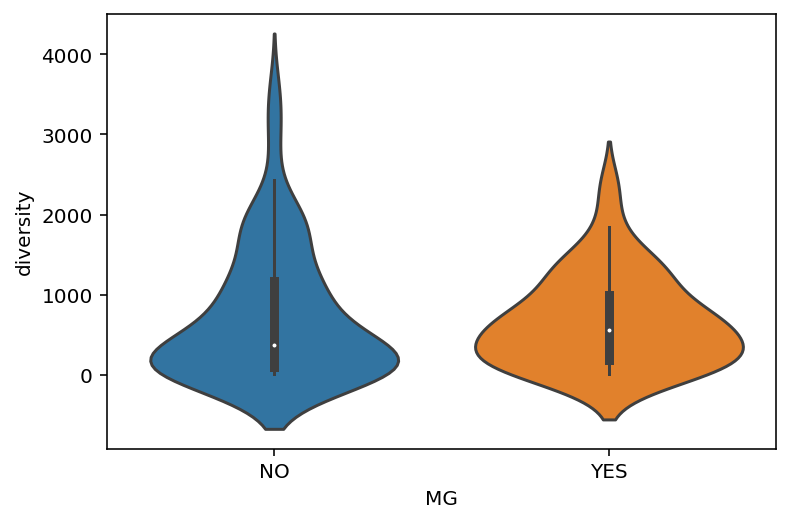

In [56]:
sns.violinplot(data=df_stats, y='diversity', x='MG')

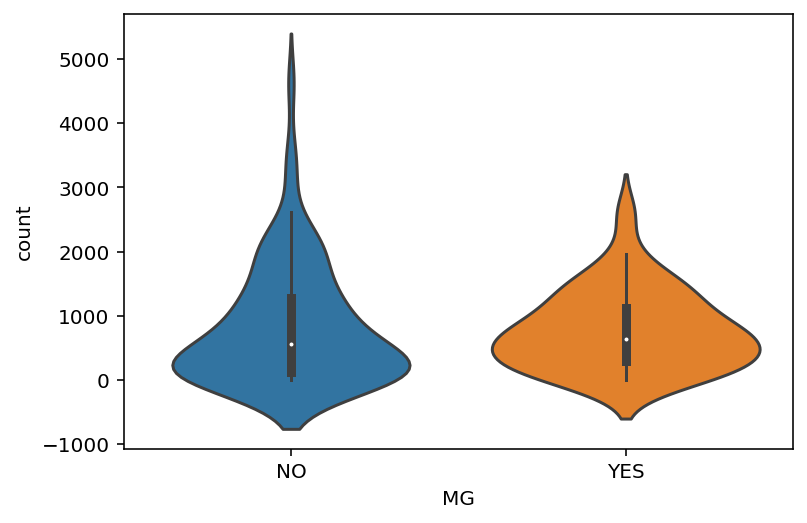

In [57]:
sns.violinplot(data=df_stats, y='count', x='MG')

In [58]:
df_stats['freq'] = df_stats['diversity'] / df_stats['count']

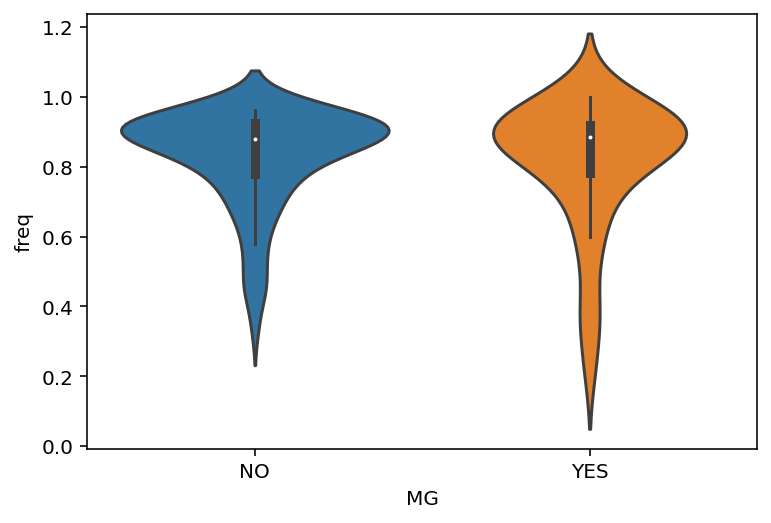

In [59]:
sns.violinplot(data=df_stats, y='freq', x='MG')

In [60]:
# chain = 'TRB'
os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)

df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

i = 0
for pos,row in df_stats.iterrows():
    s = row['sample_id']
    mg = row['MG']
    d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
    d['sample_id'] = s
    d['MG'] = mg

    if i == 0:
        df_vdj = d.copy()
        i = 1
    else:
        df_vdj = pd.concat([df_vdj, d], axis=0)


ser_cdr3 = df_vdj.groupby('cdr3aa').count()['sample_id']
ser_cdr3 = ser_cdr3[ser_cdr3 >= 4]

list_pval = []
list_y = []
list_n = []
for cdr, _ in ser_cdr3.iteritems():
#     print(cdr)
#     print(df_vdj.loc[df_vdj.cdr3aa == cdr, 'MG'].value_counts())
    y_all = df_stats['MG'].value_counts()['YES']
    n_all = df_stats['MG'].value_counts()['NO']
    try:
        y = df_vdj.loc[df_vdj.cdr3aa == cdr, 'MG'].value_counts()['YES']
    except:
        y = 0

    try:
        n = df_vdj.loc[df_vdj.cdr3aa == cdr, 'MG'].value_counts()['NO']
    except:
        n = 0

    pval = stats.fisher_exact([[y,n],[y_all-y, n_all-n]], alternative='greater')[1]
#     print(pval)
    list_pval.append(pval)
    list_y.append(y)
    list_n.append(n)

df_cdr3 = pd.DataFrame(ser_cdr3)
df_cdr3.columns = ['detected']
df_cdr3['MG'] = list_y
df_cdr3['nonMG'] = list_n
df_cdr3['pval'] = list_pval

# df_cdr3.sort_values(by='pval').to_csv('vdjfiles_{}/CDR3_stats.csv'.format(chain))

In [61]:
df_cdr3.sort_values(by='pval').head(20)

,detected,MG,nonMG,pval
cdr3aa,,,,
CASSPQGYEQYF,5,4,1,0.025445
CASSLGGEQFF,5,4,1,0.025445
CASSSTDTQYF,5,4,1,0.025445
CASSSQETQYF,11,6,5,0.060935
CASSSLTDTQYF,4,3,1,0.075006
CASSGGNTEAFF,4,3,1,0.075006
CASSSDRNTEAFF,4,3,1,0.075006
CASRQGNTEAFF,4,3,1,0.075006
CASSSGTNYGYTF,4,3,1,0.075006


In [68]:
df_vdj[df_vdj.cdr3aa == 'CASSPQGYEQYF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
1248,1,0.000650,TGTGCCAGCAGCCCCCAAGGCTACGAGCAGTACTTC,CASSPQGYEQYF,TRBV7-9,.,TRBJ2-7,11,-1,-1,20,TCGA-4V-A9QS,YES
105,1,0.006849,TGTGCCAGCAGTCCACAGGGCTACGAGCAGTACTTC,CASSPQGYEQYF,TRBV12-4,TRBD1,TRBJ2-7,11,14,19,20,TCGA-XU-A92V,YES
1152,1,0.000665,TGTGCCAGCAGTCCTCAGGGCTACGAGCAGTACTTC,CASSPQGYEQYF,TRBV12-3,TRBD1,TRBJ2-7,11,15,19,20,TCGA-XU-AAXX,YES
882,1,0.000896,TGTGCCAGCAGCCCACAGGGCTACGAGCAGTACTTC,CASSPQGYEQYF,TRBV14,TRBD1,TRBJ2-7,12,14,19,20,TCGA-XM-AAZ1,NO
201,1,0.001684,TGCGCCAGCAGCCCCCAGGGCTACGAGCAGTACTTC,CASSPQGYEQYF,TRBV5-1,TRBD1,TRBJ2-7,11,15,19,20,TCGA-XU-A930,YES


In [69]:
df_vdj[df_vdj.cdr3aa == 'CASSLGGEQFF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
2219,1,0.000384,TGTGCCAGCAGCTTAGGAGGTGAGCAGTTCTTC,CASSLGGEQFF,TRBV11-1,.,TRBJ2-1,15,-1,-1,20,TCGA-X7-A8DG,YES
1397,1,0.000609,TGTGCCAGCAGCTTGGGGGGCGAGCAGTTCTTC,CASSLGGEQFF,TRBV13,TRBD1,TRBJ2-1,13,15,20,21,TCGA-XU-AAXV,YES
1285,1,0.000665,TGTGCCAGCAGCTTAGGGGGTGAGCAGTTCTTC,CASSLGGEQFF,TRBV7-2,.,TRBJ2-1,15,-1,-1,20,TCGA-XU-AAXX,YES
985,1,0.000912,TGCGCCAGCAGCTTGGGAGGTGAGCAGTTCTTC,CASSLGGEQFF,TRBV5-1,.,TRBJ2-1,15,-1,-1,20,TCGA-X7-A8M8,NO
642,1,0.001274,TGCGCCAGCAGCTTAGGGGGTGAGCAGTTCTTC,CASSLGGEQFF,TRBV5-1,TRBD1,TRBJ2-1,13,14,19,20,TCGA-X7-A8M7,YES


In [70]:
df_vdj[df_vdj.cdr3aa == 'CASSSTDTQYF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
794,1,0.001101,TGTGCCAGCAGCTCCACAGATACGCAGTATTTT,CASSSTDTQYF,TRBV27,.,TRBJ2-3,10,-1,-1,14,TCGA-YT-A95G,YES
97,2,0.001528,TGTGCCAGCAGCTCTACAGATACGCAGTATTTT,CASSSTDTQYF,TRBV7-9,.,TRBJ2-3,12,-1,-1,15,TCGA-3S-AAYX,YES
160,2,0.001541,TGTGCCAGCAGTTCCACAGATACGCAGTATTTT,CASSSTDTQYF,TRBV27,.,TRBJ2-3,12,-1,-1,14,TCGA-ZB-A96G,YES
78,2,0.004695,TGTGCCAGCAGTTCTACAGATACGCAGTATTTT,CASSSTDTQYF,TRBV27,.,TRBJ2-3,12,-1,-1,15,TCGA-4V-A9QR,YES
3419,1,0.000216,TGTGCCAGCAGCTCCACAGATACGCAGTATTTT,CASSSTDTQYF,TRBV5-4,.,TRBJ2-3,12,-1,-1,14,TCGA-X7-A8D7,NO


In [71]:
df_vdj[df_vdj.cdr3aa == 'CASSSQETQYF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
79,2,0.001416,TGTGCCAGCAGCTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV13,.,TRBJ2-5,12,-1,-1,14,TCGA-XU-A92U,NO
777,1,0.001101,TGTGCCAGCTCATCTCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV18,.,TRBJ2-5,11,-1,-1,15,TCGA-YT-A95G,YES
1290,1,0.000665,TGTGCCAGCAGCTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV11-2,.,TRBJ2-5,12,-1,-1,14,TCGA-XU-AAXX,YES
159,2,0.001541,TGTGCCAGCAGTTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV6-6,.,TRBJ2-5,12,-1,-1,14,TCGA-ZB-A96G,YES
3081,1,0.000284,TGTGCCAGCAGCTCACAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV11-2,.,TRBJ2-5,12,-1,-1,15,TCGA-ZB-A96P,NO
1886,1,0.000447,TGTGCCAGCAGTTCACAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV12-3,.,TRBJ2-5,12,-1,-1,15,TCGA-XU-A92W,NO
1933,1,0.000447,TGCGCCAGCAGCTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV5-1,.,TRBJ2-5,12,-1,-1,14,TCGA-XU-A92W,NO
509,1,0.001517,TGTGCCAGCAGCTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV7-6,.,TRBJ2-5,12,-1,-1,14,TCGA-4V-A9QI,YES
430,1,0.001866,TGTGCCAGCAGCTCACAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV7-3,.,TRBJ2-5,12,-1,-1,15,TCGA-4V-A9QW,YES
474,1,0.001770,TGTGCCAGCAGTTCCCAAGAGACCCAGTACTTC,CASSSQETQYF,TRBV27,.,TRBJ2-5,12,-1,-1,14,TCGA-YT-A95E,NO


In [72]:
df_vdj.head()

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
0,3,0.025000,TGTGCCAGCAGTTTATCCGGGGGTAACTATGGCTACACCTTC,CASSLSGGNYGYTF,TRBV28,TRBD1,TRBJ1-2,15,16,20,23,TCGA-XH-A853,NO
1,3,0.025000,TGTGCCAGTAGTACTCCGGGGAATGAGCAGTTCTTC,CASSTPGNEQFF,TRBV19,TRBD1,TRBJ2-1,12,15,19,21,TCGA-XH-A853,NO
2,2,0.016667,TGCGCCAGCAGCCAAGACCCCACAGGGATCAATCAGCCCCAGCATTTT,CASSQDPTGINQPQHF,TRBV4-1,TRBD1,TRBJ1-5,16,21,26,29,TCGA-XH-A853,NO
3,2,0.016667,TGTGCCAGCAGTGACGGAAACACCATATATTTT,CASSDGNTIYF,TRBV6-4,.,TRBJ1-3,14,-1,-1,15,TCGA-XH-A853,NO
4,1,0.008333,TGTGCCACCAGCAGAGATCGGGGGGGCCGTCGCAATCAGCCCCAGC...,CATSRDRGGRRNQPQHF,TRBV15,TRBD1,TRBJ1-5,18,21,26,31,TCGA-XH-A853,NO


In [73]:
df_vdj[df_vdj.cdr3aa == 'CASSFGGDEQFF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
0,282,0.474747,TGTGCCAGCAGTTTTGGAGGCGATGAGCAGTTCTTC,CASSFGGDEQFF,TRBV27,TRBD2,TRBJ2-1,13,15,19,22,TCGA-XU-A930,YES
7,6,0.010101,TGTGCCAGCAGTTTTGGAGGCGATGAGCAGTTCTTC,CASSFGGDEQFF,TRBV12-3,TRBD2,TRBJ2-1,13,15,19,22,TCGA-XU-A930,YES


In [74]:
df_vdj[df_vdj.cdr3aa == 'CASGLANYEQYF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
1,59,0.141827,TGTGCCAGCGGCCTAGCGAACTACGAGCAGTACTTC,CASGLANYEQYF,TRBV7-9,.,TRBJ2-7,17,-1,-1,20,TCGA-3G-AB19,YES
2,33,0.079327,TGTGCCAGCGGCCTAGCGAACTACGAGCAGTACTTC,CASGLANYEQYF,TRBV11-1,.,TRBJ2-7,17,-1,-1,20,TCGA-3G-AB19,YES
137,1,0.002404,TGTGCCAGCGGCCTAGCGAACTACGAGCAGTACTTC,CASGLANYEQYF,TRBV7-9,.,TRBJ2-5,17,-1,-1,27,TCGA-3G-AB19,YES


In [75]:
df_vdj[df_vdj.cdr3aa == 'CASSESNTGELFF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
0,73,0.175481,TGCGCCAGCAGCGAGTCAAACACCGGGGAGCTGTTTTTT,CASSESNTGELFF,TRBV4-1,.,TRBJ2-2,11,-1,-1,18,TCGA-3G-AB19,YES


In [76]:
df_vdj.groupby(['cdr3aa', 'MG']).sum().sort_values(by='count', ascending=False).head()

,,count,freq,VEnd,DStart,DEnd,JStart
cdr3aa,MG,,,,,,
CASGLAGDVEQFF,NO,366,0.490617,40,28,41,78
CASSFGGDEQFF,YES,288,0.484848,26,30,38,44
CASGLANYEQYF,YES,93,0.223558,51,-3,-3,67
CASSESNTGELFF,YES,73,0.175481,11,-1,-1,18
CASGPRGTNLNEQFF,NO,60,0.101351,8,15,20,29


In [163]:
for chain in ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']:
    os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)
    
    df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

    i = 0
    for pos,row in df_stats.iterrows():
        s = row['sample_id']
        mg = row['MG']
        d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
        d['sample_id'] = s
        d['MG'] = mg

        if i == 0:
            df_vdj = d.copy()
            i = 1
        else:
            df_vdj = pd.concat([df_vdj, d], axis=0)


    ser_cdr3 = df_vdj.groupby('cdr3aa').count()['sample_id']
    ser_cdr3 = ser_cdr3[ser_cdr3 >= 4]

    list_pval = []
    list_y = []
    list_n = []
    for cdr, _ in ser_cdr3.iteritems():
    #     print(cdr)
    #     print(df_vdj.loc[df_vdj.cdr3aa == cdr, 'MG'].value_counts())
        y_all = df_stats['MG'].value_counts()['YES']
        n_all = df_stats['MG'].value_counts()['NO']
        try:
            y = df_vdj.loc[df_vdj.cdr3aa == cdr, ['sample_id', 'MG']].drop_duplicates()['MG'].value_counts()['YES']
        except:
            y = 0

        try:
            n = df_vdj.loc[df_vdj.cdr3aa == cdr, ['sample_id', 'MG']].drop_duplicates()['MG'].value_counts()['NO']
        except:
            n = 0

        pval = stats.fisher_exact([[y,n],[y_all-y, n_all-n]], alternative='greater')[1]
    #     print(pval)
        list_pval.append(pval)
        list_y.append(y)
        list_n.append(n)

    df_cdr3 = pd.DataFrame(ser_cdr3)
    df_cdr3.columns = ['detected']
    df_cdr3['MG'] = list_y
    df_cdr3['nonMG'] = list_n
    df_cdr3['pval'] = list_pval

    df_cdr3.sort_values(by='pval').to_csv('vdjfiles_{}/CDR3_stats.csv'.format(chain))

In [162]:
df_vdj.loc[df_vdj.cdr3aa == 'CQAWDSSTVVF', ['sample_id', 'MG']].drop_duplicates()['MG'].value_counts()['YES']

24

In [147]:
ser_cdr3[ser_cdr3 == ser_cdr3.max()]

cdr3aa
CQAWDSSTVVF    188
Name: sample_id, dtype: int64

In [167]:
df_vdj.loc[df_vdj.cdr3aa == 'CMQALQTSYTF']

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
410,2,0.000852,TGCATGCAAGCTCTACAGACTTCGTACACTTTT,CMQALQTSYTF,IGKV2-28,.,IGKJ2,20,-1,-1,23,TCGA-XU-A92V,YES
677,2,0.000180,TGCATGCAAGCTCTACAAACTTCGTACACTTTT,CMQALQTSYTF,IGKV2-28,.,IGKJ2,20,-1,-1,23,TCGA-XU-A930,YES
1650,1,0.000141,TGCATGCAAGCTCTACAGACTTCGTACACTTTT,CMQALQTSYTF,IGKV2-28,.,IGKJ2,20,-1,-1,23,TCGA-4X-A9FA,YES
51,1,0.007246,TGCATGCAAGCTCTACAAACCTCGTACACCTTT,CMQALQTSYTF,IGKV2-28,.,IGKJ2,19,-1,-1,23,TCGA-ZB-A96F,YES


## alpha diversity

In [671]:
from scipy import stats

In [672]:
def gini(array):
    """Calculate the Gini coefficient of a numpy array."""
    # based on bottom eq: http://www.statsdirect.com/help/content/image/stat0206_wmf.gif
    # from: http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    array = array.flatten() #all values are treated equally, arrays must be 1d
    if np.amin(array) < 0:
        array -= np.amin(array) #values cannot be negative
    array += 0.0000001 #values cannot be 0
    array = np.sort(array) #values must be sorted
    index = np.arange(1,array.shape[0]+1) #index per array element
    n = array.shape[0]#number of array elements
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array))) #Gini coefficient

In [673]:
def simpson_di(data):

    """ Given a hash { 'species': count } , returns the Simpson Diversity Index
    
    >>> simpson_di({'a': 10, 'b': 20, 'c': 30,})
    0.3888888888888889
    """

    def p(n, N):
        """ Relative abundance """
        if n is  0:
            return 0
        else:
            return float(n)/N

    N = sum(data.values())
    
    return sum(p(n, N)**2 for n in data.values() if n is not 0)

In [674]:
def otu_clustering(df_cdr3aa_count):
    df_cdr3aa_count = df_cdr3aa_count.groupby('cdr3aa').sum()
    return df_cdr3aa_count['count']

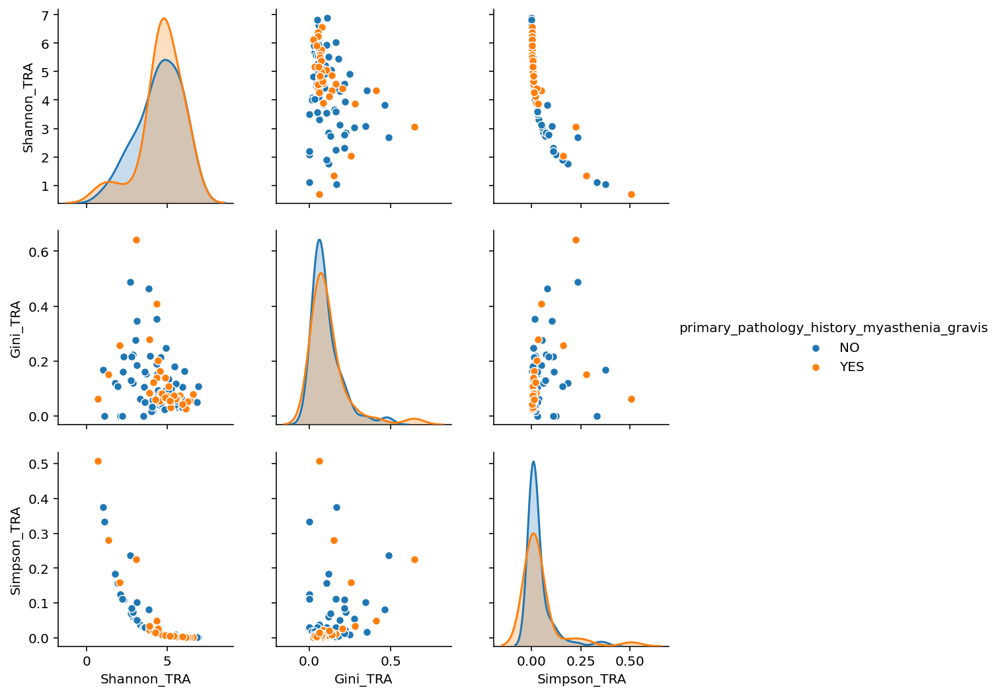

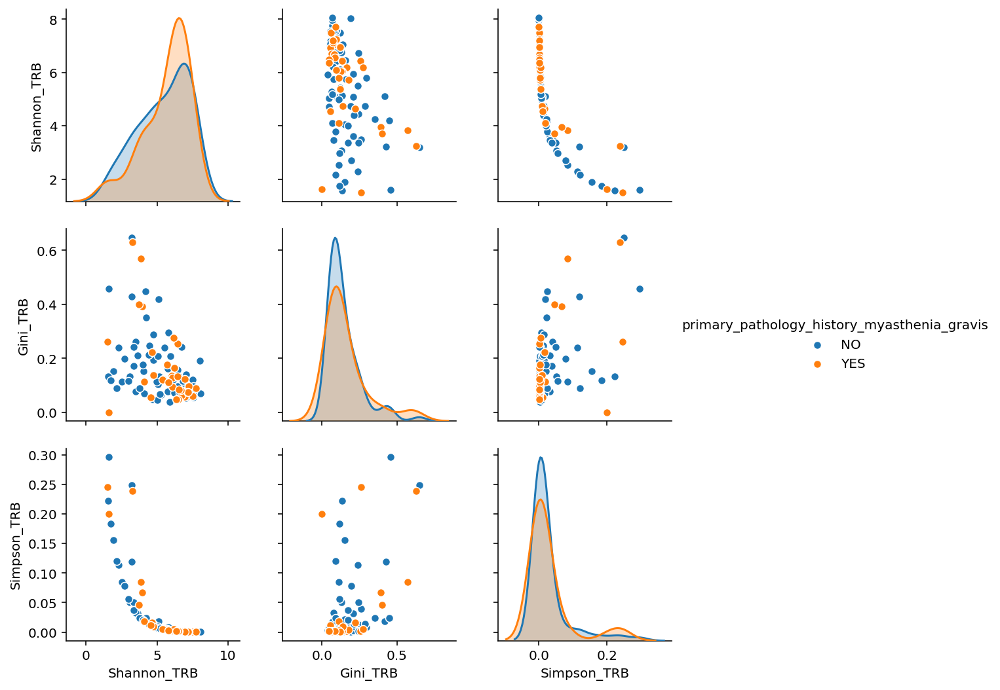

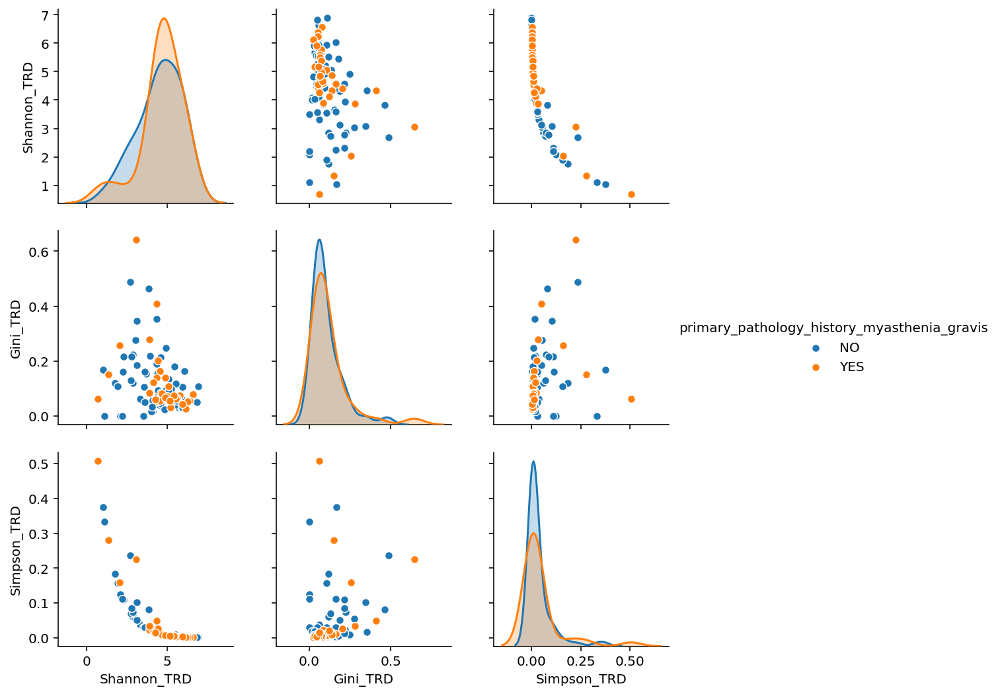

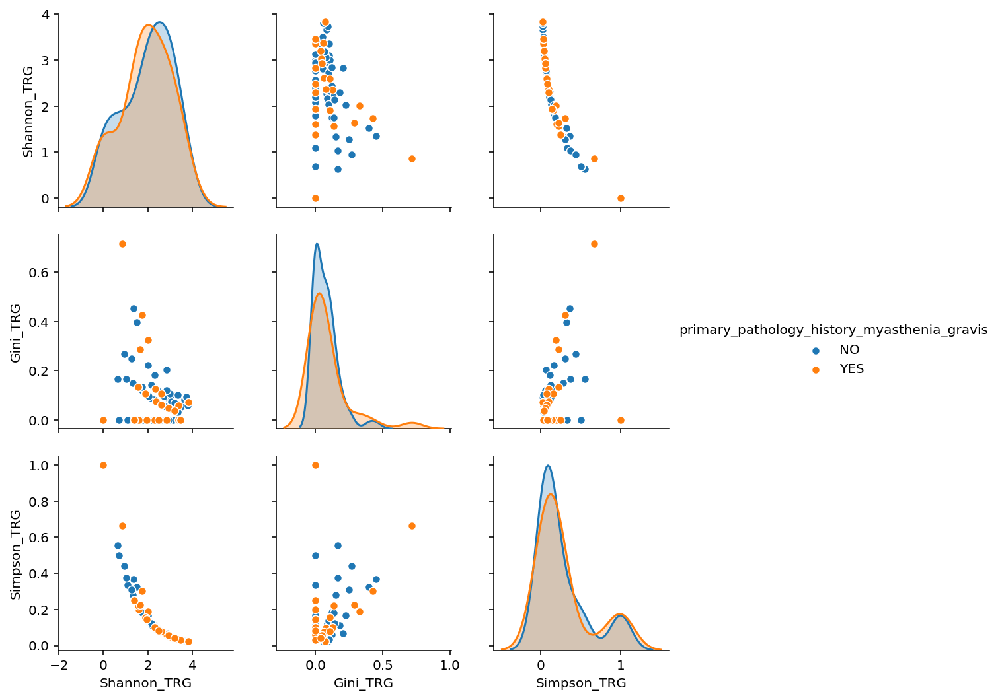

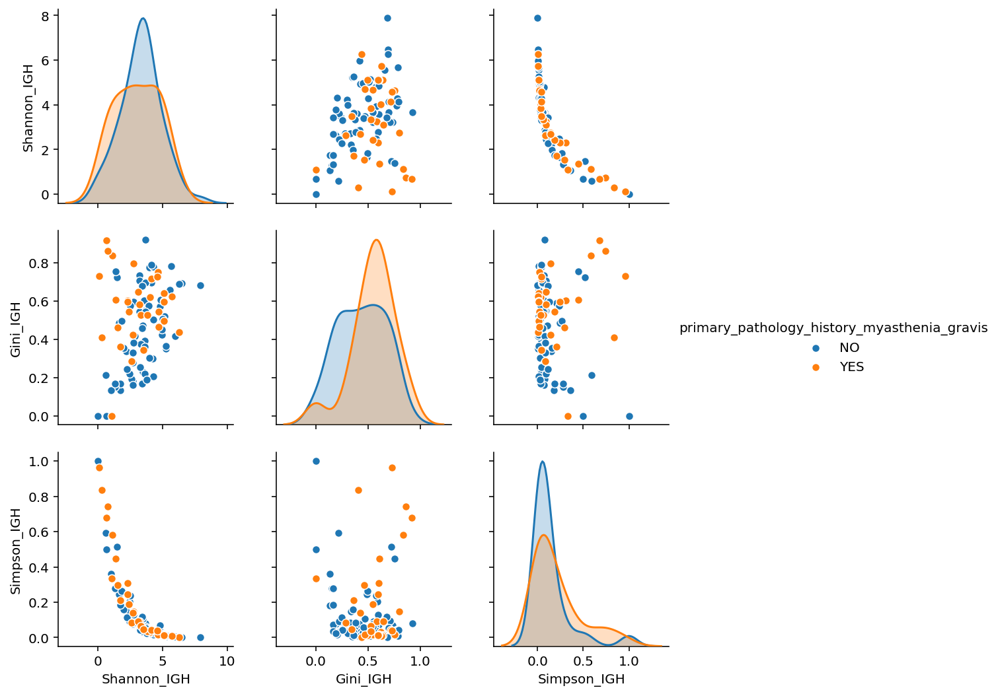

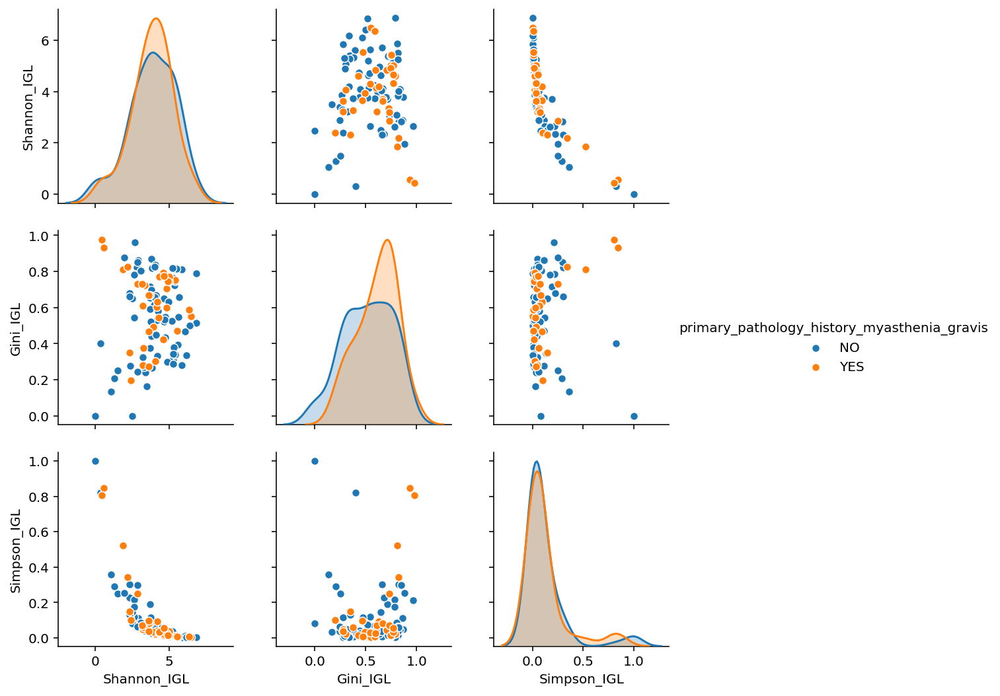

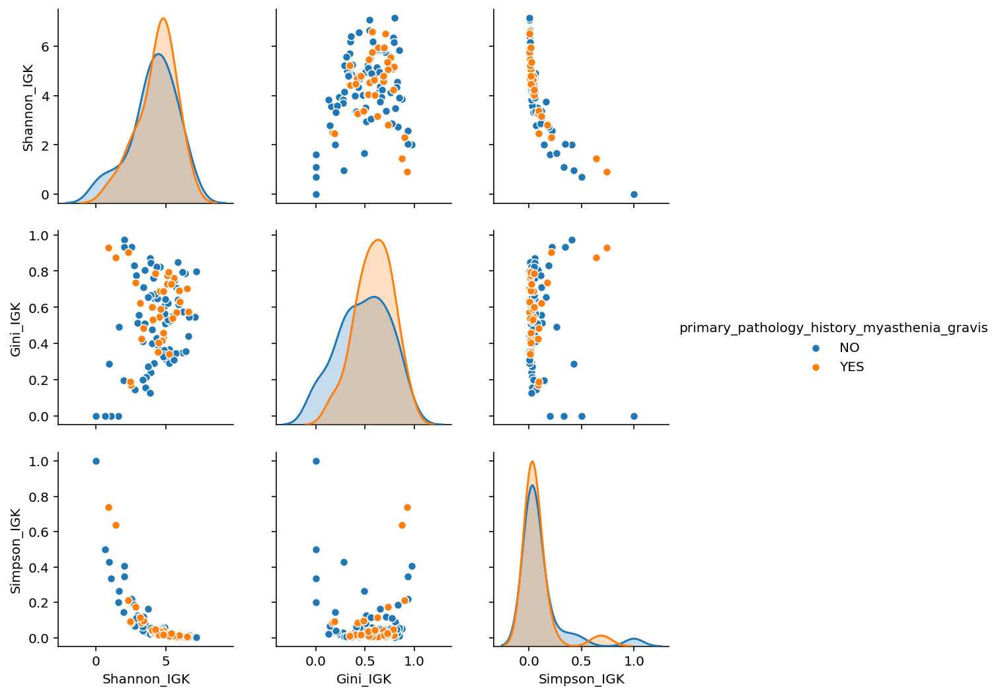

In [675]:
df_cli_div = df_cli.copy()

for chain in ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']:
# for chain in ['TRB']:
    os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)
    
    df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

    list_ent = []
    list_gini = []
    list_sim = []
    i = 0
    for pos,row in df_stats.iterrows():
        s = row['sample_id']
        mg = row['MG']
        d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
        d['sample_id'] = s
        
        if d.shape[0] == 0:
            list_ent.append(np.nan)
            list_gini.append(np.nan)
            list_sim.append(np.nan)

        else:
            list_ent.append(stats.entropy(otu_clustering(d)))
            list_gini.append(gini(np.array(otu_clustering(d).astype(float))))
            list_sim.append(simpson_di(otu_clustering(d).to_dict()))
    
    _d = pd.DataFrame([list(df_stats['sample_id']), list_ent, list_gini, list_sim]).T
    _d.columns = ['bcr_patient_barcode', 'Shannon_{}'.format(chain), 'Gini_{}'.format(chain), 'Simpson_{}'.format(chain)]
    df_cli_div = pd.merge(df_cli_div, _d, on='bcr_patient_barcode', how='left')
    
    d = df_cli_div[['Shannon_{}'.format(chain), 'Gini_{}'.format(chain), 'Simpson_{}'.format(chain), 'primary_pathology_history_myasthenia_gravis']]
    d = d.dropna()
#     print(d.head())
    sns.pairplot(d, hue='primary_pathology_history_myasthenia_gravis')
    plt.savefig('vdjfiles_{}/out/pair_diversity.pdf'.format(chain))

In [676]:
for chain in ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']:
# for chain in ['TRB']:
    print(chain)
    for s in ['Shannon', 'Gini', 'Simpson']:
        res = stats.mannwhitneyu(
            df_cli_div.loc[df_cli_div['primary_pathology_history_myasthenia_gravis'] == 'YES', '{s}_{c}'.format(s=s, c=chain)].dropna(),
            df_cli_div.loc[df_cli_div['primary_pathology_history_myasthenia_gravis'] == 'NO', '{s}_{c}'.format(s=s, c=chain)].dropna())
        print(res)

TRA
MannwhitneyuResult(statistic=1294.0, pvalue=0.27308939143093514)
MannwhitneyuResult(statistic=1288.0, pvalue=0.26112120380056014)
MannwhitneyuResult(statistic=1323.0, pvalue=0.33447020508964137)
TRB
MannwhitneyuResult(statistic=1328.0, pvalue=0.34558187800732343)
MannwhitneyuResult(statistic=1364.0, pvalue=0.42899792456350827)
MannwhitneyuResult(statistic=1348.0, pvalue=0.3912853514828559)
TRD
MannwhitneyuResult(statistic=1294.0, pvalue=0.27308939143093514)
MannwhitneyuResult(statistic=1288.0, pvalue=0.26112120380056014)
MannwhitneyuResult(statistic=1323.0, pvalue=0.33447020508964137)
TRG
MannwhitneyuResult(statistic=1078.0, pvalue=0.3530344222632428)
MannwhitneyuResult(statistic=975.0, pvalue=0.13143276205836096)
MannwhitneyuResult(statistic=1066.0, pvalue=0.3218492653448196)
IGH
MannwhitneyuResult(statistic=1097.0, pvalue=0.23267108946467124)
MannwhitneyuResult(statistic=845.0, pvalue=0.007148744559381981)
MannwhitneyuResult(statistic=1061.0, pvalue=0.1646034930568891)
IGL
Mannwh

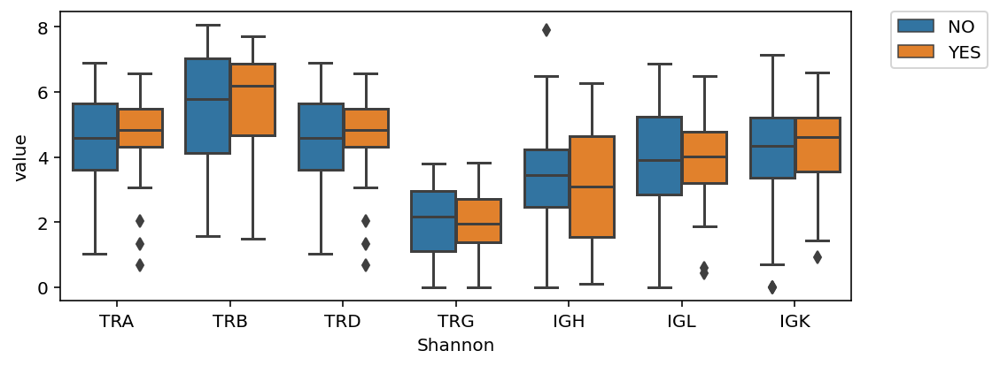

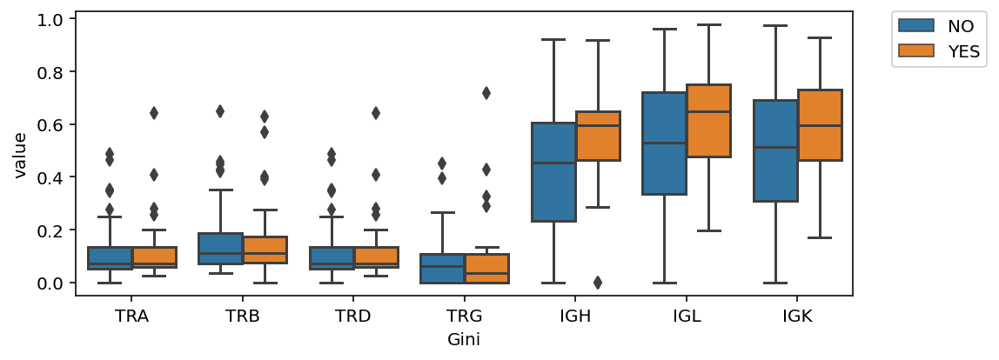

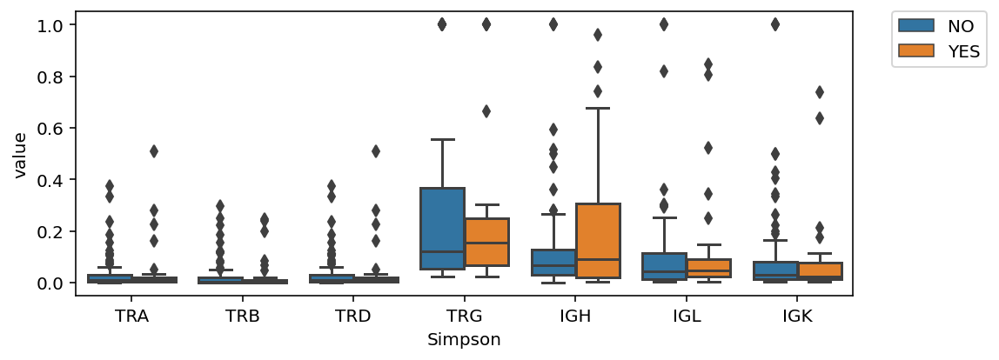

In [677]:
for s in ['Shannon', 'Gini', 'Simpson']:
    d = df_cli_div[[x for x in df_cli_div.columns if s in x] + ['primary_pathology_history_myasthenia_gravis']].melt(
        id_vars=['primary_pathology_history_myasthenia_gravis'], var_name=s)
    d[s] = d[s].str.split('_').str.get(1)
    plt.figure(figsize=(8,3))
#     sns.swarmplot(data=d, x=s, y='value', hue='primary_pathology_history_myasthenia_gravis', dodge=True,s=3, palette=['dimgray', 'dimgray'])
    sns.boxplot(data=d, x=s, y='value', hue='primary_pathology_history_myasthenia_gravis', dodge=True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjplots/diversity_{}.pdf'.format(s), bbox_inches='tight')

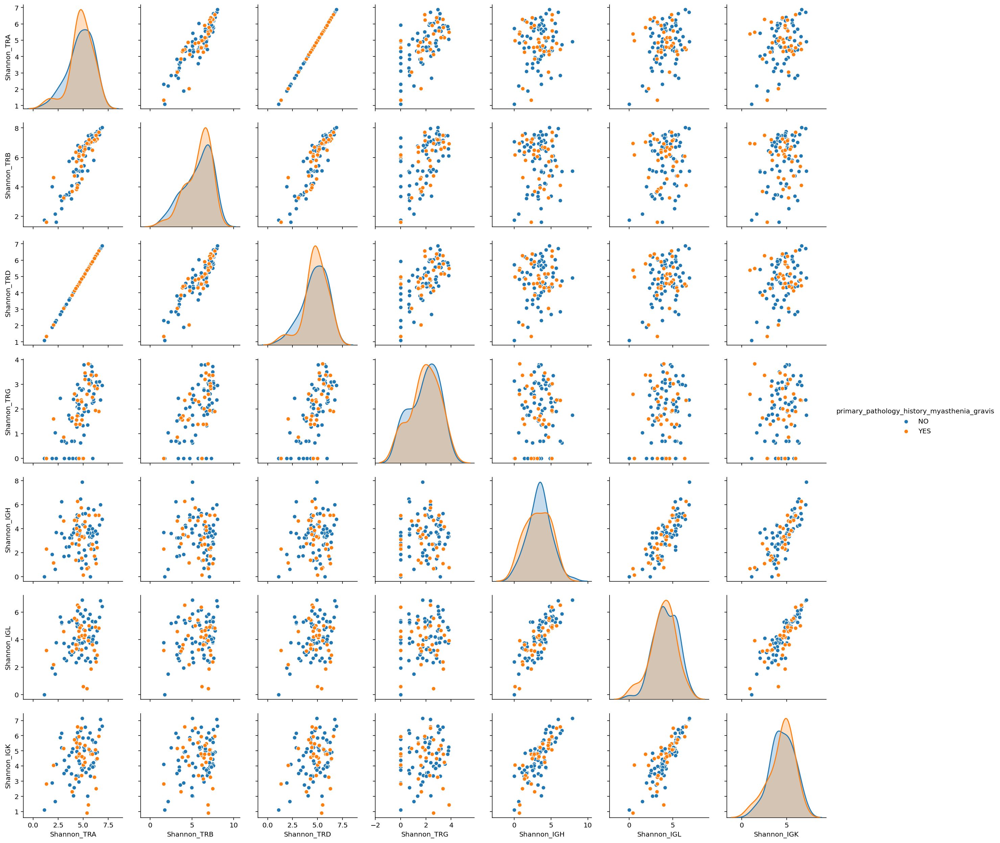

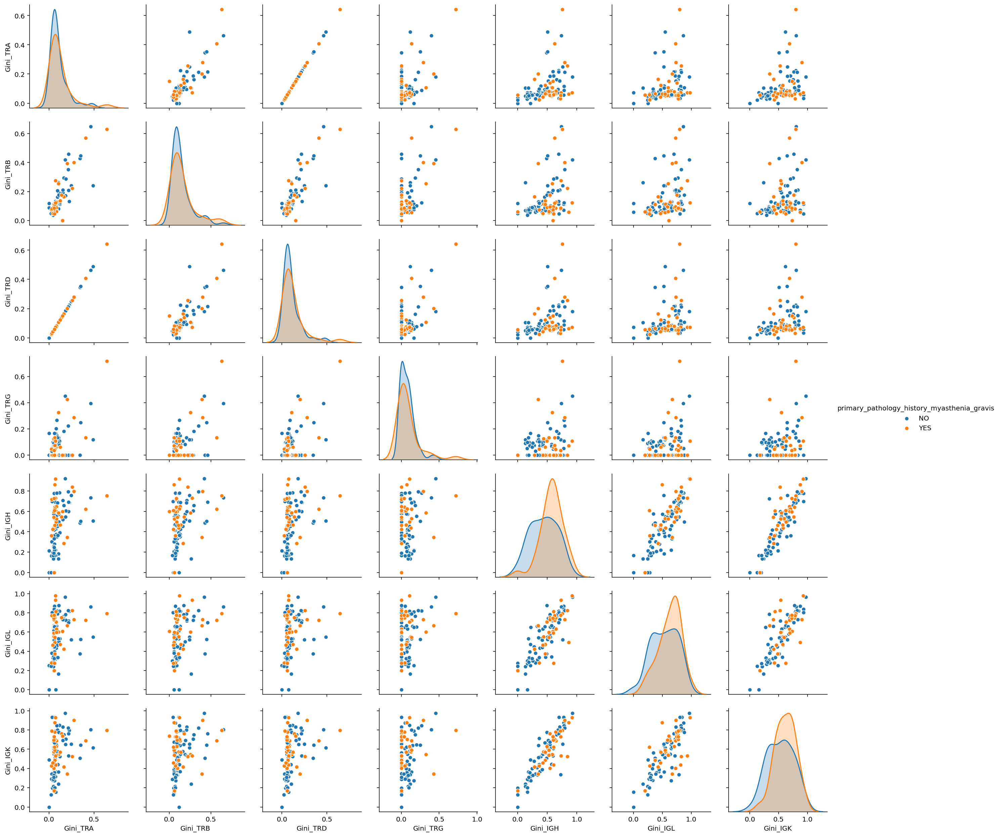

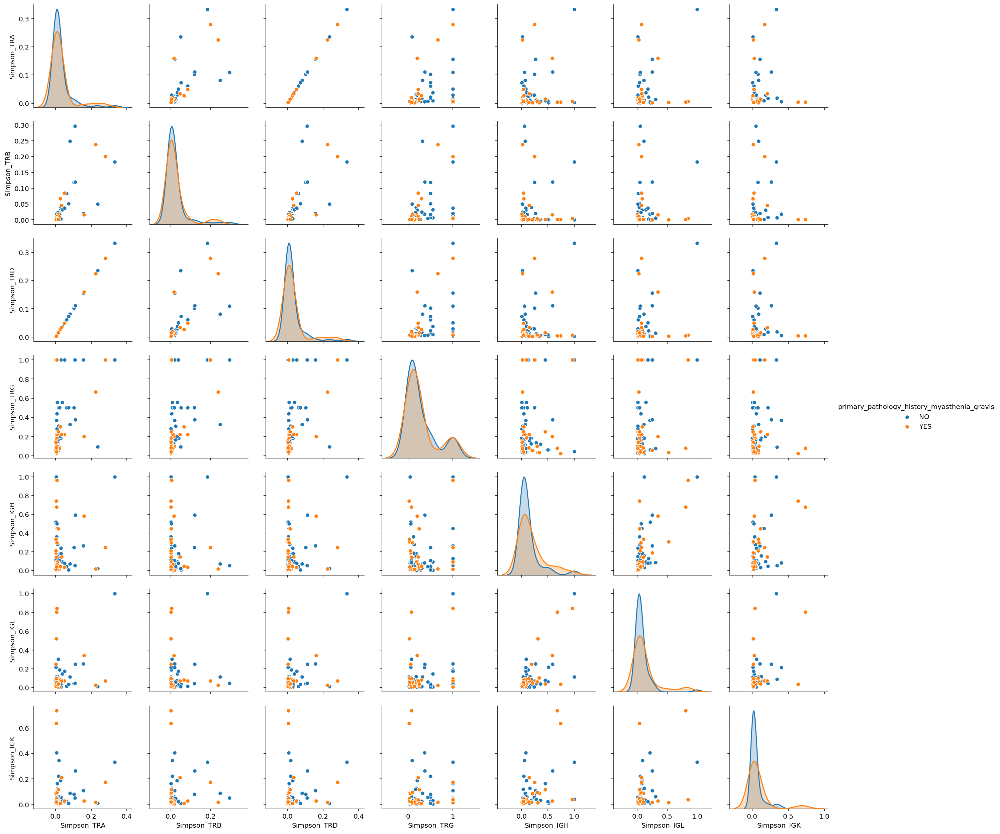

In [678]:
for s in ['Shannon', 'Gini', 'Simpson']:
    d = df_cli_div[[x for x in df_cli_div.columns if s in x] + ['primary_pathology_history_myasthenia_gravis']]
    d = d.dropna()
    sns.pairplot(d, hue='primary_pathology_history_myasthenia_gravis')
    plt.savefig('vdjplots/pair_diversity_{}.pdf'.format(s), bbox_inches='tight')

## Beta diversity

Geometric mean of relative overlap frequencies

Fij=fijfji−−−−√
where fij=∑Nk=1ϕik is the total frequency of clonotypes that overlap between samples i and j in sample i.

https://vdjtools-doc.readthedocs.io/en/master/overlap.html

In [216]:
import os
import math

from sklearn.manifold import MDS
from scipy.sparse import csr_matrix

from skbio.diversity import get_beta_diversity_metrics
from skbio.diversity import beta_diversity
from skbio.stats.ordination import pcoa
from skbio.stats.distance import anosim

from skbio.alignment import StripedSmithWaterman
from skbio.alignment._pairwise import blosum50
from skbio import DistanceMatrix
from skbio.tree import nj

In [122]:
def make_tree_cdr3(target_sequences):
    l = []
    for i in range(len(target_sequences)):
        _l = []
        query = StripedSmithWaterman(target_sequences[i], protein=True, substitution_matrix=blosum50)
        for j in range(i):
    #         print(i,j)
            alignment = query(target_sequences[j])
            l.append([target_sequences[i], target_sequences[j], alignment.optimal_alignment_score])

    df_dist = pd.DataFrame(l)
    df_dist.columns = ['cdr3aa1', 'cdr3aa2', 'score']

    dict_target_sequences = {x:i for i, x in enumerate(target_sequences)}
    row = [dict_target_sequences[x] for x in df_dist['cdr3aa1']]
    col = [dict_target_sequences[x] for x in df_dist['cdr3aa2']]
    data = list(df_dist['score'])

    mat_dist = csr_matrix((data, (row, col)), shape=(len(target_sequences), len(target_sequences))).toarray()
    mat_dist += mat_dist.T

    dm_cdr3 = DistanceMatrix(mat_dist, target_sequences)
    tree_cdr3 = nj(dm_cdr3).root_at_midpoint()
    df_dist.score.hist(bins=50)

    return tree_cdr3

TRA
primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                     109
number of groups                  2
test statistic             0.996574
p-value                      0.5135
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender
TRB
primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                     109
number of groups                  2
test statistic              1.06847
p-value                      0.0945
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender
TRD
primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                     109
number of groups  

/home/yyasumizu/anaconda3/lib/python3.7/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:152: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.3657634871040179 and the largest is 2.447635862885501.
  RuntimeWarning


primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      73
number of groups                  2
test statistic              1.07487
p-value                      0.3546
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender
IGH


/home/yyasumizu/anaconda3/lib/python3.7/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:152: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.13922755327502537 and the largest is 1.5532624143277138.
  RuntimeWarning


primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      22
number of groups                  2
test statistic              1.08302
p-value                      0.3474
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender
IGL


/home/yyasumizu/anaconda3/lib/python3.7/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:152: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.13506827044118286 and the largest is 2.8742638633339843.
  RuntimeWarning


primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                     110
number of groups                  2
test statistic             0.835541
p-value                      0.9599
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender
IGK


/home/yyasumizu/anaconda3/lib/python3.7/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:152: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.0697463087266637 and the largest is 2.1920955017650674.
  RuntimeWarning


primary_pathology_history_myasthenia_gravis
method name               PERMANOVA
test statistic name        pseudo-F
sample size                     115
number of groups                  2
test statistic              0.96739
p-value                      0.6019
number of permutations         9999
Name: PERMANOVA results, dtype: object
stage_event_masaoka_stage
primary_pathology_histological_type_list
gender


<Figure size 432x288 with 0 Axes>

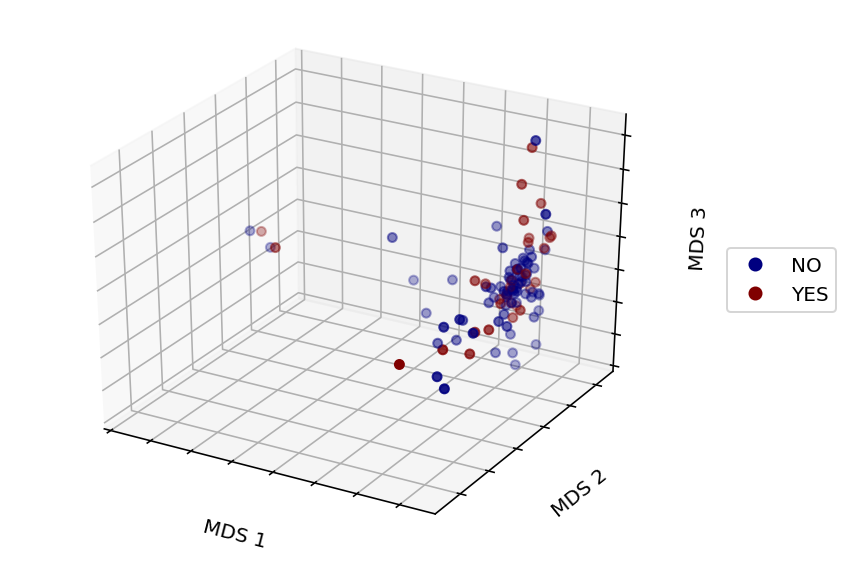

<Figure size 432x288 with 0 Axes>

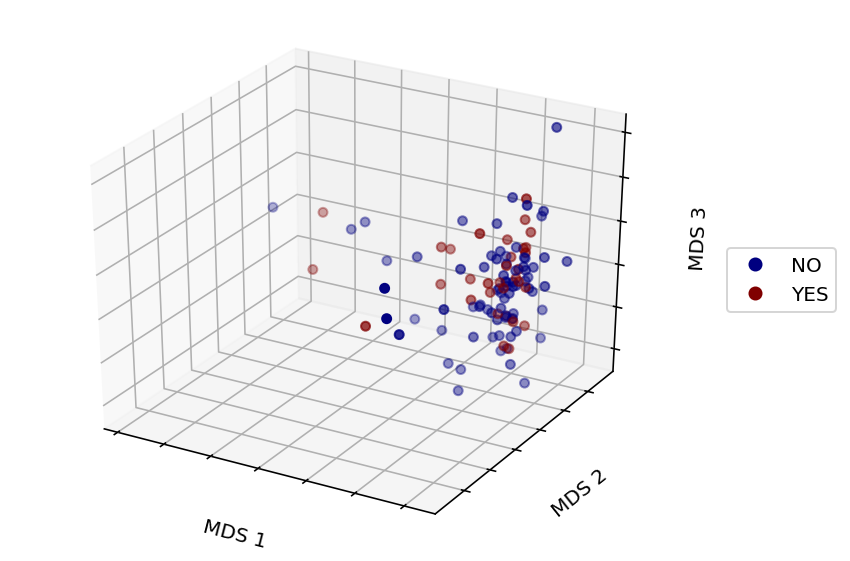

<Figure size 432x288 with 0 Axes>

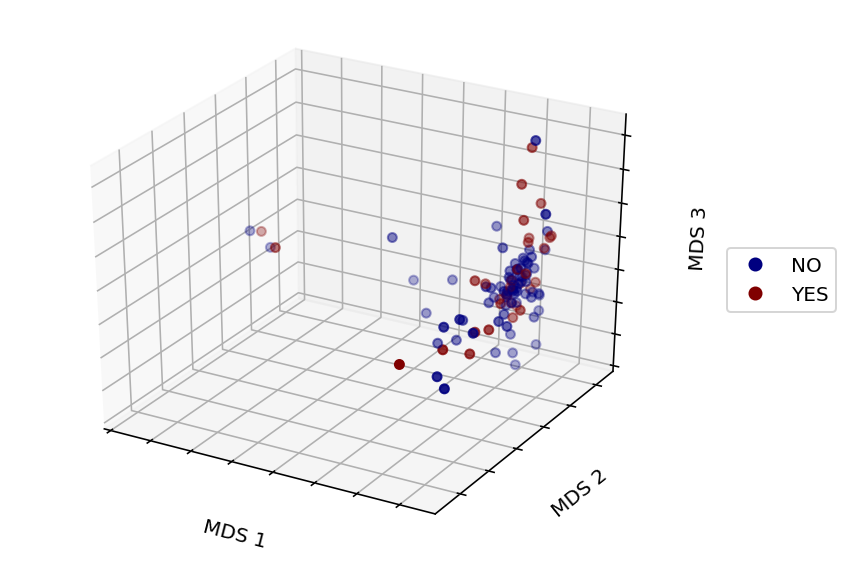

<Figure size 432x288 with 0 Axes>

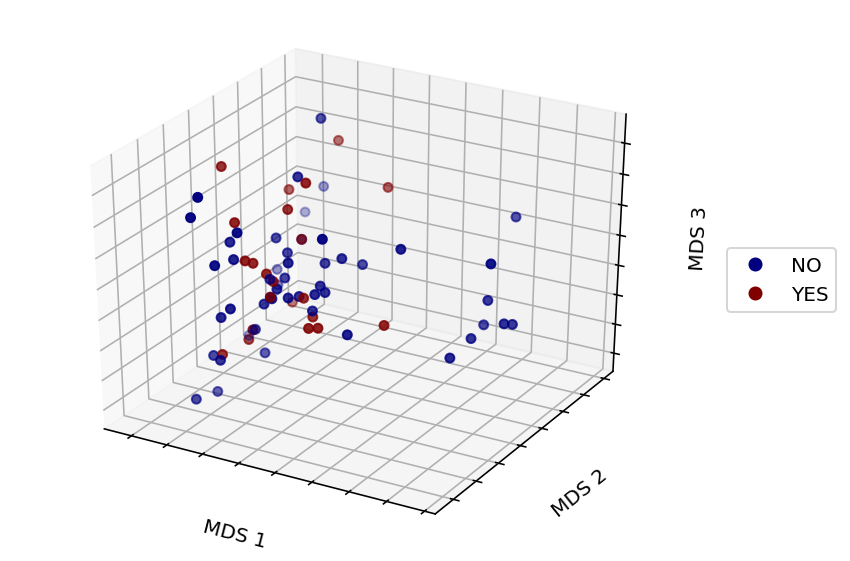

<Figure size 432x288 with 0 Axes>

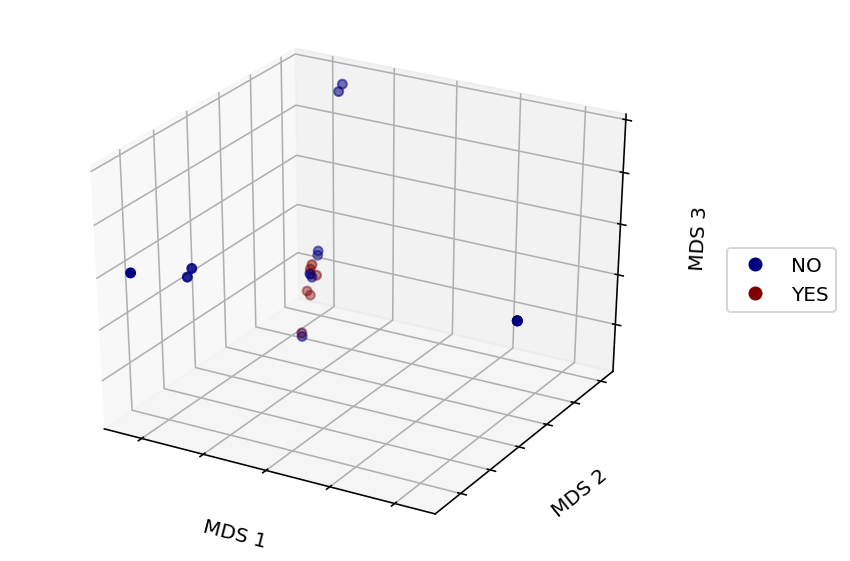

<Figure size 432x288 with 0 Axes>

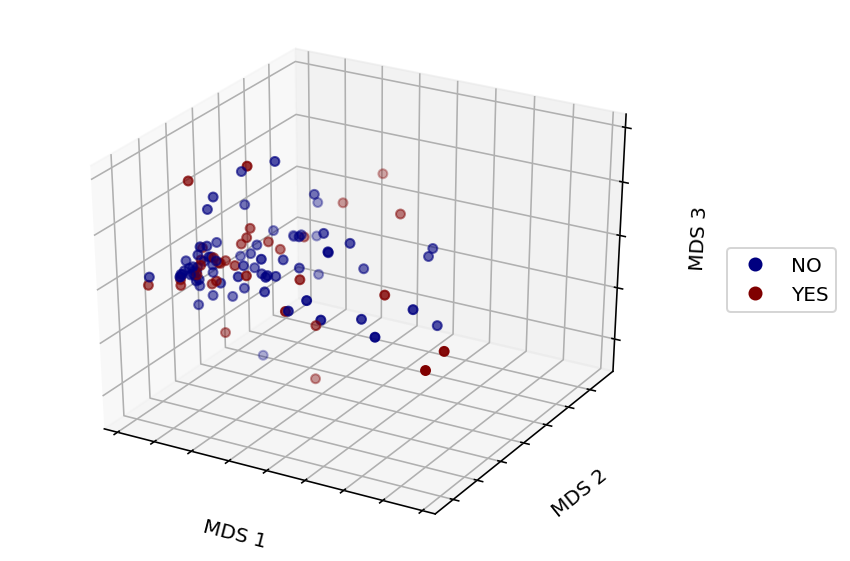

<Figure size 432x288 with 0 Axes>

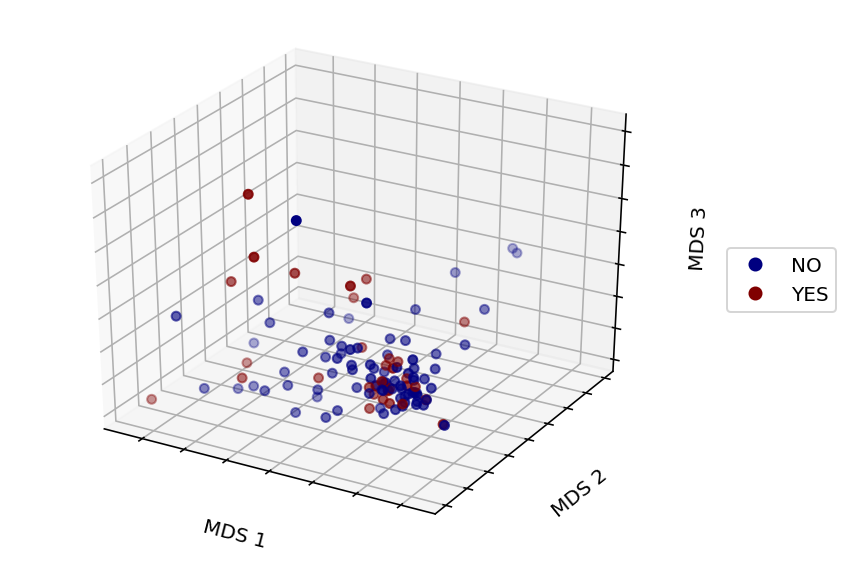

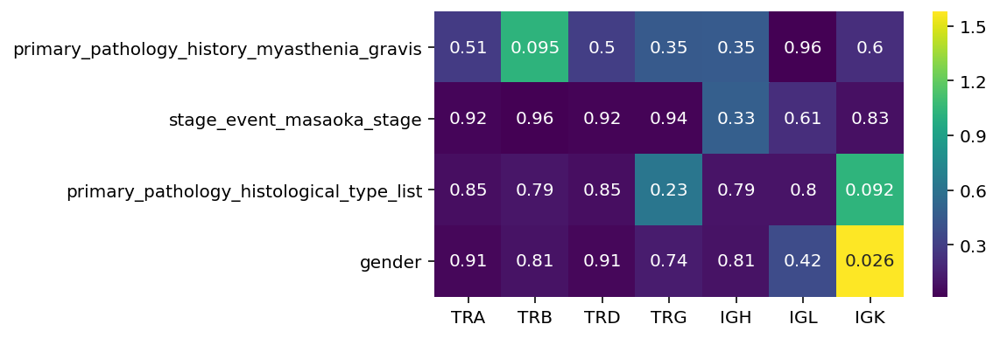

In [554]:
df_cli_div = df_cli.copy()


list_factors = ['primary_pathology_history_myasthenia_gravis', 'stage_event_masaoka_stage',
                'primary_pathology_histological_type_list', 'gender']
list_p = []

for chain in ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']:
# for chain in ['TRB']:
    print(chain)
    os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)
    
    df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

    list_ent = []
    list_gini = []
    list_sim = []
    i = 0
    for pos,row in df_stats.iterrows():
        s = row['sample_id']
        mg = row['MG']
        d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
        d = d.groupby(by='cdr3aa').sum()[['count']]
        d['sampleid'] = s
        
        if i == 0:
            df_cdr3 = d.copy()
            i = 1
        else:
            df_cdr3 = pd.concat([df_cdr3,d])
            
    df_cdr3.index.name = 'index'
    df_cdr3['cdr3aa'] = df_cdr3.index
    df_cdr3 = df_cdr3.reset_index(drop=True)
    
    df_cdr3_pivot = df_cdr3.pivot(index='sampleid', columns='cdr3aa').fillna(0)
    
    # used only overlaping cdr3s
    df_cdr3_pivot = df_cdr3_pivot.loc[:,(df_cdr3_pivot > 0).sum() >= 2].copy()
    df_cdr3_pivot = df_cdr3_pivot[df_cdr3_pivot.sum(axis=1) > 0]
    
    target_sequences = [x[1] for x in df_cdr3_pivot.columns]
#     tree_cdr3 = make_tree_cdr3(target_sequences)
#     dm = beta_diversity("braycurtis", df_cdr3_pivot, df_cdr3_pivot.index) 
    dm = beta_diversity("correlation", df_cdr3_pivot, df_cdr3_pivot.index) 
#     dm = beta_diversity("weighted_unifrac", df_cdr3_pivot, df_cdr3_pivot.index, tree=tree_cdr3,
#                        otu_ids=target_sequences)
    pc = pcoa(dm, number_of_dimensions=3)
    
    plt.figure()
    pc.plot(df_cli, 'primary_pathology_history_myasthenia_gravis', cmap='jet', axis_labels=('MDS 1', 'MDS 2', 'MDS 3'))
    plt.savefig('vdjfiles_{c}/out/MDS3d_MG.pdf'.format(c=chain), bbox_inches='tight')
    
    _l = []
    for f in list_factors:
        print(f)
        tmp_df_cli = df_cli.loc[list(dm.ids)]
        tmp_df_cli = tmp_df_cli[f].dropna()
        results = anosim(dm.filter(tmp_df_cli.index), pd.DataFrame(tmp_df_cli), column=f, permutations=9999)
#         results = permanova(dm.filter(tmp_df_cli.index), pd.DataFrame(tmp_df_cli), column=f, permutations=9999)
        
        _l.append(results['p-value'])
        if f == 'primary_pathology_history_myasthenia_gravis':
            print(results)
    list_p.append(_l)
    
df_anosim_p = pd.DataFrame(list_p).T
df_anosim_p.index = list_factors
df_anosim_p.columns = ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']
df_anosim_p.to_csv('vdjplots/anosim_p.csv')

plt.figure(figsize=(6,3))
sns.heatmap(-np.log10(df_anosim_p), cmap='viridis', annot=df_anosim_p)
plt.savefig('vdjplots/anosim_p.pdf', bbox_inches='tight')

In [200]:
for chain in ['TRB']:
    print(chain)
    os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)
    
    df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

    list_ent = []
    list_gini = []
    list_sim = []
    i = 0
    for pos,row in df_stats.iterrows():
        s = row['sample_id']
        mg = row['MG']
        d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
        d = d.groupby(by='cdr3aa').sum()[['freq']]
        d['sampleid'] = s
        
        if i == 0:
            df_cdr3 = d.copy()
            i = 1
        else:
            df_cdr3 = pd.concat([df_cdr3,d])
            
    df_cdr3.index.name = 'index'
    df_cdr3['cdr3aa'] = df_cdr3.index
    df_cdr3 = df_cdr3.reset_index(drop=True)
    
    df_cdr3_pivot = df_cdr3.pivot(index='sampleid', columns='cdr3aa').fillna(0)

TRB


In [175]:
df_intersect = pd.read_csv('vdjfiles_TRB/out/3.intersect.batch.aa.txt', sep='\t')
df_intersect.head()

/home/yyasumizu/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (73) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,1_sample_id,2_sample_id,div1,div2,div12,div21,count1,count2,count12,count21,freq1,freq2,freq12,freq21,R,Rs,D,F,F2,vJSD,vjJSD,vj2JSD,sJSD,Jaccard,MorisitaHorn,1_MG,1_bcr_patient_barcode,1_additional_studies,1_tissue_source_site,1_patient_id,1_bcr_patient_uuid,1_informed_consent_verified,1_icd_o_3_site,1_icd_o_3_histology,1_icd_10,1_tissue_prospective_collection_indicator,1_tissue_retrospective_collection_indicator,1_days_to_birth,1_gender,1_height,1_weight,1_race_list,1_ethnicity,1_other_dx,1_history_of_neoadjuvant_treatment,1_person_neoplasm_cancer_status,1_vital_status,1_days_to_last_followup,1_days_to_death,1_radiation_therapy,...,2_informed_consent_verified,2_icd_o_3_site,2_icd_o_3_histology,2_icd_10,2_tissue_prospective_collection_indicator,2_tissue_retrospective_collection_indicator,2_days_to_birth,2_gender,2_height,2_weight,2_race_list,2_ethnicity,2_other_dx,2_history_of_neoadjuvant_treatment,2_person_neoplasm_cancer_status,2_vital_status,2_days_to_last_followup,2_days_to_death,2_radiation_therapy,2_postoperative_rx_tx,2_post_op_ablation_embolization_tx,2_has_new_tumor_events_information,2_day_of_form_completion,2_month_of_form_completion,2_year_of_form_completion,2_has_follow_ups_information,2_has_drugs_information,2_has_radiations_information,2_project,2_stage_event_system_version,2_stage_event_clinical_stage,2_stage_event_pathologic_stage,2_stage_event_tnm_categories,2_stage_event_psa,2_stage_event_gleason_grading,2_stage_event_ann_arbor,2_stage_event_serum_markers,2_stage_event_igcccg_stage,2_stage_event_masaoka_stage,2_primary_pathology_tumor_tissue_site,2_primary_pathology_histological_type_list,2_primary_pathology_initial_pathologic_diagnosis_method,2_primary_pathology_init_pathology_dx_method_other,2_primary_pathology_days_to_initial_pathologic_diagnosis,2_primary_pathology_age_at_initial_pathologic_diagnosis,2_primary_pathology_year_of_initial_pathologic_diagnosis,2_primary_pathology_history_myasthenia_gravis,2_primary_pathology_section_myasthenia_gravis,2_age,2_..filter..
0,TCGA-XH-A853,TCGA-XU-A92T,114,11,0,0,120,19,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.617360,0.472860,0.872661,0.158260,0.0,NaN,NO,TCGA-XH-A853,NaN,XH,A853,9BBD057C-5A3B-4E04-8DF7-C2F0C1823084,YES,C37.9,8582/1,C37,NO,YES,-24556.0,MALE,165.0,88.0,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,915.0,NaN,NO,...,YES,C37.9,8582/3,C37,NO,YES,-29613.0,FEMALE,151.0,55.0,WHITE,NaN,No,No,TUMOR FREE,Alive,1012.0,NaN,NO,NO,NO,NO,12,11,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIa,Thymus,Thymoma; Type AB,Core needle biopsy,NaN,0.0,81.0,2010,NO,NaN,81,conv:MiXcr
1,TCGA-XH-A853,TCGA-YT-A95H,114,1822,0,0,120,2008,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170616,0.097607,0.561892,0.052004,0.0,NaN,NO,TCGA-XH-A853,NaN,XH,A853,9BBD057C-5A3B-4E04-8DF7-C2F0C1823084,YES,C37.9,8582/1,C37,NO,YES,-24556.0,MALE,165.0,88.0,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,915.0,NaN,NO,...,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69,conv:MiXcr
2,TCGA-XH-A853,TCGA-XM-A8R8,114,302,0,0,120,592,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.202847,0.140521,0.599009,0.116135,0.0,NaN,NO,TCGA-XH-A853,NaN,XH,A853,9BBD057C-5A3B-4E04-8DF7-C2F0C1823084,YES,C37.9,8582/1,C37,NO,YES,-24556.0,MALE,165.0,88.0,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,No,No,NaN,Alive,915.0,NaN,NO,...,YES,C37.9,8586/3,C37,NO,YES,-24508.0,FEMALE,156.0,61.0,ASIAN,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1112.0,NaN,NO,NO,NO,YES,28,3,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type C,Video-assisted Thorascopic Surgery (VATS),NaN,0.0,67.0,2010,NO,NaN,67,conv:MiXcr
3,TCGA-XH-A853,TCGA-ZB-A96D,114,1224,0,0,120,1301,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.174378,0.102808,0.568348,0.054221,0.0,NaN,NO,TC

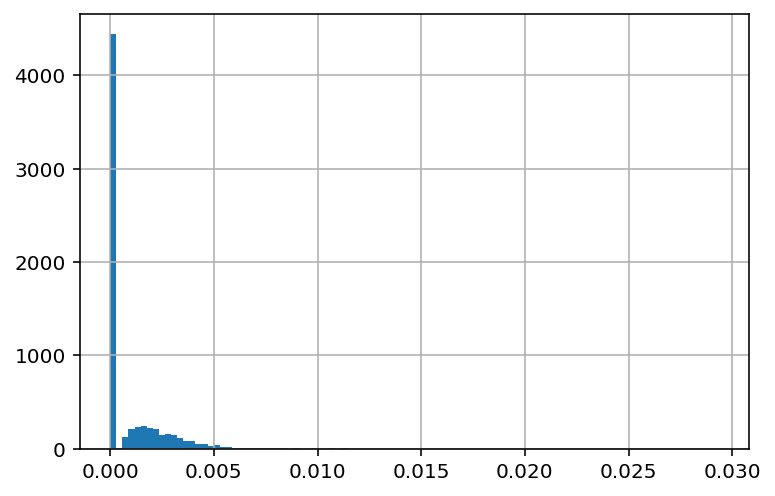

In [179]:
df_intersect.F.hist(bins=100)

In [182]:
df_intersect = df_intersect[df_intersect.F > 0].reset_index()

In [185]:
row = df_intersect.loc[0]
row[['1_sample_id', '2_sample_id', 'F']]

1_sample_id    TCGA-XH-A853
2_sample_id    TCGA-4V-A9QS
F                0.00232772
Name: 0, dtype: object

In [187]:
s1 = row['1_sample_id']
s2 = row['2_sample_id']
f = row['F']
print(s1,s2,f)

TCGA-XH-A853 TCGA-4V-A9QS 0.002327722525197744


In [254]:
list_f = []
list_s1 = []
list_s2 = []
for i in range(df_cdr3_pivot.shape[0]):
    for j in range(i):
#         print(i,j)
        s1 = df_cdr3_pivot.index[i]
        s2 = df_cdr3_pivot.index[j]
        d = df_cdr3_pivot.loc[[s1,s2]]
        d = d.loc[:,(d>0).sum() == 2]
        f = math.sqrt(d.loc[s1].sum() * d.loc[s2].sum())
        list_f.append(f)
        list_s1.append(i)
        list_s2.append(j)
        
mat_sim = csr_matrix((list_f, (list_s1, list_s2)), shape=(df_cdr3_pivot.shape[0], df_cdr3_pivot.shape[0])).toarray()
mat_sim += mat_sim.T
# mat_sim += np.eye(df_cdr3_pivot.shape[0])

In [ ]:
lut = dict(zip(df_feature.primary_pathology_history_myasthenia_gravis.unique(), "rbg"))
col_colors = df_feature.primary_pathology_history_myasthenia_gravis.map(lut)

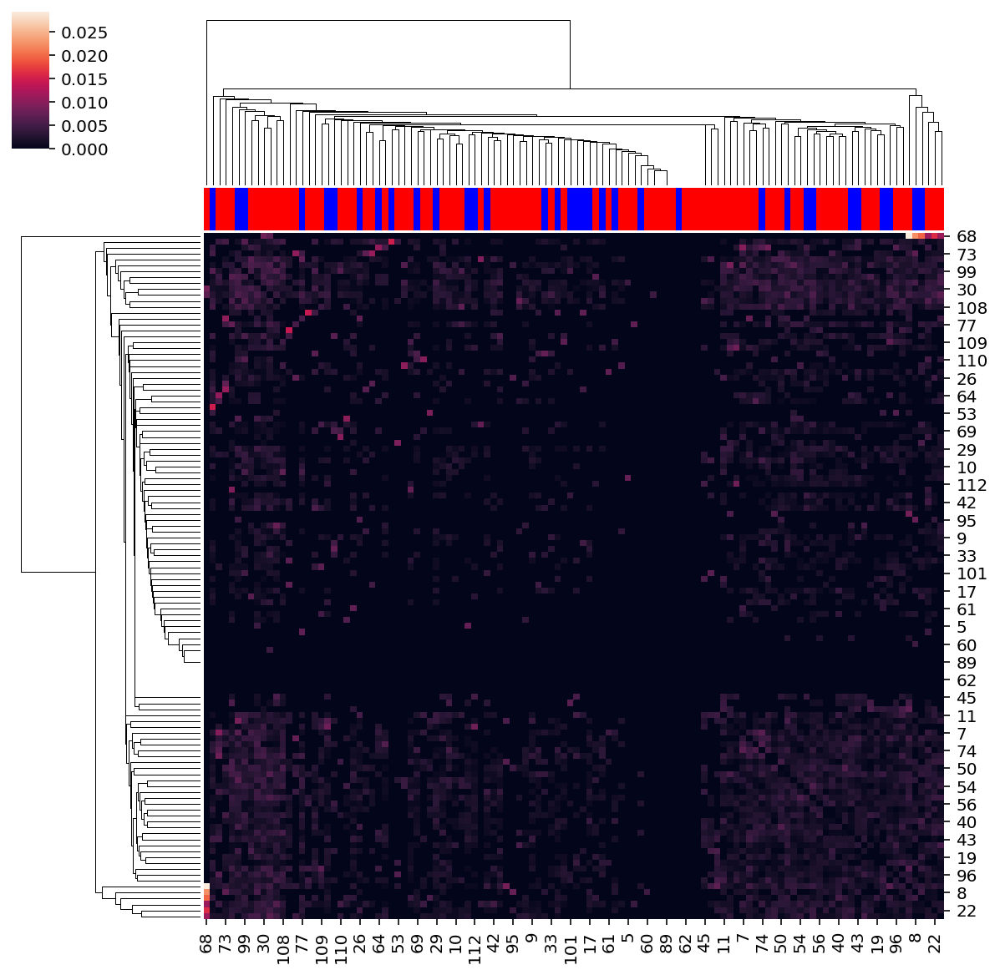

In [283]:
sns.clustermap(mat_sim, col_colors=list(col_colors))

## CDR3 test

In [309]:
import scipy.stats as stats

TRA
TRB
TRD
TRG
IGH
IGL
IGK


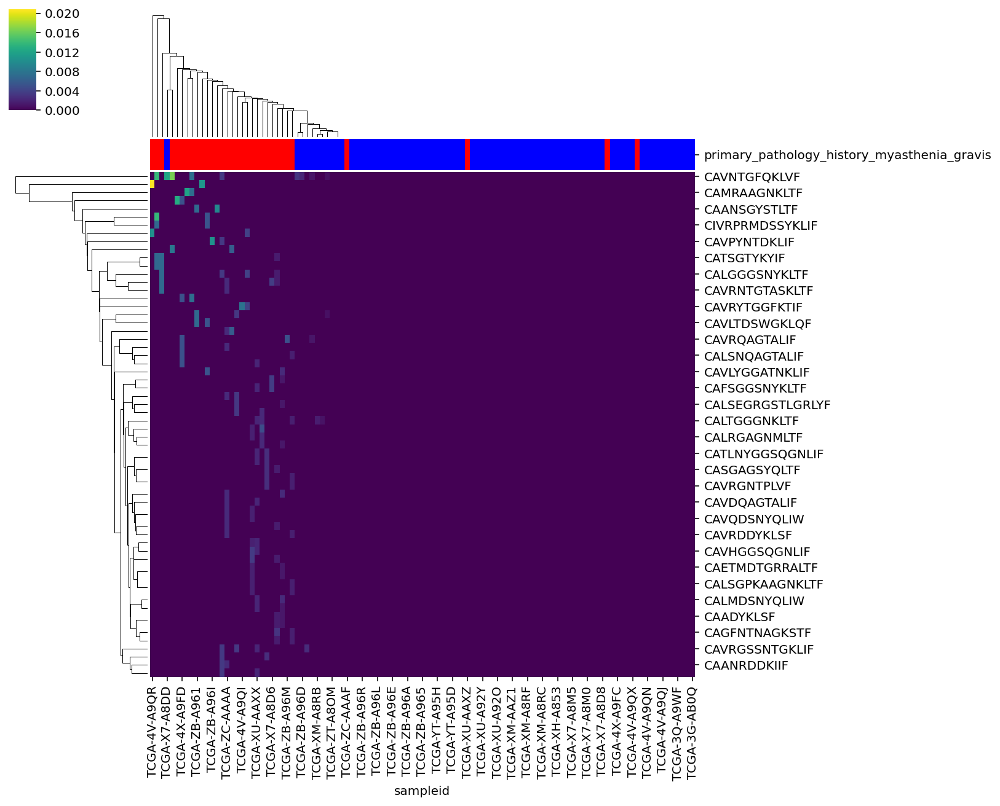

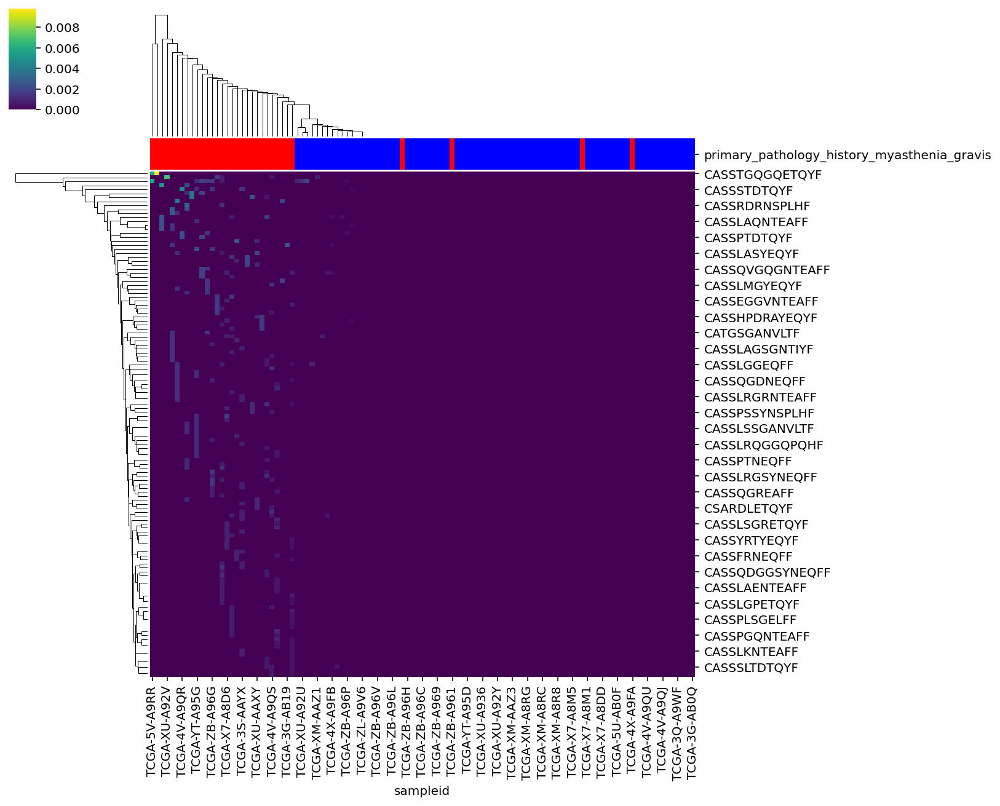

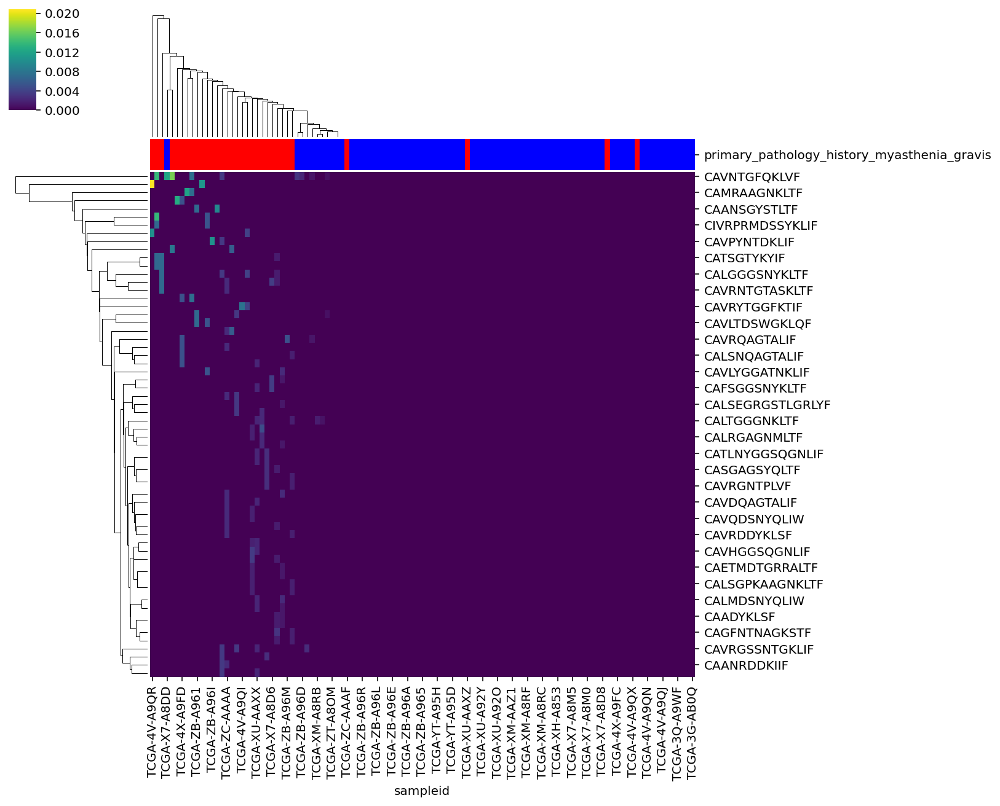

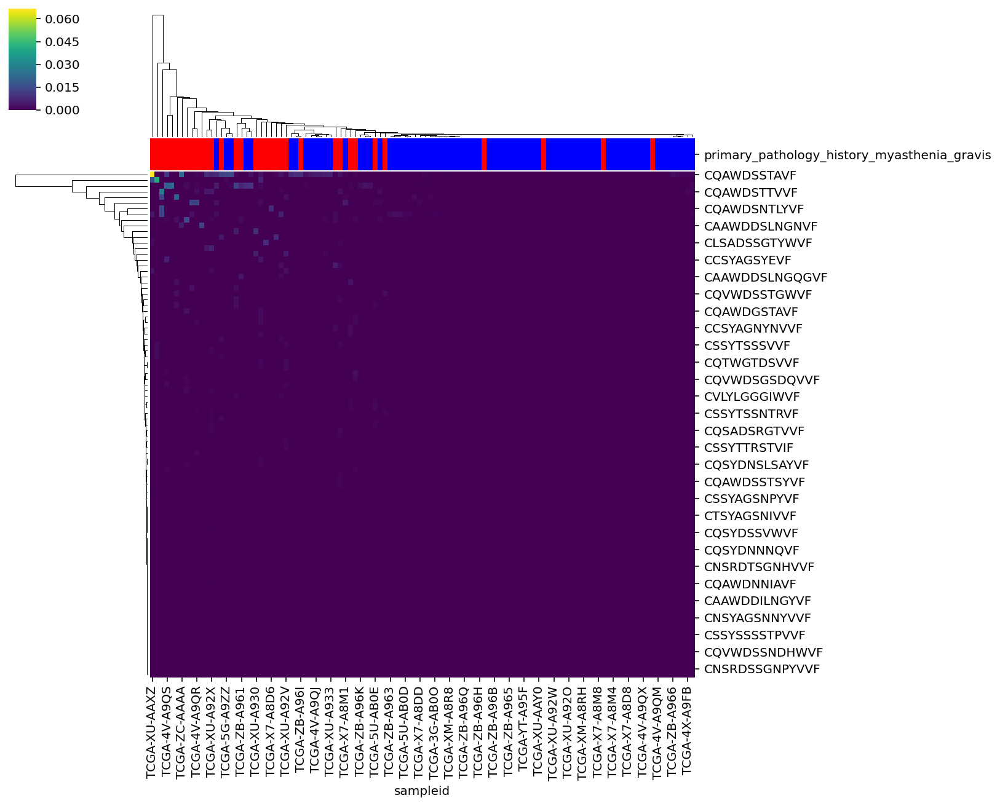

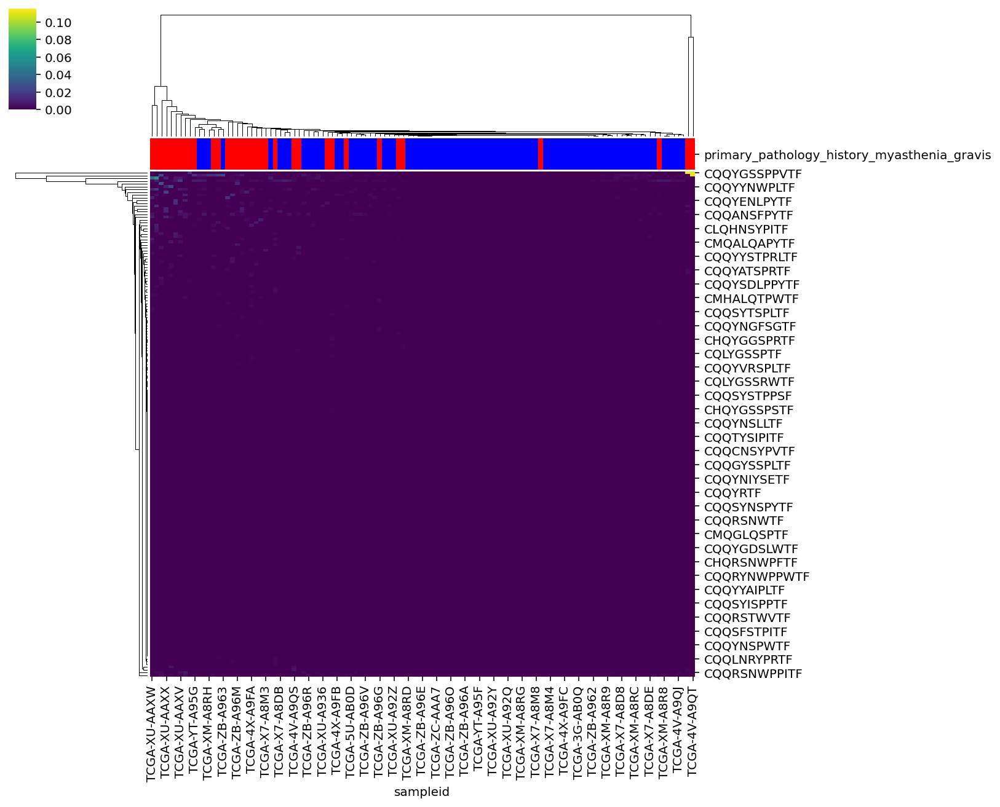

In [387]:
df_cli_div = df_cli.copy()

for chain in ['TRA', 'TRB', 'TRD', 'TRG', 'IGH', 'IGL', 'IGK']:
# for chain in ['TRB']:
    print(chain)
    os.makedirs('vdjfiles_{}'.format(chain), exist_ok=True)
    
    df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

    list_ent = []
    list_gini = []
    list_sim = []
    i = 0
    for pos,row in df_stats.iterrows():
        s = row['sample_id']
        mg = row['MG']
        d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
        d = d.groupby(by='cdr3aa').sum()[['freq']]
        d['sampleid'] = s
        
        if i == 0:
            df_cdr3 = d.copy()
            i = 1
        else:
            df_cdr3 = pd.concat([df_cdr3,d])
            
    df_cdr3.index.name = 'index'
    df_cdr3['cdr3aa'] = df_cdr3.index
    df_cdr3 = df_cdr3.reset_index(drop=True)
    
    df_cdr3_pivot = df_cdr3.pivot(index='sampleid', columns='cdr3aa').fillna(0)
    
    # used only overlaping cdr3s
    df_cdr3_pivot = df_cdr3_pivot.loc[:,(df_cdr3_pivot > 0).sum() >= 2].copy()
    df_cdr3_pivot = df_cdr3_pivot[df_cdr3_pivot.sum(axis=1) > 0]
    
    df_cdr3_pivot.columns = [x[1] for x in df_cdr3_pivot.columns]
    
    factor = 'primary_pathology_history_myasthenia_gravis'

    df_cli_filterd = df_cli.loc[df_cdr3_pivot.index]
    list_sample_factor = [list(df_cli_filterd[df_cli_filterd[factor] == x].index) for x in df_cli_filterd[factor].unique()]

    list_p = []
    for s in df_cdr3_pivot.columns:
        res = stats.f_oneway(df_cdr3_pivot.loc[list_sample_factor[0], s], df_cdr3_pivot.loc[list_sample_factor[1], s])
        list_p.append(res[1])

    df_p = pd.DataFrame(list_p)
    df_p.columns = ['pvalue_{}'.format(factor)]
    df_p.index = list(df_cdr3_pivot.columns)
    df_p.sort_values(by='pvalue_{}'.format(factor)).to_csv('vdjfiles_{c}/out/cdr3_anova.csv'.format(c=chain))
    print(df_p.head())
    
    lut = dict(zip(df_cli_filterd.primary_pathology_history_myasthenia_gravis.unique(), "br"))
    col_colors = df_cli_filterd.primary_pathology_history_myasthenia_gravis.map(lut)

    if df_p[df_p['pvalue_{}'.format(factor)] < 0.05].shape[0] > 2:
        sns.clustermap(df_cdr3_pivot[df_p[df_p['pvalue_{}'.format(factor)] < 0.05].index].T, col_colors=col_colors, cmap='viridis')
        plt.savefig('vdjfiles_{c}/out/clustermap_cdr3_p0.05.pdf'.format(c=chain), bbox_inches='tight')

In [379]:
factor = 'primary_pathology_history_myasthenia_gravis'

df_cli_filterd = df_cli.loc[df_cdr3_pivot.index]
list_sample_factor = [list(df_cli_filterd[df_cli_filterd[factor] == x].index) for x in df_cli_filterd[factor].unique()]

list_p = []
for s in df_cdr3_pivot.columns:
    res = stats.f_oneway(df_cdr3_pivot.loc[list_sample_factor[0], s], df_cdr3_pivot.loc[list_sample_factor[1], s])
    list_p.append(res[1])

df_p = pd.DataFrame(list_p)
df_p.columns = ['pvalue_{}'.format(factor)]
df_p.index = list(df_cdr3_pivot.columns)
# df_p = df_p.dropna()
# df_p = df_p.sort_values(by='pvalue')

# factor = 'gender'

# df_cli_filterd = df_cli.loc[df_cdr3_pivot.index]
# list_sample_factor = [list(df_cli_filterd[df_cli_filterd[factor] == x].index) for x in df_cli_filterd[factor].unique()]

# list_p = []
# for s in df_cdr3_pivot.columns:
#     res = stats.f_oneway(df_cdr3_pivot.loc[list_sample_factor[0], s], df_cdr3_pivot.loc[list_sample_factor[1], s])
#     list_p.append(res[1])
# df_p.columns = ['pvalue_{}'.format(factor)]

# factor = 'primary_pathology_histological_type_list'

# df_cli_filterd = df_cli.loc[df_cdr3_pivot.index]
# list_sample_factor = [list(df_cli_filterd[df_cli_filterd[factor] == x].index) for x in df_cli_filterd[factor].unique()]

# list_p = []
# for s in df_cdr3_pivot.columns:
#     res = stats.f_oneway(df_cdr3_pivot.loc[list_sample_factor[0], s], df_cdr3_pivot.loc[list_sample_factor[1], s])
#     list_p.append(res[1])
# df_p.columns = ['pvalue_{}'.format(factor)]

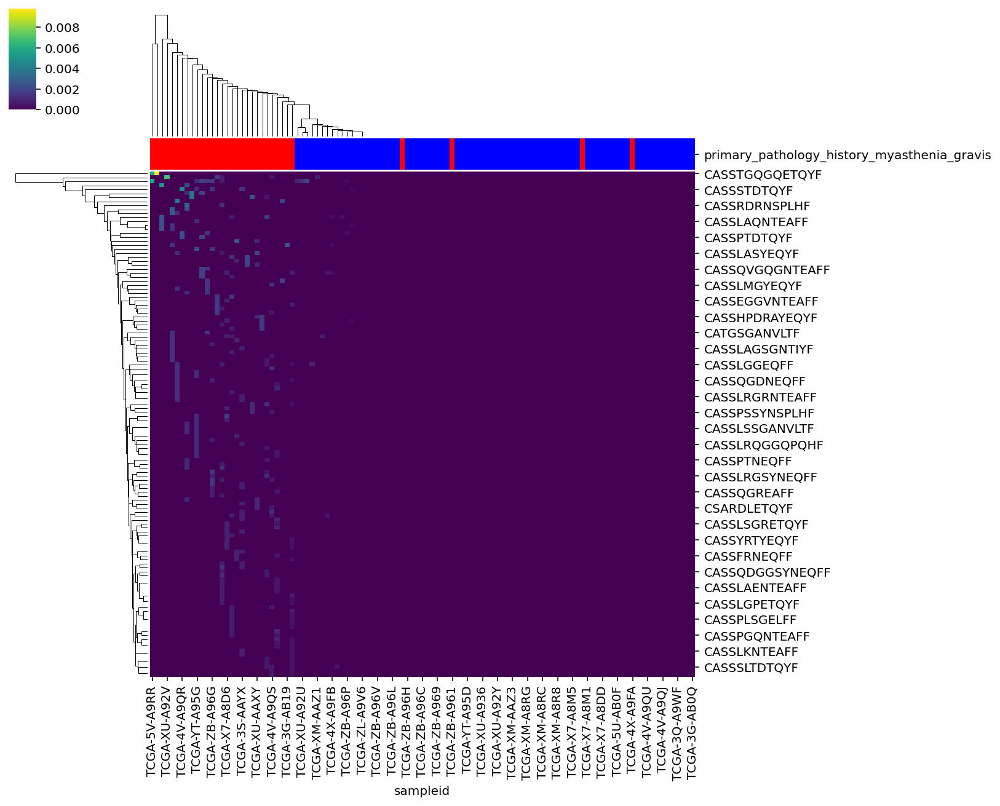

In [375]:
lut = dict(zip(df_cli_filterd.primary_pathology_history_myasthenia_gravis.unique(), "br"))
col_colors = df_cli_filterd.primary_pathology_history_myasthenia_gravis.map(lut)

sns.clustermap(df_cdr3_pivot[df_p[df_p['pvalue_{}'.format(factor)] < 0.05].index].T, col_colors=col_colors, cmap='viridis')
plt.savefig('{c}/out/clustermap_cdr3_p0.05.pdf'.format(c=chain))

In [376]:
2202 * 0.05

110.10000000000001

# Repatoire prediction

In [656]:
from scipy import stats

list_b = []
i = 0
for pos, row in df_cli.iterrows():
    bc = row['bcr_patient_barcode']
    try:
        d_rep = pd.read_csv('vdjfiles_TRB/db.{}.txt'.format(bc), sep='\t')
        list_b.append(bc)
        d_rep = d_rep.groupby(by='antigen.species').sum()
        d_rep['bcr_patient_barcode'] = bc
        if i == 0:
            df_rep = d_rep.copy()
            i = 1
        else:
            df_rep = pd.concat([df_rep, d_rep], axis=0)
    except:
        print(bc)
        
df_cli_exist = df_cli.loc[list_b]
df_rep = df_rep.dropna(axis=1)
df_rep['antigen'] = df_rep.index
df_rep = df_rep.reset_index(drop=True)

df_rep = pd.merge(df_rep, df_cli.reset_index(), how='left', on='bcr_patient_barcode')
# df_rep = pd.merge(df_rep, df_cli.reset_index(drop=True).dropna(axis=1), how='left', on='bcr_patient_barcode')

TCGA-4V-A9QQ
TCGA-X7-A8DC
TCGA-X7-A8DI
TCGA-XU-A92R


In [657]:
dict_hue_order = {list_factors[0] : ['YES', 'NO'],
    list_factors[1] : ['I', 'IIa', 'IIb', 'III', 'IVa', 'IVb', np.nan],
                 list_factors[2] : ['Thymoma; Type A', 'Thymoma; Type AThymoma; Type AB', 
                                    'Thymoma; Type AB', 'Thymoma; Type B1', 'Thymoma; Type B1Thymoma; Type B2', 'Thymoma; Type B2',
                                    'Thymoma; Type B2Thymoma; Type B3', 'Thymoma; Type B3', 'Thymoma; Type C'],
                 list_factors[3] : ['MALE', 'FEMALE']}

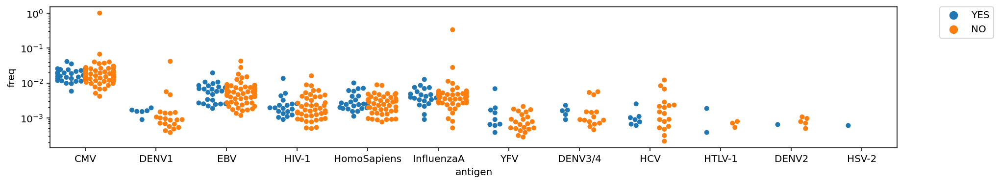

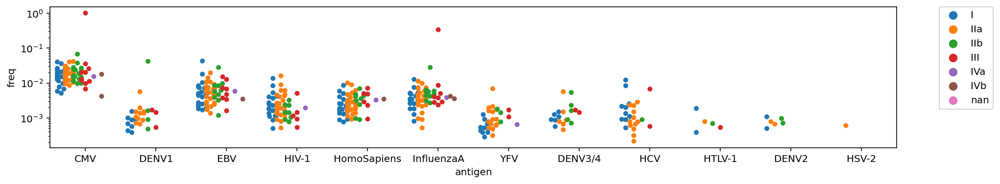

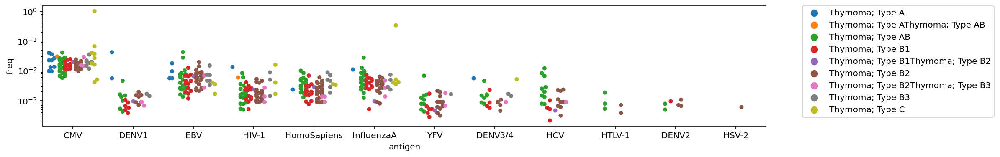

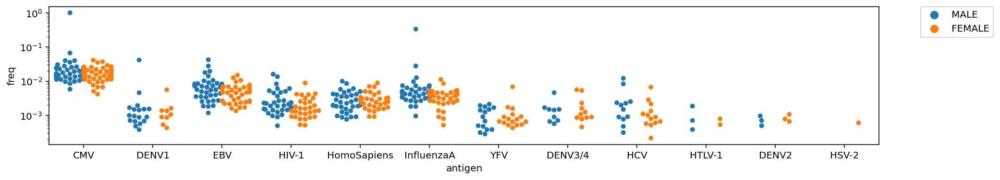

In [658]:
for f in list_factors:
    fig = plt.figure(figsize=(12,2))
    rect = 0,0,1,1
    log_ax = fig.add_axes(rect)
    log_ax.set_yscale("log")
    sns.swarmplot(data=df_rep, x='antigen', y='freq', 
                  hue=f, dodge=True, ax = log_ax, hue_order=dict_hue_order[f])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjfiles_TRB/out/epitope_{}.pdf'.format(f), bbox_inches='tight')

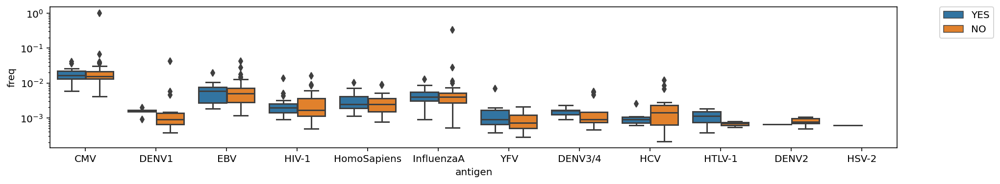

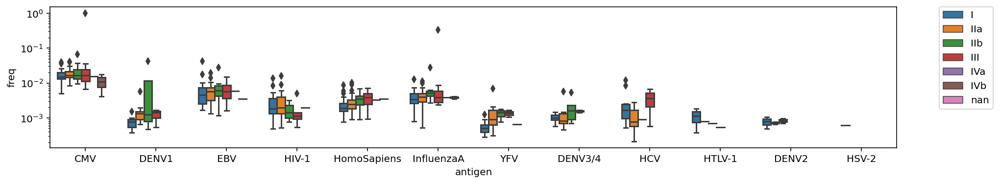

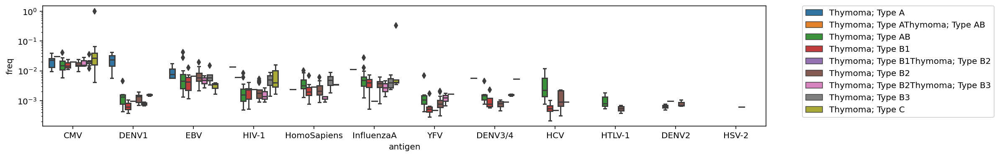

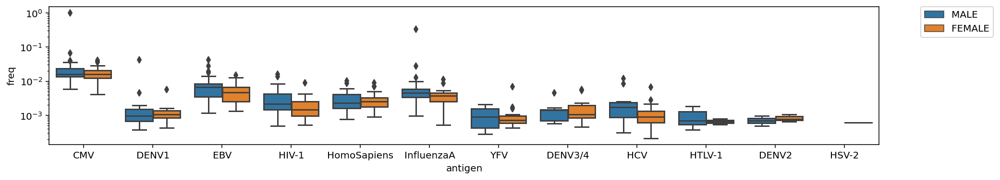

In [660]:
for f in list_factors:
    fig = plt.figure(figsize=(12,2))
    rect = 0,0,1,1
    log_ax = fig.add_axes(rect)
    log_ax.set_yscale("log")
    sns.boxplot(data=df_rep, x='antigen', y='freq', 
                  hue=f, dodge=True, ax = log_ax, hue_order=dict_hue_order[f])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjfiles_TRB/out/epitope_box_{}.pdf'.format(f), bbox_inches='tight')

In [661]:
res

MannwhitneyuResult(statistic=1200.0, pvalue=0.35059682716654417)

In [662]:
for a in df_rep.antigen.unique():
    print(a)
    res = stats.mannwhitneyu(df_rep.loc[(df_rep.antigen==a) & (df_rep.primary_pathology_history_myasthenia_gravis=='YES'), 'freq'],
                      df_rep.loc[(df_rep.antigen==a) & (df_rep.primary_pathology_history_myasthenia_gravis=='NO'), 'freq'])
    print(res)

CMV
MannwhitneyuResult(statistic=1118.0, pvalue=0.4503754179212675)
DENV1
MannwhitneyuResult(statistic=26.0, pvalue=0.01663858291346875)
EBV
MannwhitneyuResult(statistic=629.0, pvalue=0.2735728534083876)
HIV-1
MannwhitneyuResult(statistic=395.0, pvalue=0.31909901280127756)
HomoSapiens
MannwhitneyuResult(statistic=434.5, pvalue=0.17423000386364101)
InfluenzaA
MannwhitneyuResult(statistic=546.0, pvalue=0.4308071299123308)
YFV
MannwhitneyuResult(statistic=74.0, pvalue=0.1431608265393332)
DENV3/4
MannwhitneyuResult(statistic=23.0, pvalue=0.11084999688243818)
HCV
MannwhitneyuResult(statistic=51.0, pvalue=0.24321076302400757)
HTLV-1
MannwhitneyuResult(statistic=3.0, pvalue=0.38641499634222376)
DENV2
MannwhitneyuResult(statistic=1.0, pvalue=0.2790923247113286)
HSV-2
MannwhitneyuResult(statistic=0.0, pvalue=0.0)


/home/yyasumizu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:6415: RuntimeWarning: divide by zero encountered in double_scalars
  z = (bigu - meanrank) / sd


In [663]:
df_rep[df_rep.antigen == a]

,count,freq,VEnd,DStart,DEnd,JStart,id.in.sample,match.score,match.weight,v.end,j.start,vdjdb.score,bcr_patient_barcode,antigen,index,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,sampleid,age
328,1.0,0.000609,15.0,-1.0,-1.0,26.0,830.0,0.0,1.0,5.0,9.0,2.0,TCGA-XU-AAXV,HSV-2,TCGA-XU-AAXV,NaN,XU,AAXV,80606B1C-E8C8-4C3D-8475-3D846A84CA98,YES,C37.9,8584/3,C37,NO,YES,-16582.0,FEMALE,NaN,NaN,WHITE,HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,3709.0,NaN,YES,NO,NO,NO,23,7,2014,YES,NO,YES,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IIa,Thymus,Thymoma; Type B2,Median Sternectomy,NaN,0.0,45.0,2003,YES,NaN,TCGA-XU-AAXV,45


In [664]:
d_rep = pd.read_csv('vdjfiles_TRB/db.TCGA-3G-AB0O.txt', sep='\t')
d_rep.head()

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,id.in.sample,match.score,match.weight,gene,cdr3,species,antigen.epitope,antigen.gene,antigen.species,complex.id,v.segm,j.segm,v.end,j.start,mhc.a,mhc.b,mhc.class,reference.id,vdjdb.score
0,2,0.000765,TGCGCCAGCAGCTTCTCTAGCACAGATACGCAGTATTTT,CASSFSSTDTQYF,TRBV5-1,.,TRBJ2-3,13,-1,-1,16,151,0.0,1.0,TRB,CASSFSSTDTQYF,HomoSapiens,GILGFVFTL,M,InfluenzaA,0,TRBV19*01,TRBJ2-3*01,4,6,HLA-A*02,B2M,MHCI,PMID:28423320,0
1,2,0.000765,TGTGCCAGCAGTTCCGGGCCTTACAATGAGCAGTTCTTC,CASSSGPYNEQFF,TRBV6-5,TRBD1,TRBJ2-1,12,13,17,21,134,0.0,1.0,TRB,CASSSGPYNEQFF,HomoSapiens,NLVPMVATV,pp65,CMV,0,TRBV7-6*01,TRBJ2-1*01,4,7,HLA-A*02,B2M,MHCI,PMID:28423320,0
2,2,0.000765,TGTGCCAGCAGCCCGACAGGGTACTATGGCTACACCTTC,CASSPTGYYGYTF,TRBV13,TRBD1,TRBJ1-2,11,14,20,22,146,0.0,1.0,TRB,CASSPTGYYGYTF,HomoSapiens,KLGGALQAK,IE1,CMV,20147,TRBV12-4*01,TRBJ1-2*01,4,8,HLA-A*03:01,B2M,MHCI,https://www.10xgenomics.com/resources/applicat...,0
3,2,0.000765,TGTGCCAGCAGCGTAGGGACTAGCGGTGGCTACGAGCAGTACTTC,CASSVGTSGGYEQYF,TRBV9,TRBD2,TRBJ2-7,15,16,25,29,72,0.0,1.0,TRB,CASSVGTSGGYEQYF,HomoSapiens,KLGGALQAK,IE1,CMV,12553,TRBV9*01,TRBJ2-7*01,5,10,HLA-A*03:01,B2M,MHCI,https://www.10xgenomics.com/resources/applicat...,0
4,2,0.000765,TGCGCCAGCAGCCAAGATCGGGGGAGCTCCTACGAGCAGTACTTC,CASSQDRGSSYEQYF,TRBV4-1,.,TRBJ2-7,18,-1,-1,22,82,0.0,1.0,TRB,CASSQDRGSSYEQYF,HomoSapiens,RAKFKQLL,BZLF1,EBV,4210,TRBV4-2*01,TRBJ2-7*01,5,9,HLA-B*08:01,B2M,MHCI,https://www.10xgenomics.com/resources/applicat...,0


In [665]:
d_rep.columns

Index(['count', 'freq', 'cdr3nt', 'cdr3aa', 'v', 'd', 'j', 'VEnd', 'DStart',
       'DEnd', 'JStart', 'id.in.sample', 'match.score', 'match.weight', 'gene',
       'cdr3', 'species', 'antigen.epitope', 'antigen.gene', 'antigen.species',
       'complex.id', 'v.segm', 'j.segm', 'v.end', 'j.start', 'mhc.a', 'mhc.b',
       'mhc.class', 'reference.id', 'vdjdb.score'],
      dtype='object')

In [666]:
d_rep['antigen.species'].unique()

array(['InfluenzaA', 'CMV', 'EBV', 'HIV-1', 'YFV', 'HomoSapiens', 'DENV1'],
      dtype=object)

In [667]:
d_rep.groupby(by='antigen.species').sum()

,count,freq,VEnd,DStart,DEnd,JStart,id.in.sample,match.score,match.weight,v.end,j.start,vdjdb.score
antigen.species,,,,,,,,,,,,
CMV,38,0.014543,467,310,429,696,60676,0.0,35.0,155,244,0
DENV1,1,0.000383,10,11,16,19,2118,0.0,1.0,4,7,0
EBV,5,0.001914,57,13,17,63,6375,0.0,4.0,18,28,3
HIV-1,3,0.001148,36,44,59,62,5789,0.0,3.0,15,21,3
HomoSapiens,2,0.000765,23,10,17,39,4662,0.0,2.0,8,13,0
InfluenzaA,7,0.002679,81,46,61,123,8212,0.0,6.0,26,43,0
YFV,1,0.000383,13,-1,-1,19,1906,0.0,1.0,5,7,0


TCGA-4V-A9QQ
TCGA-X7-A8DC
TCGA-X7-A8DI
TCGA-XU-A92R


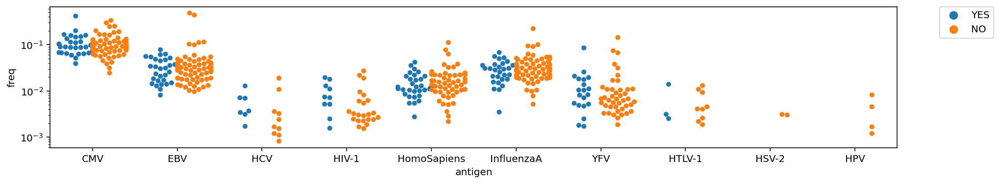

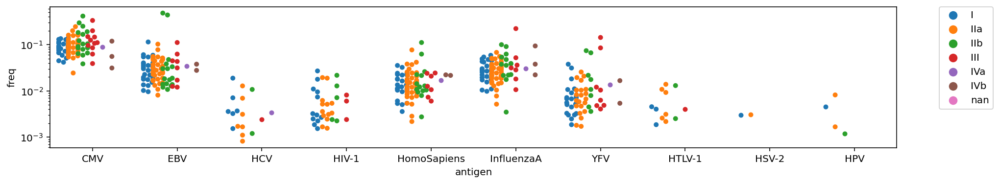

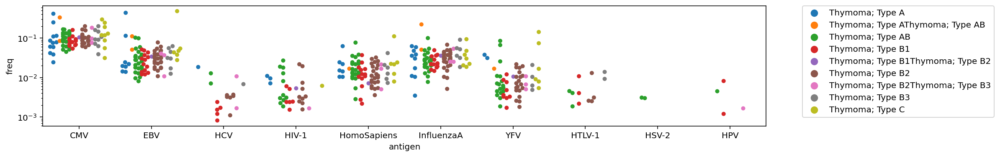

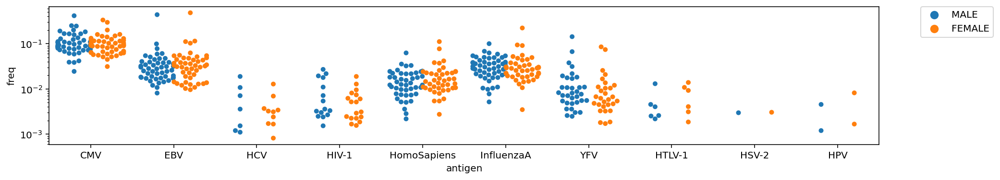

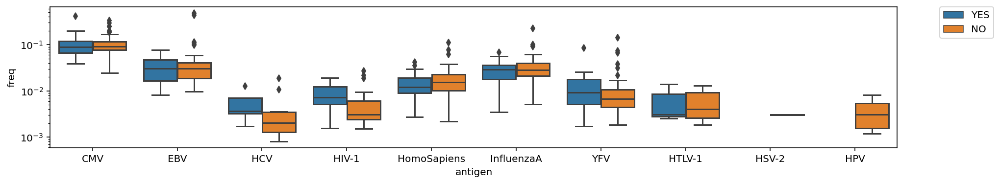

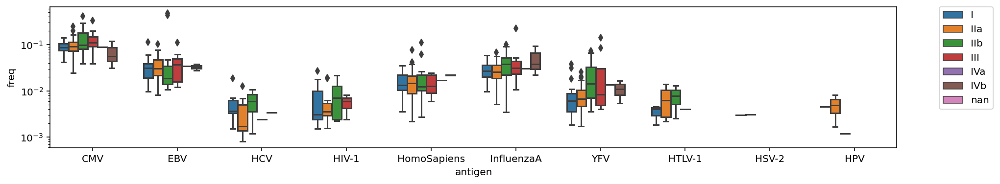

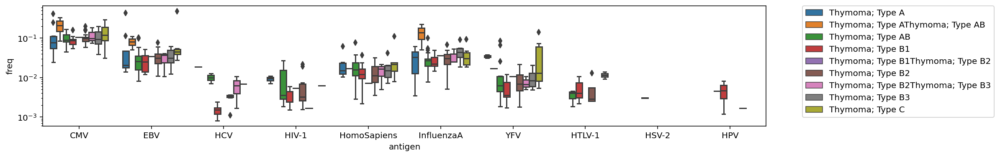

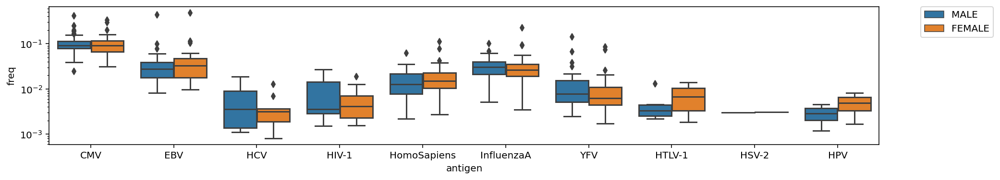

In [668]:
list_b = []
i = 0
for pos, row in df_cli.iterrows():
    bc = row['bcr_patient_barcode']
    try:
        d_rep = pd.read_csv('vdjfiles_TRA/db.{}.txt'.format(bc), sep='\t')
        list_b.append(bc)
        d_rep = d_rep.groupby(by='antigen.species').sum()
        d_rep['bcr_patient_barcode'] = bc
        if i == 0:
            df_rep = d_rep.copy()
            i = 1
        else:
            df_rep = pd.concat([df_rep, d_rep], axis=0)
    except:
        print(bc)
        
df_cli_exist = df_cli.loc[list_b]
df_rep = df_rep.dropna(axis=1)
df_rep['antigen'] = df_rep.index
df_rep = df_rep.reset_index(drop=True)
df_rep = pd.merge(df_rep, df_cli.reset_index(), how='left', on='bcr_patient_barcode')
# df_rep = pd.merge(df_rep, df_cli.reset_index(drop=True).dropna(axis=1), how='left', on='bcr_patient_barcode')

for f in list_factors:
    fig = plt.figure(figsize=(12,2))
    rect = 0,0,1,1
    log_ax = fig.add_axes(rect)
    log_ax.set_yscale("log")
    sns.swarmplot(data=df_rep, x='antigen', y='freq', 
                  hue=f, dodge=True, ax = log_ax, hue_order=dict_hue_order[f])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjfiles_TRA/out/epitope_{}.pdf'.format(f), bbox_inches='tight')
    
for f in list_factors:
    fig = plt.figure(figsize=(12,2))
    rect = 0,0,1,1
    log_ax = fig.add_axes(rect)
    log_ax.set_yscale("log")
    sns.boxplot(data=df_rep, x='antigen', y='freq', 
                  hue=f, dodge=True, ax = log_ax, hue_order=dict_hue_order[f])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjfiles_TRA/out/epitope_box_{}.pdf'.format(f), bbox_inches='tight')

In [669]:
for a in df_rep.antigen.unique():
    print(a)
    res = stats.mannwhitneyu(df_rep.loc[(df_rep.antigen==a) & (df_rep.primary_pathology_history_myasthenia_gravis=='YES'), 'freq'],
                      df_rep.loc[(df_rep.antigen==a) & (df_rep.primary_pathology_history_myasthenia_gravis=='NO'), 'freq'])
    print(res)

CMV
MannwhitneyuResult(statistic=1212.0, pvalue=0.49060632284062305)
EBV
MannwhitneyuResult(statistic=918.0, pvalue=0.3778476303056184)
HCV
MannwhitneyuResult(statistic=19.0, pvalue=0.06518491420540316)
HIV-1
MannwhitneyuResult(statistic=74.0, pvalue=0.05631205803918015)
HomoSapiens
MannwhitneyuResult(statistic=724.0, pvalue=0.10171509894098085)
InfluenzaA
MannwhitneyuResult(statistic=856.0, pvalue=0.2207086562011359)
YFV
MannwhitneyuResult(statistic=369.0, pvalue=0.18583732557207688)
HTLV-1
MannwhitneyuResult(statistic=13.0, pvalue=0.5)
HSV-2
MannwhitneyuResult(statistic=0.0, pvalue=0.0)
HPV
MannwhitneyuResult(statistic=0.0, pvalue=0.0)


/home/yyasumizu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:6415: RuntimeWarning: divide by zero encountered in double_scalars
  z = (bigu - meanrank) / sd


## BCR

In [703]:
from scipy import stats

In [411]:
list_class = ['IGHA1', 'IGHA2', 'IGHD', 'IGHE', 'IGHG1', 'IGHG2', 'IGHG3', 'IGHG4', 'IGHM']

In [485]:
i = 0
for pos, row in df_sample.iterrows():
    df_igh = pd.read_csv('mixcr/{}.clonotypes.IGH.txt'.format(row['file_id']), sep='\t')
    df_igh['class'] = df_igh['allCHitsWithScore'].str.split("*").str.get(0)
    d = df_igh[df_igh['class'].isin(list_class)].groupby(by='class').sum()['cloneFraction']
    d = pd.DataFrame(d)
    d.columns = [row['cases'][:12]]
#     print(pos)
    if i == 0:
        df_igh_sum = d
        i = 1
    else:
        df_igh_sum = pd.concat([df_igh_sum, d], axis=1)
        
df_igh_sum = df_igh_sum.loc[list_class,df_igh_sum.sum() > 0].fillna(0)
df_igh_sum = df_igh_sum.loc[:,df_igh_sum.columns.isin(df_cli.index)]

In [498]:
df_cli_filterd = df_cli.loc[list(df_igh_sum.columns),:]
df_cli_filterd = pd.concat([df_cli_filterd, df_igh_sum.T], axis=1)

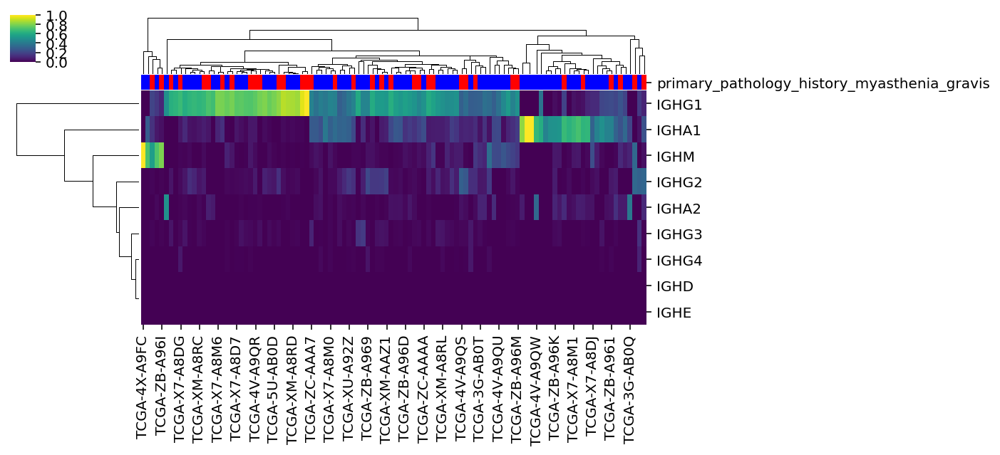

In [558]:
lut = dict(zip(df_cli_filterd.primary_pathology_history_myasthenia_gravis.unique(), "br"))
col_colors = df_cli_filterd.primary_pathology_history_myasthenia_gravis.map(lut)

sns.clustermap(df_igh_sum, col_colors=col_colors, cmap='viridis', figsize=(8,4))
plt.savefig('vdjplots/clustermap_IGclass.pdf'.format(c=chain))

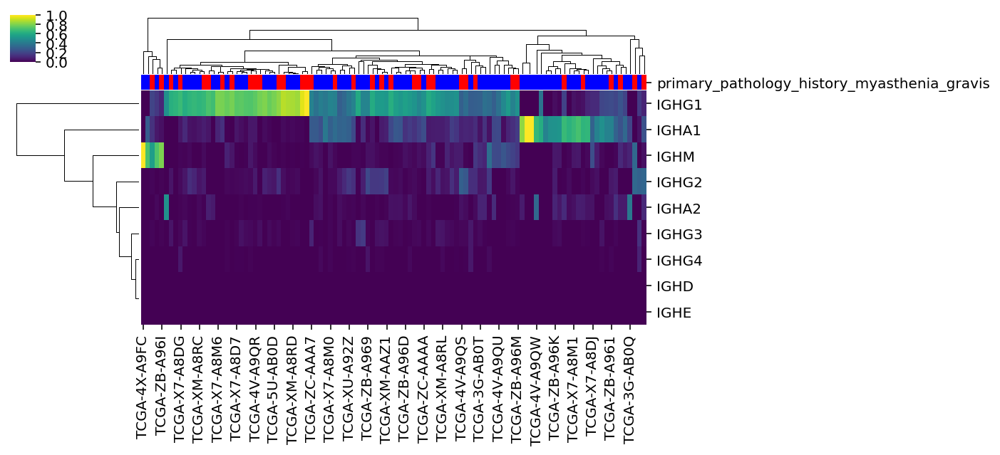

In [566]:
f = 'primary_pathology_history_myasthenia_gravis'
lut = dict(zip(df_cli_filterd[f].unique(), "br"))
col_colors = df_cli_filterd[f].map(lut)

sns.clustermap(df_igh_sum, col_colors=col_colors, cmap='viridis', figsize=(8,4))
plt.savefig('vdjplots/clustermap_IGclass.{}.pdf'.format(f))

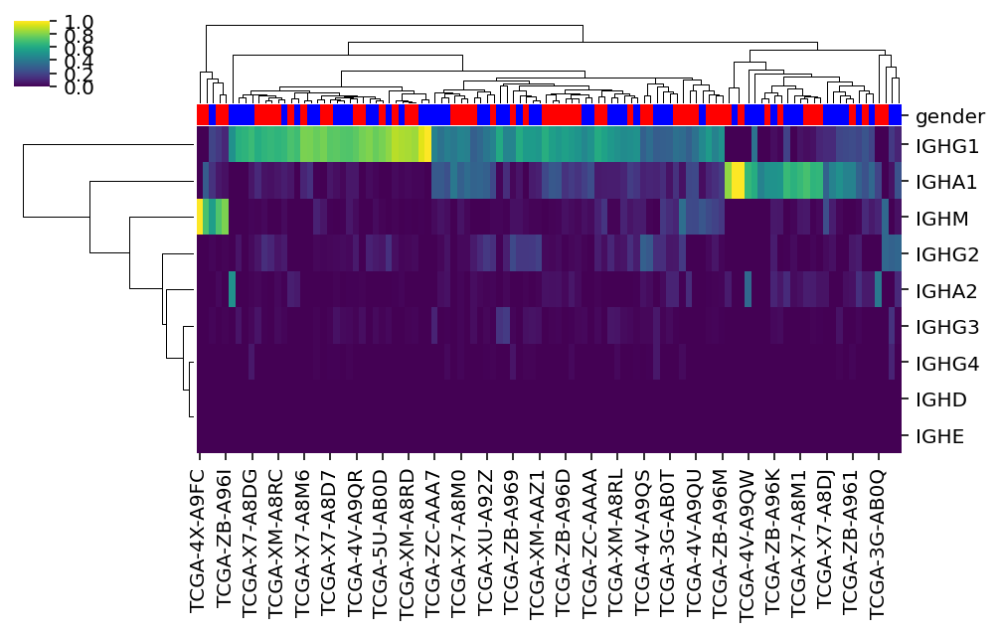

In [565]:
f = 'gender'
lut = dict(zip(df_cli_filterd[f].unique(), "br"))
col_colors = df_cli_filterd[f].map(lut)

sns.clustermap(df_igh_sum, col_colors=col_colors, cmap='viridis', figsize=(8,4))
plt.savefig('vdjplots/clustermap_IGclass.{}.pdf'.format(f))

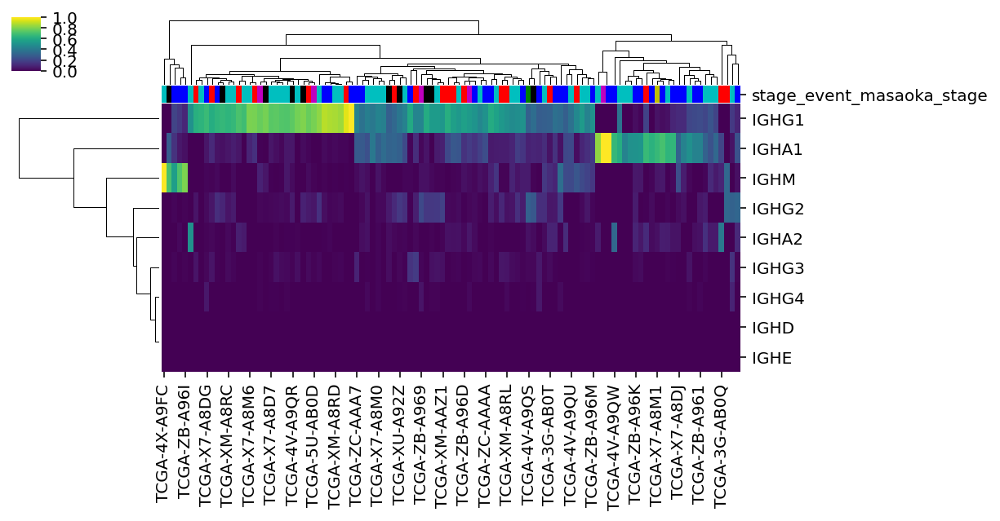

In [572]:
f = 'stage_event_masaoka_stage'
lut = dict(zip(df_cli_filterd[f].unique(), "brgcmyk"))
col_colors = df_cli_filterd[f].map(lut)

sns.clustermap(df_igh_sum, col_colors=col_colors, cmap='viridis', figsize=(8,4))
plt.savefig('vdjplots/clustermap_IGclass.{}.pdf'.format(f))

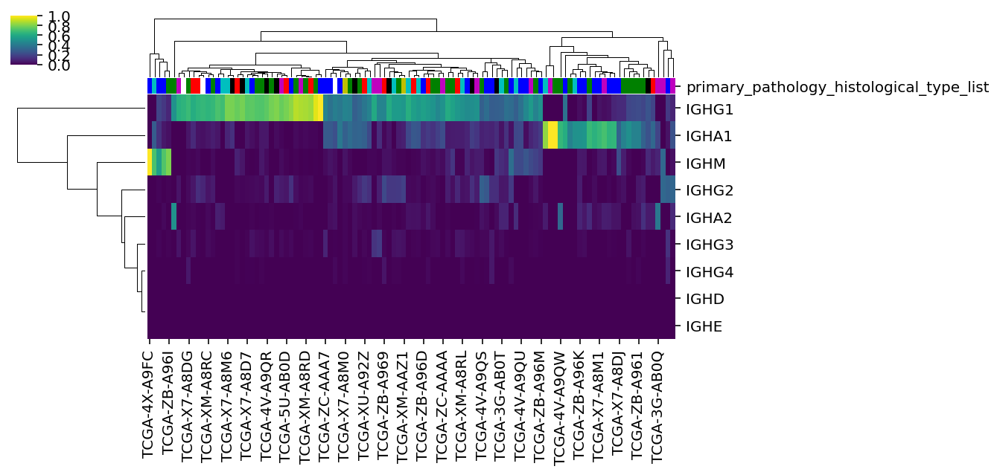

In [573]:
f = 'primary_pathology_histological_type_list'
lut = dict(zip(df_cli_filterd[f].unique(), "brgcmyk"))
col_colors = df_cli_filterd[f].map(lut)

sns.clustermap(df_igh_sum, col_colors=col_colors, cmap='viridis', figsize=(8,4))
plt.savefig('vdjplots/clustermap_IGclass.{}.pdf'.format(f))

In [682]:
df_igh_sum.T

,IGHA1,IGHA2,IGHD,IGHE,IGHG1,IGHG2,IGHG3,IGHG4,IGHM
TCGA-YT-A95H,0.638889,0.027778,0.000000,0.000000,0.000000,0.027778,0.000000,0.000000,0.013889
TCGA-XM-A8R8,0.049746,0.004958,0.000126,0.000036,0.652086,0.129765,0.004237,0.000433,0.022538
TCGA-ZB-A96D,0.142450,0.022792,0.000000,0.000000,0.564103,0.005698,0.000000,0.000000,0.042735
TCGA-X7-A8DG,0.057420,0.010440,0.000000,0.000000,0.679344,0.024609,0.019389,0.064877,0.012677
TCGA-4V-A9QS,0.091728,0.043207,0.000000,0.000000,0.302680,0.304298,0.018484,0.000000,0.071396
...,...,...,...,...,...,...,...,...,...
TCGA-ZC-AAAH,0.013158,0.013158,0.000000,0.000000,0.875000,0.013158,0.000000,0.000000,0.000000
TCGA-XM-A8RH,0.333333,0.066667,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.066667
TCGA-3G-AB0Q,0.200000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000
TCGA-3G-AB0O,0.321012,0.017510,0.000000,0.000000,0.334630,0.116732,0.003891,0.000000,0.003891


In [591]:
df_igh_tidy = df_igh_sum.T
df_igh_tidy['sampleid'] = df_igh_tidy.index
df_igh_tidy = df_igh_tidy.reset_index(drop=True)
df_igh_tidy = df_igh_tidy.melt(id_vars=['sampleid'], var_name='Igclass', value_name='frequency')
df_igh_tidy = pd.merge(df_igh_tidy, df_cli, on='sampleid')
df_igh_tidy 

,sampleid,Igclass,frequency,bcr_patient_barcode,additional_studies,tissue_source_site,patient_id,bcr_patient_uuid,informed_consent_verified,icd_o_3_site,icd_o_3_histology,icd_10,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,height,weight,race_list,ethnicity,other_dx,history_of_neoadjuvant_treatment,person_neoplasm_cancer_status,vital_status,days_to_last_followup,days_to_death,radiation_therapy,postoperative_rx_tx,post_op_ablation_embolization_tx,has_new_tumor_events_information,day_of_form_completion,month_of_form_completion,year_of_form_completion,has_follow_ups_information,has_drugs_information,has_radiations_information,project,stage_event_system_version,stage_event_clinical_stage,stage_event_pathologic_stage,stage_event_tnm_categories,stage_event_psa,stage_event_gleason_grading,stage_event_ann_arbor,stage_event_serum_markers,stage_event_igcccg_stage,stage_event_masaoka_stage,primary_pathology_tumor_tissue_site,primary_pathology_histological_type_list,primary_pathology_initial_pathologic_diagnosis_method,primary_pathology_init_pathology_dx_method_other,primary_pathology_days_to_initial_pathologic_diagnosis,primary_pathology_age_at_initial_pathologic_diagnosis,primary_pathology_year_of_initial_pathologic_diagnosis,primary_pathology_history_myasthenia_gravis,primary_pathology_section_myasthenia_gravis,age
0,TCGA-YT-A95H,IGHA1,0.638889,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
1,TCGA-YT-A95H,IGHA2,0.027778,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
2,TCGA-YT-A95H,IGHD,0.000000,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
3,TCGA-YT-A95H,IGHE,0.000000,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
4,TCGA-YT-A95H,IGHG1,0.000000,TCGA-YT-A95H,NaN,YT,A95H,4C0CF497-ABEA-4EA5-A207-E26F85F3BD18,YES,C38.1,8582/1,C38.1,NO,YES,-25376.0,MALE,166.0,72.0,WHITE,NaN,No,No,TUMOR FREE,Alive,389.0,NaN,NO,NO,NO,NO,25,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Anterior Mediastinum,Thymoma; Type AB,Median Sternectomy,NaN,0.0,69.0,2013,NO,NaN,69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
967,TCGA-3G-AB0O,IGHG1,0.334630,TCGA-3G-AB0O,NaN,3G,AB0O,3F19D238-1B55-4530-A9E2-8FDA644D45A6,YES,C37.9,8583/3,C37,NO,YES,-17528.0,MALE,172.0,99.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1723.0,NaN,NO,NO,NO,NO,20,6,2014,YES,NO,NO,TCGA-THYM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I,Thymus,Thymoma; Type B1,Core needle biopsy,NaN,0.0,47.0,2009,NO,NaN,48
968,TCGA-3G-AB0O,IGHG2,0.116732,TCGA-3G-AB0O,NaN,3G,AB0O,3F19D238-1B55-4530-A9E2-8FDA644D45A6,YES,C37.9,8583/3,C37,NO,YES,-17528.0,MALE,172.0,99.0,WHITE,NOT HISPANIC OR LATINO,No,No,TUMOR FREE,Alive,1723.0,NaN,NO,NO,NO,NO,20,6,2014,YES,NO,NO,TCGA-TH

In [ ]:
dict_hue_order = {list_factors[0] : ['YES', 'NO'],
    list_factors[1] : ['I', 'IIa', 'IIb', 'III', 'IVa', 'IVb', np.nan],
                 list_factors[2] : ['Thymoma; Type A', 'Thymoma; Type AThymoma; Type AB', 
                                    'Thymoma; Type AB', 'Thymoma; Type B1', 'Thymoma; Type B1Thymoma; Type B2', 'Thymoma; Type B2',
                                    'Thymoma; Type B2Thymoma; Type B3', 'Thymoma; Type B3', 'Thymoma; Type C'],
                 list_factors[3] : ['MALE', 'FEMALE']}

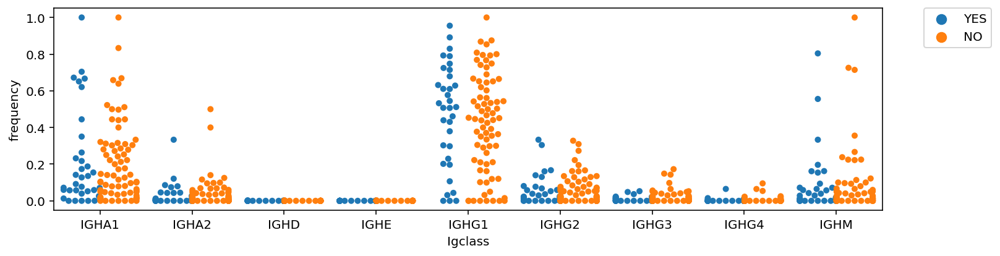

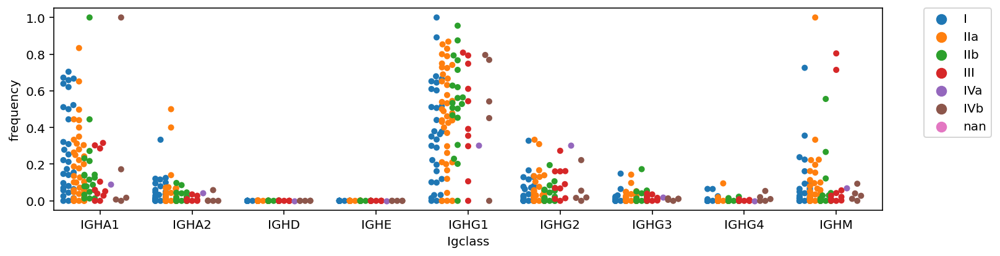

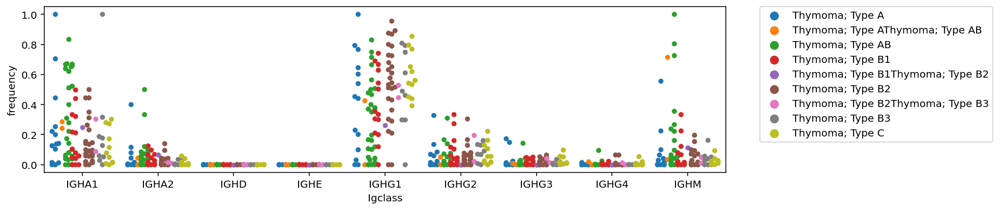

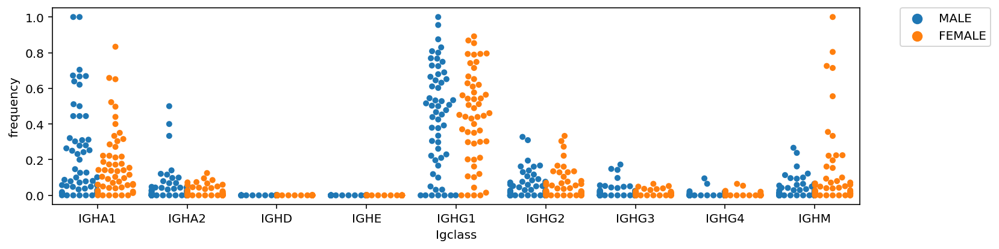

In [625]:
# f = 'primary_pathology_history_myasthenia_gravis'

for f in list_factors:
    plt.figure(figsize=(12,3))
    sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True, hue_order=dict_hue_order[f])
    # sns.boxplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjplots/swarmplot_IGclass.{}.pdf'.format(f), bbox_inches='tight')

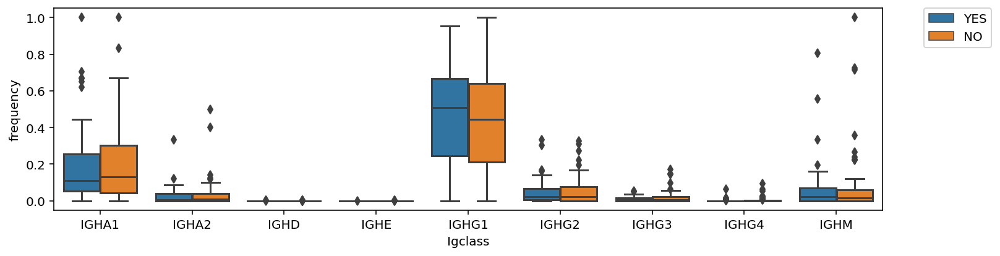

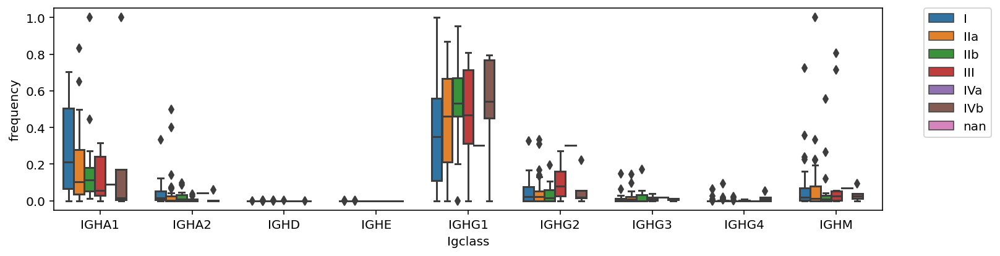

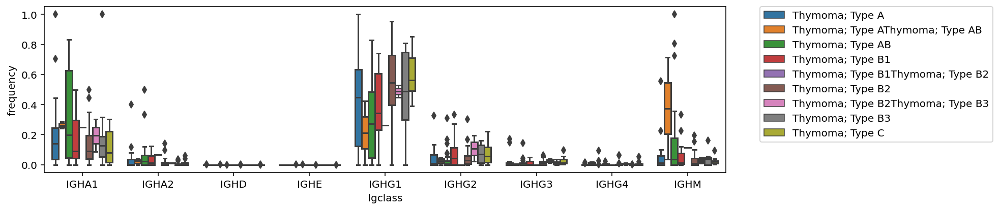

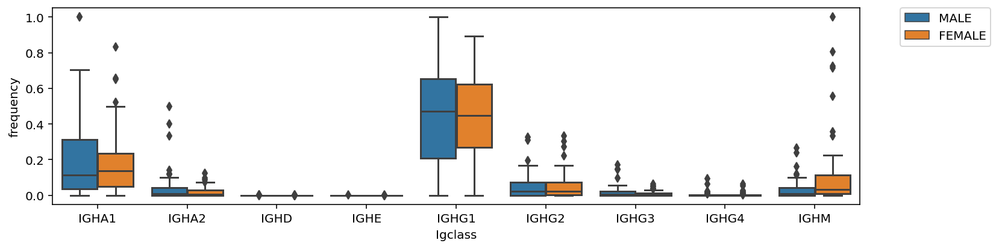

In [624]:
# f = 'primary_pathology_history_myasthenia_gravis'

for f in list_factors:
    plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
    sns.boxplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True, hue_order=dict_hue_order[f])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('vdjplots/boxplot_IGclass.{}.pdf'.format(f), bbox_inches='tight')

In [602]:
res = stats.mannwhitneyu(df_igh_tidy.loc[(df_igh_tidy.Igclass == ig) & (df_igh_tidy.primary_pathology_history_myasthenia_gravis=='YES'), 'frequency'],
                          df_igh_tidy.loc[(df_igh_tidy.Igclass == ig) & (df_igh_tidy.primary_pathology_history_myasthenia_gravis=='NO'), 'frequency'])

In [605]:
for ig in list_class:
    print(ig)
    res = stats.mannwhitneyu(df_igh_tidy.loc[(df_igh_tidy.Igclass == ig) & 
                                         (df_igh_tidy.primary_pathology_history_myasthenia_gravis=='YES'), 'frequency'],
                          df_igh_tidy.loc[(df_igh_tidy.Igclass == ig) & 
                                          (df_igh_tidy.primary_pathology_history_myasthenia_gravis=='NO'), 'frequency'])
    print(res)

IGHA1
MannwhitneyuResult(statistic=1225.5, pvalue=0.4161361328010809)
IGHA2
MannwhitneyuResult(statistic=1192.0, pvalue=0.32915319171714497)
IGHD
MannwhitneyuResult(statistic=1223.5, pvalue=0.34009112692908827)
IGHE
MannwhitneyuResult(statistic=1226.0, pvalue=0.28356220853497377)
IGHG1
MannwhitneyuResult(statistic=1128.0, pvalue=0.19570135014624607)
IGHG2
MannwhitneyuResult(statistic=1205.0, pvalue=0.3626220884855348)
IGHG3
MannwhitneyuResult(statistic=1172.0, pvalue=0.2795080993043769)
IGHG4
MannwhitneyuResult(statistic=1088.0, pvalue=0.08459769330793415)
IGHM
MannwhitneyuResult(statistic=1200.0, pvalue=0.35059682716654417)


In [688]:
f = list_factors[2]

In [692]:
dict_hue_order[f]

['Thymoma; Type A',
 'Thymoma; Type AThymoma; Type AB',
 'Thymoma; Type AB',
 'Thymoma; Type B1',
 'Thymoma; Type B1Thymoma; Type B2',
 'Thymoma; Type B2',
 'Thymoma; Type B2Thymoma; Type B3',
 'Thymoma; Type B3',
 'Thymoma; Type C']

In [711]:
list_p = []
list_b = []
for f in list_factors:
    l_p = []
    l_b = []
    for ig in list_class:
        dict_order_f = {k : i for i,k in enumerate(dict_hue_order[f])}
        d = df_igh_tidy[df_igh_tidy.Igclass == ig]
        slope, intercept, r_value, p_value, std_err = stats.linregress([dict_order_f[x] for x in d[f]], d['frequency'])
        l_p.append(p_value)
        l_b.append(slope)
    list_p.append(l_p)
    list_b.append(l_b)

In [713]:
df_p = pd.DataFrame(list_p)
df_p.columns = list_class
df_p.index = list_factors
df_p.to_csv('vdjplots/IGclass_p.csv')
df_p

,IGHA1,IGHA2,IGHD,IGHE,IGHG1,IGHG2,IGHG3,IGHG4,IGHM
primary_pathology_history_myasthenia_gravis,0.766727,0.669705,0.491904,0.373349,0.423476,0.904529,0.159004,0.480254,0.721953
stage_event_masaoka_stage,0.504913,0.165433,0.303344,0.428452,0.279729,0.184033,0.895219,0.660917,0.874298
primary_pathology_histological_type_list,0.034111,0.021219,0.684984,0.671808,0.000759,0.195819,0.927403,0.532769,0.017797
gender,0.244272,0.076976,0.880917,0.508559,0.917410,0.705835,0.087037,0.892635,0.002814


In [714]:
df_b = pd.DataFrame(list_b)
df_b.columns = list_class
df_b.index = list_factors
df_b.to_csv('vdjplots/IGclass_beta.csv')
df_b

,IGHA1,IGHA2,IGHD,IGHE,IGHG1,IGHG2,IGHG3,IGHG4,IGHM
primary_pathology_history_myasthenia_gravis,-0.014154,0.006480,-0.000061,0.000051,-0.045279,-0.001917,0.008555,0.002067,-0.012598
stage_event_masaoka_stage,-0.011072,-0.007310,0.000032,-0.000016,0.021273,0.007363,-0.000280,0.000448,0.001951
primary_pathology_histological_type_list,-0.018916,-0.006539,-0.000007,-0.000005,0.035123,0.003893,0.000105,0.000345,-0.015658
gender,-0.051484,-0.024800,0.000012,0.000036,0.005461,0.005605,-0.009640,-0.000368,0.096289


In [716]:
f = 'age'
for ig in list_class:
    d = df_igh_tidy[df_igh_tidy.Igclass == ig]
    slope, intercept, r_value, p_value, std_err = stats.linregress(d[f], d['frequency'])
    print(ig, p_value)

IGHA1 0.8311419653284373
IGHA2 0.7636538211607552
IGHD 0.043989336268470125
IGHE 0.5274432572460825
IGHG1 0.19349670883943643
IGHG2 0.09945423370797885
IGHG3 0.13977043653164925
IGHG4 0.4424449718687451
IGHM 0.17002485588365268


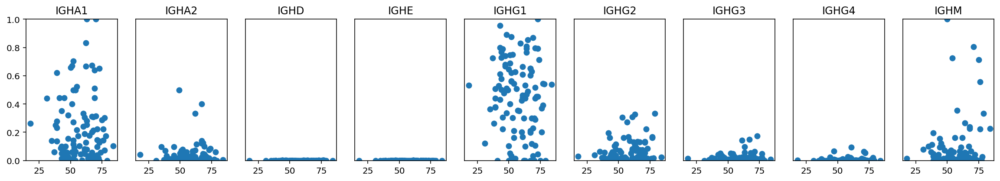

In [734]:
plt.figure(figsize=(20,3))
for i,ig in enumerate(list_class):
    d = df_igh_tidy[df_igh_tidy.Igclass == ig]
    plt.subplot(1,len(list_class), i+1)
    plt.scatter(d[f], d['frequency'])
    plt.title(ig)
    plt.ylim(0,1)
    if i > 0:
        plt.yticks([])
plt.savefig('vdjplots/IGclass_age.pdf', bbox_inches='tight')

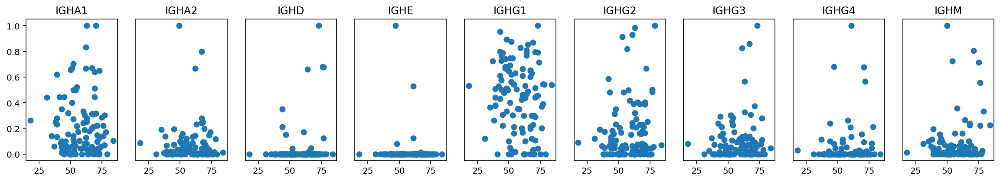

In [735]:
plt.figure(figsize=(20,3))
for i,ig in enumerate(list_class):
    d = df_igh_tidy[df_igh_tidy.Igclass == ig]
    plt.subplot(1,len(list_class), i+1)
    plt.scatter(d[f], d['frequency'])
    plt.title(ig)
#     plt.ylim(0,1)
    if i > 0:
        plt.yticks([])
plt.savefig('vdjplots/IGclass_age.pdf', bbox_inches='tight')

## VDJ

In [191]:
from scipy import stats
import statsmodels.stats.multitest as multi

In [192]:
list_factors = ['primary_pathology_history_myasthenia_gravis', 'stage_event_masaoka_stage',
                'primary_pathology_histological_type_list', 'gender']

dict_hue_order = {list_factors[0] : ['YES', 'NO'],
    list_factors[1] : ['I', 'IIa', 'IIb', 'III', 'IVa', 'IVb', np.nan],
                 list_factors[2] : ['Thymoma; Type A', 'Thymoma; Type AThymoma; Type AB', 
                                    'Thymoma; Type AB', 'Thymoma; Type B1', 'Thymoma; Type B1Thymoma; Type B2', 'Thymoma; Type B2',
                                    'Thymoma; Type B2Thymoma; Type B3', 'Thymoma; Type B3', 'Thymoma; Type C'],
                 list_factors[3] : ['MALE', 'FEMALE']}

In [193]:
def gini(array):
    """Calculate the Gini coefficient of a numpy array."""
    # based on bottom eq: http://www.statsdirect.com/help/content/image/stat0206_wmf.gif
    # from: http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    array = array.flatten() #all values are treated equally, arrays must be 1d
    if np.amin(array) < 0:
        array -= np.amin(array) #values cannot be negative
    array += 0.0000001 #values cannot be 0
    array = np.sort(array) #values must be sorted
    index = np.arange(1,array.shape[0]+1) #index per array element
    n = array.shape[0]#number of array elements
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array))) #Gini coefficient

In [194]:
chain = 'TRA'
df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

i = 0
for pos,row in df_stats.iterrows():
    s = row['sample_id']
    mg = row['MG']
    d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
    d['sample_id'] = s
    d['MG'] = mg

    if i == 0:
        df_vdj = d.copy()
        i = 1
    else:
        df_vdj = pd.concat([df_vdj, d], axis=0)

In [195]:
df_v = df_vdj.groupby(['sample_id', 'v']).count()['count'].unstack().fillna(0)
df_v = df_v.T.div(df_v.sum(axis=1), axis=1)

# df_d = df_vdj.groupby(['sample_id', 'd']).count()['count'].unstack().fillna(0)
# df_d = df_d.T.div(df_d.sum(axis=1), axis=1)

df_j = df_vdj.groupby(['sample_id', 'j']).count()['count'].unstack().fillna(0)
df_j = df_j.T.div(df_j.sum(axis=1), axis=1)

In [196]:
df_j.index

Index(['IGHJ2P', 'IGHJ4', 'IGHJ5', 'IGKJ2', 'TRAJ10', 'TRAJ11', 'TRAJ12',
       'TRAJ13', 'TRAJ15', 'TRAJ16', 'TRAJ17', 'TRAJ18', 'TRAJ20', 'TRAJ21',
       'TRAJ22', 'TRAJ23', 'TRAJ24', 'TRAJ25', 'TRAJ26', 'TRAJ27', 'TRAJ28',
       'TRAJ29', 'TRAJ3', 'TRAJ30', 'TRAJ31', 'TRAJ32', 'TRAJ33', 'TRAJ34',
       'TRAJ35', 'TRAJ36', 'TRAJ37', 'TRAJ38', 'TRAJ39', 'TRAJ4', 'TRAJ40',
       'TRAJ41', 'TRAJ42', 'TRAJ43', 'TRAJ44', 'TRAJ45', 'TRAJ46', 'TRAJ47',
       'TRAJ48', 'TRAJ49', 'TRAJ5', 'TRAJ50', 'TRAJ52', 'TRAJ53', 'TRAJ54',
       'TRAJ56', 'TRAJ57', 'TRAJ58', 'TRAJ59', 'TRAJ6', 'TRAJ60', 'TRAJ61',
       'TRAJ7', 'TRAJ8', 'TRAJ9', 'TRDJ1', 'TRDJ2', 'TRDJ3', 'TRDJ4'],
      dtype='object', name='j')

In [197]:
list_av = ['TRAV1-1', 'TRAV1-2', 'TRAV2', 'TRAV3', 'TRAV4', 'TRAV5', 'TRAV6', 'TRAV7', 
        'TRAV8-1', 'TRAV8-2', 'TRAV8-3', 'TRAV8-4', 'TRAV8-5', 'TRAV8-6', 'TRAV8-7', 
        'TRAV9-1', 'TRAV9-2', 'TRAV10', 'TRAV11', 'TRAV12-1', 'TRAV12-2',
        'TRAV12-3', 'TRAV13-1', 'TRAV13-2', 'TRAV14DV4', 'TRAV15', 'TRAV16',
       'TRAV17', 'TRAV19', 'TRAV20', 'TRAV21', 'TRAV22', 'TRAV23DV6',
       'TRAV24', 'TRAV25', 'TRAV26-1', 'TRAV26-2', 'TRAV27', 'TRAV28',
       'TRAV29DV5', 'TRAV30', 'TRAV32', 'TRAV34', 'TRAV35',
       'TRAV36DV7', 'TRAV38-1', 'TRAV38-2DV8', 'TRAV39', 'TRAV40','TRAV41']

list_aj = ['TRAJ3', 'TRAJ4', 'TRAJ5', 'TRAJ6', 'TRAJ7', 'TRAJ8',
           'TRAJ9', 'TRAJ10', 'TRAJ11', 'TRAJ12',
       'TRAJ13', 'TRAJ15', 'TRAJ16', 'TRAJ17', 'TRAJ18', 'TRAJ20', 'TRAJ21',
       'TRAJ22', 'TRAJ23', 'TRAJ24', 'TRAJ25', 'TRAJ26', 'TRAJ27', 'TRAJ28',
       'TRAJ29', 'TRAJ30', 'TRAJ31', 'TRAJ32', 'TRAJ33', 'TRAJ34',
       'TRAJ35', 'TRAJ36', 'TRAJ37', 'TRAJ38', 'TRAJ39', 'TRAJ40',
       'TRAJ41', 'TRAJ42', 'TRAJ43', 'TRAJ44', 'TRAJ45', 'TRAJ46', 'TRAJ47',
       'TRAJ48', 'TRAJ49', 'TRAJ50', 'TRAJ52', 'TRAJ53', 'TRAJ54',
       'TRAJ56', 'TRAJ57', 'TRAJ58', 'TRAJ59', 'TRAJ60', 'TRAJ61']

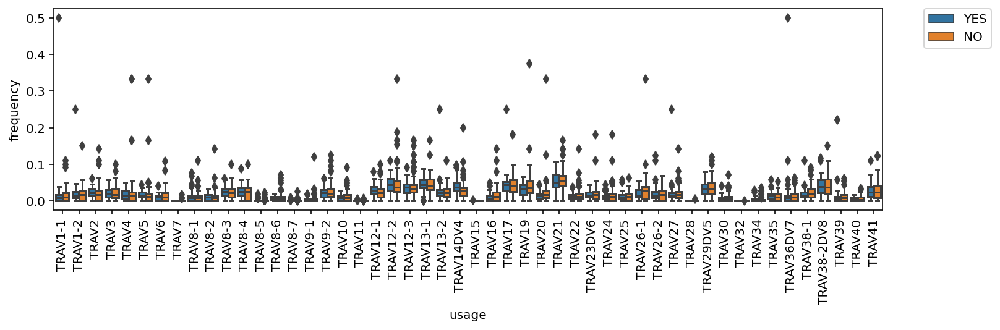

In [198]:
df_v_tidy = df_v.T
df_v_tidy['sampleid'] = df_v_tidy.index
df_v_tidy = df_v_tidy.reset_index(drop=True)
df_v_tidy = df_v_tidy.melt(id_vars=['sampleid'], var_name='usage', value_name='frequency')
df_v_tidy = pd.merge(df_v_tidy, df_cli, on='sampleid')
# df_v_tidy

f = 'primary_pathology_history_myasthenia_gravis'
plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
sns.boxplot(data=df_v_tidy, x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], order=list_av)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)
plt.savefig('vdjplots/vdj.TRAV.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')

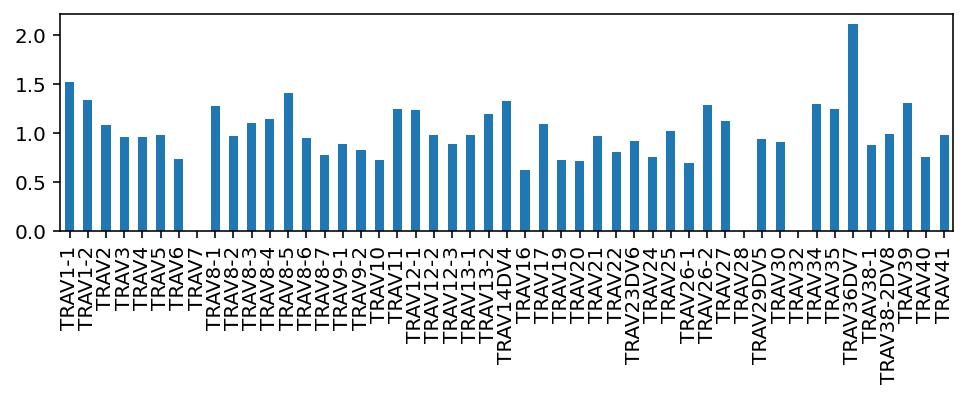

In [199]:
list_ratio = []
for u in list_av:
    if df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'].mean() > 0:
        r = df_v_tidy.loc[(df_v_tidy[f] =='YES') & (df_v_tidy.usage == u), 'frequency'].mean() / \
                     df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'].mean()
    else:
        r = np.nan
    list_ratio.append(r)
ser_ratio = pd.Series(list_ratio)
ser_ratio.index = list_av
ser_ratio = ser_ratio.dropna()

plt.figure(figsize=(8,2))
ser_ratio.plot.bar()

In [200]:
list_gini = []
for pos,row in df_v.T.iterrows():
    list_gini.append(gini(np.array(row)))

df_gini_av = pd.DataFrame(list_gini)
df_gini_av.columns = ["TRAV"]
df_gini_av.index = df_v.columns

In [201]:
list_p_av = []
for u in list_av:
    print(u)
    res = stats.mannwhitneyu(df_v_tidy.loc[(df_v_tidy[f] =='YES') & (df_v_tidy.usage == u), 'frequency'],
                     df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'])
#     print(res)
    list_p_av.append(res[1])
res_bh = multi.multipletests(list_p_av, method="fdr_bh", alpha=0.1)
print(np.array(list_av)[res_bh[0]])

TRAV1-1
TRAV1-2
TRAV2
TRAV3
TRAV4
TRAV5
TRAV6
TRAV7
TRAV8-1
TRAV8-2
TRAV8-3
TRAV8-4
TRAV8-5
TRAV8-6
TRAV8-7
TRAV9-1
TRAV9-2
TRAV10
TRAV11
TRAV12-1
TRAV12-2
TRAV12-3
TRAV13-1
TRAV13-2
TRAV14DV4
TRAV15
TRAV16
TRAV17
TRAV19
TRAV20
TRAV21
TRAV22
TRAV23DV6
TRAV24
TRAV25
TRAV26-1
TRAV26-2
TRAV27
TRAV28
TRAV29DV5
TRAV30
TRAV32
TRAV34
TRAV35
TRAV36DV7
TRAV38-1
TRAV38-2DV8
TRAV39
TRAV40
TRAV41
[]


In [202]:
np.array(list_av)[res_bh[0]]

array([], dtype='<U11')

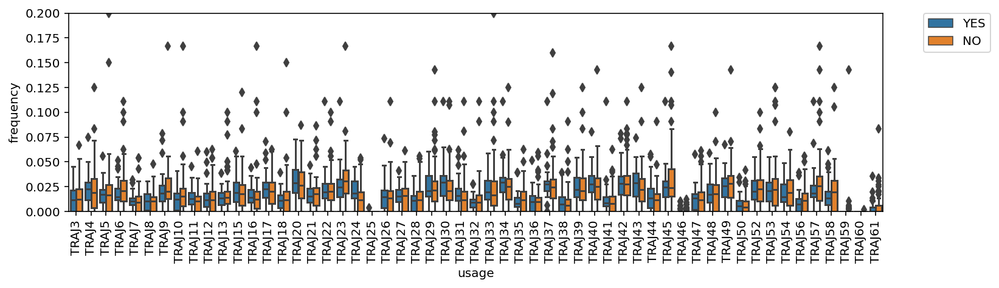

In [203]:
df_j_tidy = df_j.T
df_j_tidy['sampleid'] = df_j_tidy.index
df_j_tidy = df_j_tidy.reset_index(drop=True)
df_j_tidy = df_j_tidy.melt(id_vars=['sampleid'], var_name='usage', value_name='frequency')
df_j_tidy = pd.merge(df_j_tidy, df_cli, on='sampleid')

f = 'primary_pathology_history_myasthenia_gravis'
plt.figure(figsize=(12,3))
sns.boxplot(data=df_j_tidy, x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], order=list_aj)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(0,0.2)
plt.savefig('vdjplots/vdj.TRAJ.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')

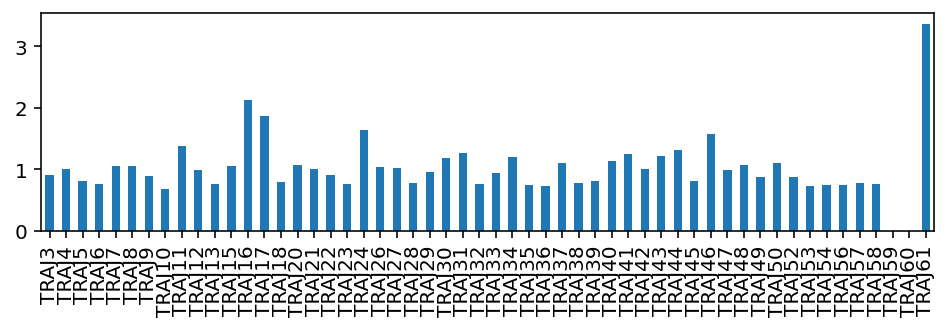

In [204]:
list_ratio = []
for u in list_aj:
    if df_j_tidy.loc[(df_j_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'].mean() > 0:
        r = df_j_tidy.loc[(df_j_tidy[f] =='YES') & (df_j_tidy.usage == u), 'frequency'].mean() / \
                     df_j_tidy.loc[(df_j_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'].mean()
    else:
        r = np.nan
    list_ratio.append(r)
ser_ratio = pd.Series(list_ratio)
ser_ratio.index = list_aj
ser_ratio = ser_ratio.dropna()

plt.figure(figsize=(8,2))
ser_ratio.plot.bar()

In [205]:
list_gini = []
for pos,row in df_j.T.iterrows():
    list_gini.append(gini(np.array(row)))

df_gini_aj = pd.DataFrame(list_gini)
df_gini_aj.columns = ["TRAJ"]
df_gini_aj.index = df_j.columns

In [206]:
list_p_aj = []
for u in list_aj:
    print(u)
    res = stats.mannwhitneyu(df_j_tidy.loc[(df_j_tidy[f] =='YES') & (df_j_tidy.usage == u), 'frequency'],
                     df_j_tidy.loc[(df_j_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'])
#     print(res)
    list_p_aj.append(res[1])
res_bh = multi.multipletests(list_p_aj, method="fdr_bh", alpha=0.1)
print(np.array(list_aj)[res_bh[0]])

TRAJ3
TRAJ4
TRAJ5
TRAJ6
TRAJ7
TRAJ8
TRAJ9
TRAJ10
TRAJ11
TRAJ12
TRAJ13
TRAJ15
TRAJ16
TRAJ17
TRAJ18
TRAJ20
TRAJ21
TRAJ22
TRAJ23
TRAJ24
TRAJ25
TRAJ26
TRAJ27
TRAJ28
TRAJ29
TRAJ30
TRAJ31
TRAJ32
TRAJ33
TRAJ34
TRAJ35
TRAJ36
TRAJ37
TRAJ38
TRAJ39
TRAJ40
TRAJ41
TRAJ42
TRAJ43
TRAJ44
TRAJ45
TRAJ46
TRAJ47
TRAJ48
TRAJ49
TRAJ50
TRAJ52
TRAJ53
TRAJ54
TRAJ56
TRAJ57
TRAJ58
TRAJ59
TRAJ60
TRAJ61
['TRAJ24']


In [207]:
list_p_aj

[0.38480310993596345,
 0.2663716453219962,
 0.4392138197359122,
 0.0760649265479934,
 0.23658514053861218,
 0.30248206479141604,
 0.2535400558200005,
 0.13826204189011387,
 0.030133669565919077,
 0.4816652797604487,
 0.2934786718695759,
 0.33386028753341596,
 0.129069638097367,
 0.1697655046344454,
 0.49144140596854907,
 0.246866747439907,
 0.4048591869593333,
 0.4276494076223179,
 0.0719481454664725,
 0.0009616816577186441,
 0.06250905898267181,
 0.3926118901530541,
 0.4342712042907279,
 0.20223220250029417,
 0.2613979626674422,
 0.0721377167894753,
 0.020970515638552137,
 0.3773964691146682,
 0.13375100043938531,
 0.0606234981592829,
 0.13251548519301626,
 0.41444877228568144,
 0.09118759530008114,
 0.19888719714552588,
 0.4769664564499449,
 0.13214686674560394,
 0.2017141978751159,
 0.4300586344517854,
 0.04071847138617768,
 0.11657766182293894,
 0.3155917149100307,
 0.28924086193540954,
 0.4028350958138781,
 0.32439735487111665,
 0.20552929169802509,
 0.32521826265673504,
 0.364194

In [208]:
res_bh

(array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False]),
 array([0.46863994, 0.45782627, 0.46863994, 0.38022062, 0.45782627,
        0.46863994, 0.45782627, 0.38022062, 0.38022062, 0.49058501,
        0.46863994, 0.46863994, 0.38022062, 0.44462394, 0.49144141,
        0.45782627, 0.46863994, 0.46863994, 0.38022062, 0.05289249,
        0.38022062, 0.46863994, 0.46863994, 0.45216444, 0.45782627,
        0.38022062, 0.38022062, 0.46863994, 0.38022062, 0.38022062,
        0.38022062, 0.46863994, 0.38022062, 0.45216444, 0.49058501,
        0.38022062, 0.45216444, 0.46863994, 0.38022062, 0.38022062,
        0.468

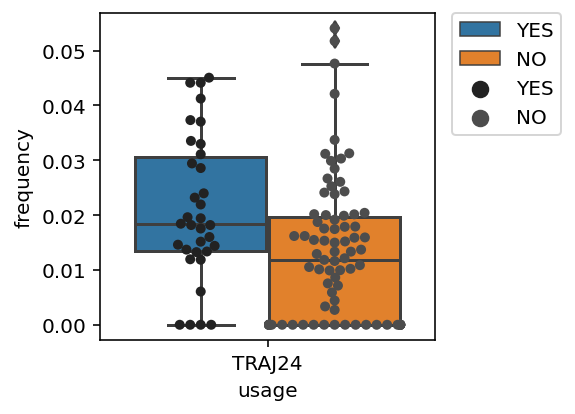

In [209]:
u = 'TRAJ24'

plt.figure(figsize=(3,3))
sns.swarmplot(data=df_j_tidy[df_j_tidy.usage == u], x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], size=5, color=".3", linewidth=0)

sns.boxplot(data=df_j_tidy[df_j_tidy.usage == u], x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f])
# plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.ylim(0,0.2)
plt.savefig('vdjplots/TRAJ24.box.pdf', bbox_inches='tight')

In [210]:
s_y = df_j_tidy.loc[(df_j_tidy.usage == u) & (df_j_tidy[f] == 'YES'), 'frequency']
s_n = df_j_tidy.loc[(df_j_tidy.usage == u) & (df_j_tidy[f] == 'NO'), 'frequency']

In [211]:
(s_y > 0.01).sum() / s_y.shape[0]

0.8529411764705882

In [212]:
(s_n > 0.01).sum() / s_n.shape[0]

0.5609756097560976

In [213]:
df_vdj[df_vdj['j'] == u].sort_values(by='freq', ascending=False)

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
0,6,0.076923,TGTGCAGAGAATAAGGCAACTGACAGCTGGGGGAAATTCCAGTTT,CAENKATDSWGKFQF,TRAV13-2,.,TRAJ24,12,-1,-1,16,TCGA-XU-A92V,YES
0,25,0.041806,TGTGTGGTGAACGGGGAAGGAACAACTGACAGCTGGGGGAAATTGC...,CVVNGEGTTDSWGKLQF,TRAV12-1,.,TRAJ24,11,-1,-1,21,TCGA-X7-A8M0,NO
1,1,0.030303,TGTGCAATGAACCTTATGACAACTGACAGCTGGGGGAAATTGCAGTTT,CAMNLMTTDSWGKLQF,TRAV14DV4,.,TRAJ24,9,-1,-1,15,TCGA-XU-A92Y,NO
20,1,0.025641,TGTGCTGCCGAAACTGACAGCTGGGGGAAATTGCAGTTT,CAAETDSWGKLQF,TRAV1-2,.,TRAJ24,6,-1,-1,11,TCGA-XU-AAY0,NO
12,1,0.025641,TGTGCTTGCGGGAATGGGAGCTGGGGGAAATTGCAGTTT,CACGNGSWGKLQF,TRAV38-1,.,TRAJ24,6,-1,-1,18,TCGA-XU-AAY0,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,1,0.000818,TGTGCTGTGCAGGCTATAACTGACAGCTGGGGGAAATTGCAGTTT,CAVQAITDSWGKLQF,TRAV20,.,TRAJ24,13,-1,-1,17,TCGA-X7-A8D7,NO
179,1,0.000818,TGTGCAGCAAGTAATTGTGGCTCTGACAGCTGGGGGAAATTGCAGTTT,CAASNCGSDSWGKLQF,TRAV13-1,.,TRAJ24,12,-1,-1,22,TCGA-X7-A8D7,NO
102,1,0.000818,TGTGCTCTTGGGGAACTAGCGACAACTGACAGCTGGGGGAAATTGC...,CALGELATTDSWGKLQF,TRDV1,.,TRAJ24,18,-1,-1,20,TCGA-X7-A8D7,NO
81,1,0.000818,TGTGCTGTGTGCGACCAGTTCCTCATGACAACTGACAGCTGGGGGA...,CAVCDQFLMTTDSWGKLQF,TRAV22,.,TRAJ24,8,-1,-1,22,TCGA-X7-A8D7,NO


In [214]:
df_vdj['freq'].sum()

116.0

In [215]:
df_TRAJ24 = df_vdj[df_vdj['j'] == u].groupby(by=['v', 'MG', 'sample_id']
                                            ).sum()['freq'].unstack(level=0).fillna(0)[
    [x for x in list_av if x in df_TRAJ24.columns]]

In [216]:
df_TRAJ24

v                 TRAV1-1  TRAV1-2     TRAV2  TRAV3  TRAV4  TRAV5     TRAV6  \
MG  sample_id                                                                 
NO  TCGA-3G-AB0O      0.0      0.0  0.001531    0.0    0.0    0.0  0.000000   
    TCGA-3G-AB0T      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
    TCGA-3Q-A9WF      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
    TCGA-3T-AA9L      0.0      0.0  0.005405    0.0    0.0    0.0  0.000000   
    TCGA-4V-A9QJ      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
...                   ...      ...       ...    ...    ...    ...       ...   
YES TCGA-ZB-A96G      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
    TCGA-ZB-A96I      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
    TCGA-ZB-A96M      0.0      0.0  0.005181    0.0    0.0    0.0  0.005181   
    TCGA-ZC-AAAA      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   
    TCGA-ZC-AAAF      0.0      0.0  0.000000    0.0    0.0    0.0  0.000000   

v                 TRAV8-1  TRAV8-2   TRAV8-3   TRAV8-4  TRAV9-1   TRAV9-2  \
MG  sample_id                                                               
NO  TCGA-3G-AB0O      0.0      0.0  0.000000  0.000000      0.0  0.000000   
    TCGA-3G-AB0T      0.0      0.0  0.000000  0.000000      0.0  0.009434   
    TCGA-3Q-A9WF      0.0      0.0  0.000000  0.000000      0.0  0.000000   
    TCGA-3T-AA9L      0.0      0.0  0.000000  0.000000      0.0  0.000000   
    TCGA-4V-A9QJ      0.0      0.0  0.000000  0.000000      0.0  0.000000   
...                   ...      ...       ...       ...      ...       ...   
YES TCGA-ZB-A96G      0.0      0.0  0.004049  0.000000      0.0  0.000000   
    TCGA-ZB-A96I      0.0      0.0  0.000000  0.010638      0.0  0.000000   
    TCGA-ZB-A96M      0.0      0.0  0.000000  0.000000      0.0  0.000000   
    TCGA-ZC-AAAA      0.0      0.0  0.002519  0.000000      0.0  0.000000   
    TCGA-ZC-AAAF      0.0      0.0  0.000000  0.000000      0.0  0.000000   

v                 TRAV10  TRAV12-1  TRAV12-2  TRAV12-3  TRAV13-1  TRAV13-2  \
MG  sample_id                                                                
NO  TCGA-3G-AB0O     0.0  0.001531  0.000000  0.001531  0.000000       0.0   
    TCGA-3G-AB0T     0.0  0.000000  0.000000  0.000000  0.000000       0.0   
    TCGA-3Q-A9WF     0.0  0.000000  0.000000  0.000000  0.000000       0.0   
    TCGA-3T-AA9L     0.0  0.000000  0.005405  0.000000  0.000000       0.0   
    TCGA-4V-A9QJ     0.0  0.000000  0.006289  0.006289  0.000000       0.0   
...                  ...       ...       ...       ...       ...       ...   
YES TCGA-ZB-A96G     0.0  0.004049  0.004049  0.000000  0.000000       0.0   
    TCGA-ZB-A96I     0.0  0.000000  0.010638  0.000000  0.010638       0.0   
    TCGA-ZB-A96M     0.0  0.000000  0.000000  0.000000  0.000000       0.0   
    TCGA-ZC-AAAA     0.0  0.002519  0.005038  0.000000  0.002519       0.0   
    TCGA-ZC-AAAF     0.0  0.000000  0.000000  0.000000  0.000000       0.0   

v                 TRAV14DV4    TRAV16    TRAV17    TRAV19  TRAV20    TRAV21  \
MG  sample_id                                                                 
NO  TCGA-3G-AB0O   0.004594  0.000000  0.000000  0.000000     0.0  0.001531   
    TCGA-3G-AB0T   0.009434  0.009434  0.000000  0.000000     0.0  0.000000   
    TCGA-3Q-A9WF   0.000000  0.003226  0.000000  0.000000     0.0  0.003226   
    TCGA-3T-AA9L   0.000000  0.000000  0.000000  0.000000     0.0  0.000000   
    TCGA-4V-A9QJ   0.000000  0.000000  0.000000  0.000000     0.0  0.000000   
...                     ...       ...       ...       ...     ...       ...   
YES TCGA-ZB-A96G   0.004049  0.000000  0.000000  0.000000     0.0  0.000000   
    TCGA-ZB-A96I   0.000000  0.000000  0.000000  0.000000     0.0  0.000000   
    TCGA-ZB-A96M   0.005181  0.000000  0.000000  0.000000     0.0  0.000000   
    TCGA-ZC-AAAA   0.000000  0.000000  0.002519  0.002519     0.0  0.000000   
    TCG

In [217]:
(df_TRAJ24 > 0).sum(level=0).loc[['YES', 'NO'],[x for x in list_av if x in df_TRAJ24.columns]]

v,TRAV1-1,TRAV1-2,TRAV2,TRAV3,TRAV4,TRAV5,TRAV6,TRAV8-1,TRAV8-2,TRAV8-3,TRAV8-4,TRAV9-1,TRAV9-2,TRAV10,TRAV12-1,TRAV12-2,TRAV12-3,TRAV13-1,TRAV13-2,TRAV14DV4,TRAV16,TRAV17,TRAV19,TRAV20,TRAV21,TRAV22,TRAV23DV6,TRAV24,TRAV25,TRAV26-1,TRAV26-2,TRAV27,TRAV29DV5,TRAV30,TRAV34,TRAV35,TRAV36DV7,TRAV38-1,TRAV38-2DV8,TRAV39,TRAV41
MG,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
YES,1.0,6.0,6.0,2.0,4.0,3.0,3.0,0.0,1.0,4.0,1.0,1.0,3.0,2.0,9.0,10.0,4.0,8.0,5.0,5.0,0.0,7.0,7.0,3.0,4.0,2.0,0.0,2.0,5.0,2.0,3.0,4.0,4.0,4.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
NO,8.0,10.0,10.0,4.0,3.0,5.0,4.0,4.0,1.0,10.0,4.0,0.0,7.0,1.0,8.0,17.0,9.0,10.0,3.0,12.0,4.0,7.0,10.0,7.0,18.0,6.0,5.0,4.0,4.0,9.0,4.0,3.0,3.0,1.0,1.0,3.0,2.0,1.0,6.0,1.0,1.0


In [218]:
df_TRAJ24.sum(level=0).loc['YES'] / df_TRAJ24.sum(level=0).loc['NO']

v
TRAV1-1        0.113370
TRAV1-2        0.724005
TRAV2          0.780774
TRAV3          1.091373
TRAV4          1.267221
TRAV5          0.974280
TRAV6          1.990590
TRAV8-1        0.000000
TRAV8-2        0.821656
TRAV8-3        0.325853
TRAV8-4        1.735399
TRAV9-1             inf
TRAV9-2        0.767829
TRAV10         2.501639
TRAV12-1       0.556111
TRAV12-2       0.680367
TRAV12-3       0.400000
TRAV13-1       1.685902
TRAV13-2       7.503439
TRAV14DV4      0.516197
TRAV16         0.000000
TRAV17         1.176471
TRAV19         0.571425
TRAV20         0.326246
TRAV21         0.369990
TRAV22         0.235802
TRAV23DV6      0.000000
TRAV24         0.196654
TRAV25         2.032868
TRAV26-1       0.377687
TRAV26-2       1.229291
TRAV27         0.929784
TRAV29DV5      0.880044
TRAV30         6.226366
TRAV34         0.000000
TRAV35         1.205182
TRAV36DV7      0.000000
TRAV38-1       0.406250
TRAV38-2DV8    0.187293
TRAV39         0.000000
TRAV41         0.000000
dtype: float64

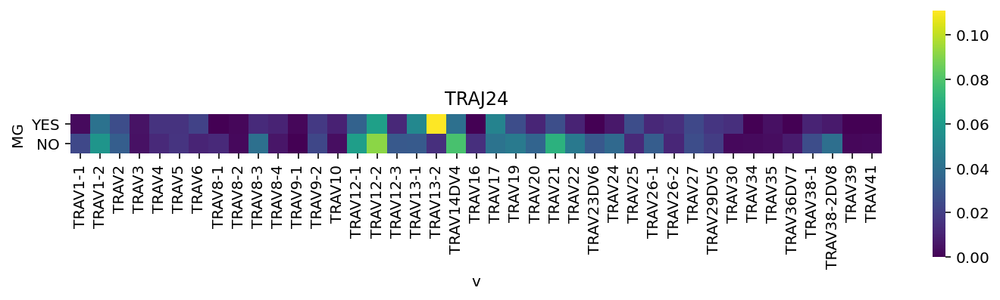

In [219]:
plt.figure(figsize=(12,3))
sns.heatmap(df_TRAJ24.sum(level=0).loc[['YES', 'NO'],[x for x in list_av if x in df_TRAJ24.columns]], 
            square=True, cmap='viridis')
plt.title(u)
plt.savefig('vdjplots/TRAJ24.heatmap.pdf', bbox_inches='tight')

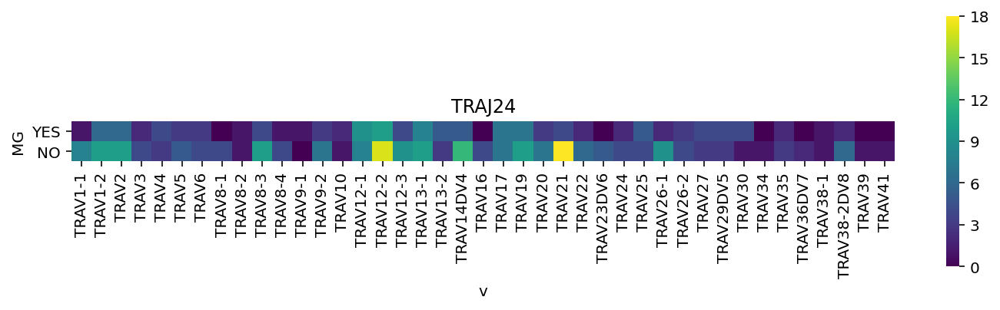

In [220]:
plt.figure(figsize=(12,3))
sns.heatmap((df_TRAJ24 > 0).sum(level=0).loc[['YES', 'NO'],[x for x in list_av if x in df_TRAJ24.columns]], square=True, cmap='viridis')
plt.title(u)
plt.savefig('vdjplots/TRAJ24.count.heatmap.pdf', bbox_inches='tight')

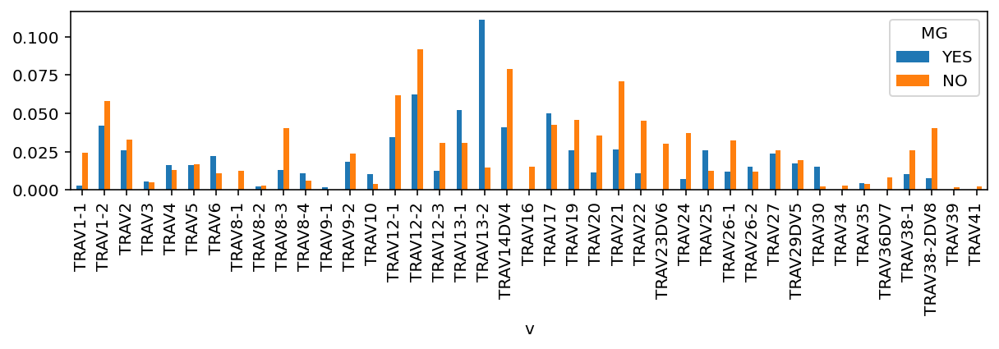

In [221]:
df_TRAJ24.sum(level=0).loc[['YES', 'NO'],
                           [x for x in list_av if x in df_TRAJ24.columns]].T.plot.bar(figsize=(10,2))
plt.savefig('vdjplots/TRAJ24.bar.pdf', bbox_inches='tight')

In [222]:
list_p_traj24 = []
for pos,row in df_TRAJ24.T.iterrows():
    print(pos)
    res = stats.mannwhitneyu(row['YES'], row['NO'])
    list_p_traj24.append(res[1])
res_bh_traj24 = multi.multipletests(list_p_traj24, method="fdr_bh", alpha=0.1)
print(np.array(list_p_traj24)[res_bh_traj24[0]])

TRAV1-1
TRAV1-2
TRAV2
TRAV3
TRAV4
TRAV5
TRAV6
TRAV8-1
TRAV8-2
TRAV8-3
TRAV8-4
TRAV9-1
TRAV9-2
TRAV10
TRAV12-1
TRAV12-2
TRAV12-3
TRAV13-1
TRAV13-2
TRAV14DV4
TRAV16
TRAV17
TRAV19
TRAV20
TRAV21
TRAV22
TRAV23DV6
TRAV24
TRAV25
TRAV26-1
TRAV26-2
TRAV27
TRAV29DV5
TRAV30
TRAV34
TRAV35
TRAV36DV7
TRAV38-1
TRAV38-2DV8
TRAV39
TRAV41
[]


In [223]:
res_bh_traj24

(array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([0.31158377, 0.42416202, 0.42416202, 0.4958692 , 0.31158377,
        0.47174158, 0.42037332, 0.31158377, 0.42037332, 0.42037332,
        0.42037332, 0.31158377, 0.42416202, 0.32684798, 0.31158377,
        0.42037332, 0.42037332, 0.32684798, 0.31158377, 0.42037332,
        0.31158377, 0.31158377, 0.42037332, 0.42037332, 0.31158377,
        0.42037332, 0.31158377, 0.47174158, 0.31158377, 0.31158377,
        0.42037332, 0.31158377, 0.31158377, 0.31158377, 0.42037332,
        0.42416202, 0.34341151, 0.42037332, 0.42037332, 0.42037332,
        0.42037332]),
 0.0025664696455796054,
 0.0024390243902439024)

In [224]:
row['YES']

sample_id
TCGA-3G-AB19    0.0
TCGA-3S-AAYX    0.0
TCGA-4V-A9QI    0.0
TCGA-4V-A9QR    0.0
TCGA-4V-A9QS    0.0
TCGA-4V-A9QT    0.0
TCGA-4V-A9QW    0.0
TCGA-4X-A9FD    0.0
TCGA-5U-AB0E    0.0
TCGA-X7-A8D6    0.0
TCGA-X7-A8DG    0.0
TCGA-X7-A8M7    0.0
TCGA-XM-A8RI    0.0
TCGA-XU-A92V    0.0
TCGA-XU-A92X    0.0
TCGA-XU-A930    0.0
TCGA-XU-A931    0.0
TCGA-XU-A932    0.0
TCGA-XU-AAXV    0.0
TCGA-XU-AAXW    0.0
TCGA-XU-AAXX    0.0
TCGA-XU-AAXY    0.0
TCGA-YT-A95G    0.0
TCGA-ZB-A961    0.0
TCGA-ZB-A96F    0.0
TCGA-ZB-A96G    0.0
TCGA-ZB-A96I    0.0
TCGA-ZB-A96M    0.0
TCGA-ZC-AAAA    0.0
TCGA-ZC-AAAF    0.0
Name: TRAV41, dtype: float64

In [225]:
df_vdj[df_vdj['j'] == u].groupby(by=['v', 'MG']).mean()['freq'].loc['TRAV13-2']

MG
NO     0.004932
YES    0.018504
Name: freq, dtype: float64

In [226]:
df_vdj[df_vdj['j'] == u].groupby(by=['v', 'MG']).count()['freq'].loc['TRAV13-2']

MG
NO     3
YES    6
Name: freq, dtype: int64

In [227]:
df_vdj.loc[(df_vdj['v'] == 'TRAV13-2') & (df_vdj['j'] == 'TRAJ24') & (df_vdj['MG'] == 'YES')]

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
0,6,0.076923,TGTGCAGAGAATAAGGCAACTGACAGCTGGGGGAAATTCCAGTTT,CAENKATDSWGKFQF,TRAV13-2,.,TRAJ24,12,-1,-1,16,TCGA-XU-A92V,YES
2,2,0.025641,TGTGCAGAGAATAAGGCAACTGACAGCTGGGGGAAATTGCAGTTT,CAENKATDSWGKLQF,TRAV13-2,.,TRAJ24,12,-1,-1,16,TCGA-XU-A92V,YES
510,1,0.001560,TGTGCAGAGGGGTACAGCTGGGGGAAATTGCAGTTT,CAEGYSWGKLQF,TRAV13-2,.,TRAJ24,8,-1,-1,13,TCGA-XU-AAXV,YES
67,1,0.002747,TGTGCAGAGTTCCCCCAGGAAACTGACAGCTGGGGGAAATTGCAGTTT,CAEFPQETDSWGKLQF,TRAV13-2,.,TRAJ24,8,-1,-1,20,TCGA-3S-AAYX,YES
125,1,0.002439,TGTGCAGAGAAAAGCTGGGGGAAATTGCAGTTT,CAEKSWGKLQF,TRAV13-2,.,TRAJ24,10,-1,-1,12,TCGA-XU-A930,YES
87,1,0.001715,TGTGCAGAGAACCTTATGACAACTGACAGCTGGGGGAAATTGCAGTTT,CAENLMTTDSWGKLQF,TRAV13-2,.,TRAJ24,10,-1,-1,15,TCGA-4V-A9QT,YES


In [228]:
df_vdj.loc[(df_vdj['v'] == 'TRAV13-2') & (df_vdj['j'] == 'TRAJ24') & (df_vdj['MG'] == 'YES')].to_csv(
    'vdjfiles_TRA/TRAJ24_TRAV13-2.txt', sep='\t', index=None)

In [229]:
!head vdjfiles_TRA/vdjfiles_TRA.TCGA-X7-A8D7.txt

count	freq	cdr3nt	cdr3aa	v	d	j	VEnd	DStart	DEnd	JStart
14	0.011456628477905073	TGTGCTACGGACCCCACTGGAGCCAATAGTAAGCTGACATTT	CATDPTGANSKLTF	TRAV17	.	TRAJ56	11	-1	-1	15
12	0.009819967266775777	TGTGCTGTGGAGGGGTTAACTCAGGGCGGATCTGAAAAGCTGGTCTTT	CAVEGLTQGGSEKLVF	TRAV21	.	TRAJ57	8	-1	-1	16
11	0.00900163666121113	TGTGCTCGGGCCCAGTATTATGGAGGAAGCCAAGGAAATCTCATCTTT	CARAQYYGGSQGNLIF	TRAV9-2	.	TRAJ42	6	-1	-1	16
9	0.007364975450081834	TGTGCTGTCTATAACACCGACAAGCTCATCTTT	CAVYNTDKLIF	TRAV41	.	TRAJ34	8	-1	-1	9
5	0.004091653027823241	TGTGCAGTCGGTGGTGCTACAAACAAGCTCATCTTT	CAVGGATNKLIF	TRAV25	.	TRAJ32	6	-1	-1	12
4	0.0032733224222585926	TGTGCTGTGCAAGGTGGAGGCTTCAAAACTATCTTT	CAVQGGGFKTIF	TRAV20	.	TRAJ9	10	-1	-1	14
4	0.0032733224222585926	TGTGCTTTCACTTTTGGAAATGAGAAATTAACCTTT	CAFTFGNEKLTF	TRAV13-1	.	TRAJ48	4	-1	-1	12
4	0.0032733224222585926	TGTGCTACGGACCTCATCACGGGAGGAGGAAACAAACTCACCTTT	CATDLITGGGNKLTF	TRAV17	.	TRAJ10	11	-1	-1	16
4	0.0032733224222585926	TGTGCTCTGACCTCGAACCAGGCAGGAACTGCTCTGATCTTT	CALTSNQAGTALIF	TRAV9-

In [230]:
df_vdj.loc[(df_vdj['v'] == 'TRAV13-2') & (df_vdj['j'] == 'TRAJ24') & (df_vdj['MG'] == 'NO')]

,count,freq,cdr3nt,cdr3aa,v,d,j,VEnd,DStart,DEnd,JStart,sample_id,MG
68,1,0.010753,TGTGCAGAGAAAACTGACAGCTGGGGGAAATTGCAGTTT,CAEKTDSWGKLQF,TRAV13-2,.,TRAJ24,10,-1,-1,11,TCGA-XM-AAZ1,NO
368,1,0.001802,TGTGCAAGGACAACTGACAGCTGGGGGAAATTGCAGTTT,CARTTDSWGKLQF,TRAV13-2,.,TRAJ24,5,-1,-1,8,TCGA-ZB-A96R,NO
283,1,0.002242,TGTGCAGAGAATACCGACAGCTGGGGGAAATTGCAGTTT,CAENTDSWGKLQF,TRAV13-2,.,TRAJ24,12,-1,-1,15,TCGA-X7-A8DB,NO


In [231]:
df_avj = pd.DataFrame(np.zeros([len(list_av),len(list_aj)]))
df_avj.index = list_av
df_avj.columns = list_aj

In [232]:
for v in list_av:
    for j in list_aj:
        f_y = df_vdj.loc[(df_vdj['v'] == v) & (df_vdj['j'] == j) & (df_vdj['MG'] == 'YES'), 'freq'].sum()
        f_n = df_vdj.loc[(df_vdj['v'] == v) & (df_vdj['j'] == j) & (df_vdj['MG'] == 'NO'), 'freq'].sum()

In [233]:
df_vdj.loc[(df_vdj['v'] == v) & (df_vdj['j'] == j) & (df_vdj['MG'] == 'YES'), 'freq']

83    0.002123
Name: freq, dtype: float64

In [234]:
df_vdj.loc[(df_vdj['v'] == v) & (df_vdj['j'] == j) & (df_vdj['MG'] == 'YES'), 'freq'].sum()

0.002123142250530785

In [235]:
chain = 'TRB'
df_stats = pd.read_csv('vdjfiles_{}/out/0.basicstats.txt'.format(chain), sep='\t')

i = 0
for pos,row in df_stats.iterrows():
    s = row['sample_id']
    mg = row['MG']
    d = pd.read_csv('vdjfiles_{c}/vdjfiles_{c}.{s}.txt'.format(c=chain, s=s), sep='\t')
    d['sample_id'] = s
    d['MG'] = mg

    if i == 0:
        df_vdj = d.copy()
        i = 1
    else:
        df_vdj = pd.concat([df_vdj, d], axis=0)

In [236]:
df_v = df_vdj.groupby(['sample_id', 'v']).count()['count'].unstack().fillna(0)
df_v = df_v.T.div(df_v.sum(axis=1), axis=1)

df_d = df_vdj.groupby(['sample_id', 'd']).count()['count'].unstack().fillna(0)
df_d = df_d.T.div(df_d.sum(axis=1), axis=1)

df_j = df_vdj.groupby(['sample_id', 'j']).count()['count'].unstack().fillna(0)
df_j = df_j.T.div(df_j.sum(axis=1), axis=1)

In [237]:
list_bv = ['TRBV1', 'TRBV2', 'TRBV3-1', 'TRBV3-2', 'TRBV4-1', 'TRBV4-2', 
           'TRBV4-3', 'TRBV5-1', 'TRBV5-2', 'TRBV5-3',
           'TRBV5-4', 'TRBV5-5', 'TRBV5-6', 'TRBV5-7', 'TRBV5-8', 'TRBV6-1',
           'TRBV6-2', 'TRBV6-3', 'TRBV6-4', 'TRBV6-5', 'TRBV6-6', 'TRBV6-7',
           'TRBV6-8', 'TRBV6-9', 'TRBV7-1', 'TRBV7-2', 'TRBV7-3', 'TRBV7-4',
           'TRBV7-5', 'TRBV7-6', 'TRBV7-7', 'TRBV7-8', 'TRBV7-9', 'TRBV9', 'TRBV10-1', 
            'TRBV10-2', 'TRBV10-3', 'TRBV11-1', 'TRBV11-2',
           'TRBV11-3', 'TRBV12-1', 'TRBV12-2', 'TRBV12-3', 'TRBV12-4', 'TRBV12-5',
           'TRBV13', 'TRBV14', 'TRBV15', 'TRBV16', 'TRBV18', 'TRBV19',
           'TRBV20-1', 'TRBV21-1', 'TRBV23-1', 'TRBV24-1', 'TRBV25-1', 'TRBV26',
           'TRBV27', 'TRBV28', 'TRBV29-1', 'TRBV30']

list_bd = ['TRBD1', 'TRBD2']

list_bj = ['TRBJ1-1', 'TRBJ1-2', 'TRBJ1-3',
       'TRBJ1-4', 'TRBJ1-5', 'TRBJ1-6', 'TRBJ2-1', 'TRBJ2-2', 'TRBJ2-3',
       'TRBJ2-4', 'TRBJ2-5', 'TRBJ2-6', 'TRBJ2-7']

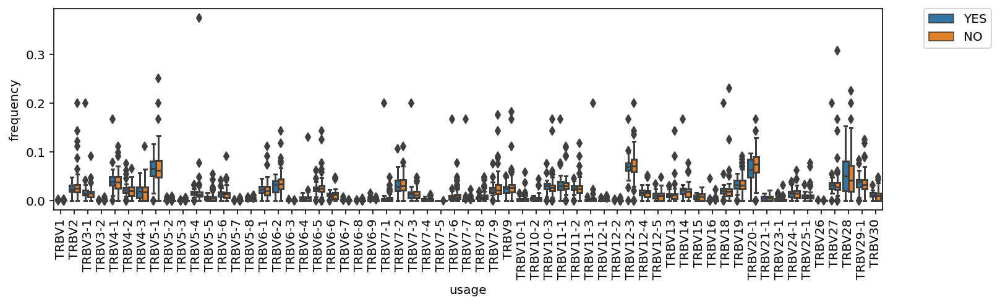

In [238]:
df_v_tidy = df_v.T
df_v_tidy['sampleid'] = df_v_tidy.index
df_v_tidy = df_v_tidy.reset_index(drop=True)
df_v_tidy = df_v_tidy.melt(id_vars=['sampleid'], var_name='usage', value_name='frequency')
df_v_tidy = pd.merge(df_v_tidy, df_cli, on='sampleid')
# df_v_tidy

f = 'primary_pathology_history_myasthenia_gravis'
plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
sns.boxplot(data=df_v_tidy, x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], order=list_bv)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)
plt.savefig('vdjplots/vdj.TRBV.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')

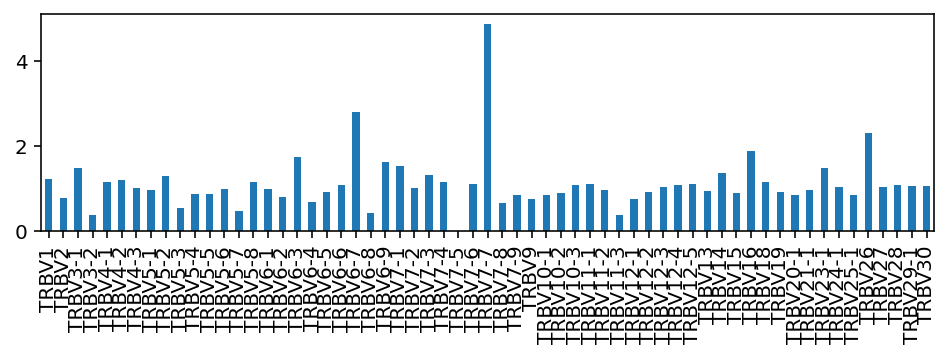

In [239]:
list_ratio = []
for u in list_bv:
    if df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'].mean() > 0:
        r = df_v_tidy.loc[(df_v_tidy[f] =='YES') & (df_v_tidy.usage == u), 'frequency'].mean() / \
                     df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'].mean()
    else:
        r = np.nan
    list_ratio.append(r)
ser_ratio = pd.Series(list_ratio)
ser_ratio.index = list_bv
ser_ratio = ser_ratio.dropna()

plt.figure(figsize=(8,2))
ser_ratio.plot.bar()

In [240]:
list_gini = []
for pos,row in df_v.T.iterrows():
    list_gini.append(gini(np.array(row)))

df_gini_bv = pd.DataFrame(list_gini)
df_gini_bv.columns = ["TRBV"]
df_gini_bv.index = df_v.columns

In [241]:
list_p_bv = []
for u in list_bv:
    print(u)
    res = stats.mannwhitneyu(df_v_tidy.loc[(df_v_tidy[f] =='YES') & (df_v_tidy.usage == u), 'frequency'],
                     df_v_tidy.loc[(df_v_tidy[f] =='NO') & (df_v_tidy.usage == u), 'frequency'])
#     print(res)
    list_p_bv.append(res[1])
res_bh = multi.multipletests(list_p_bv, method="fdr_bh", alpha=0.1)
print(np.array(list_bv)[res_bh[0]])

TRBV1
TRBV2
TRBV3-1
TRBV3-2
TRBV4-1
TRBV4-2
TRBV4-3
TRBV5-1
TRBV5-2
TRBV5-3
TRBV5-4
TRBV5-5
TRBV5-6
TRBV5-7
TRBV5-8
TRBV6-1
TRBV6-2
TRBV6-3
TRBV6-4
TRBV6-5
TRBV6-6
TRBV6-7
TRBV6-8
TRBV6-9
TRBV7-1
TRBV7-2
TRBV7-3
TRBV7-4
TRBV7-5
TRBV7-6
TRBV7-7
TRBV7-8
TRBV7-9
TRBV9
TRBV10-1
TRBV10-2
TRBV10-3
TRBV11-1
TRBV11-2
TRBV11-3
TRBV12-1
TRBV12-2
TRBV12-3
TRBV12-4
TRBV12-5
TRBV13
TRBV14
TRBV15
TRBV16
TRBV18
TRBV19
TRBV20-1
TRBV21-1
TRBV23-1
TRBV24-1
TRBV25-1
TRBV26
TRBV27
TRBV28
TRBV29-1
TRBV30
[]


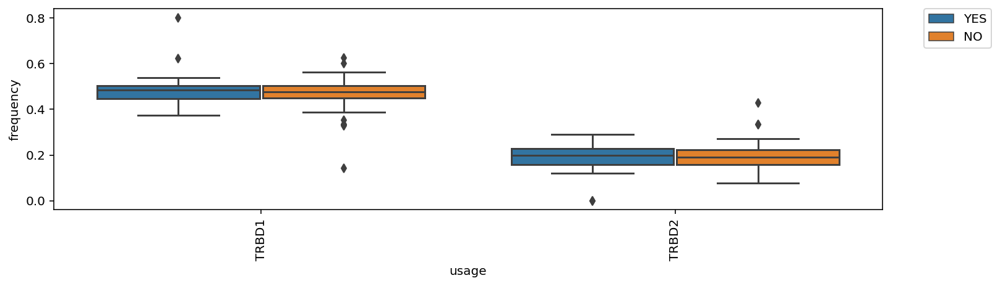

In [242]:
df_d_tidy = df_d.T
df_d_tidy['sampleid'] = df_d_tidy.index
df_d_tidy = df_d_tidy.reset_index(drop=True)
df_d_tidy = df_d_tidy.melt(id_vars=['sampleid'], var_name='usage', value_name='frequency')
df_d_tidy = pd.merge(df_d_tidy, df_cli, on='sampleid')
# df_d_tidy

f = 'primary_pathology_history_myasthenia_gravis'
plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
sns.boxplot(data=df_d_tidy, x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], order=list_bd)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)
plt.savefig('vdjplots/vdj.{c}.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')
plt.savefig('vdjplots/vdj.TRBD.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')

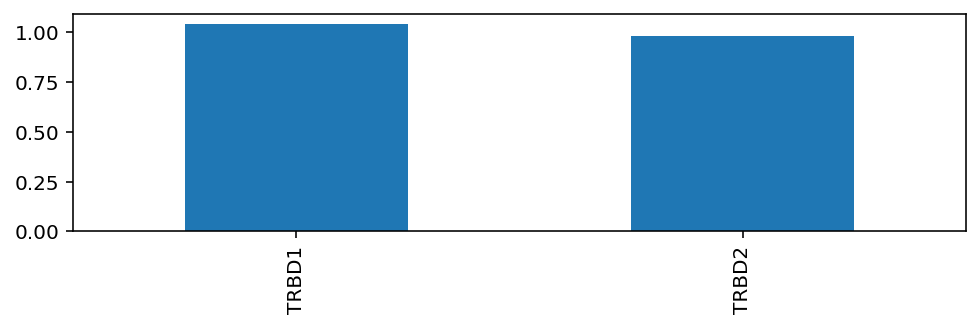

In [243]:
list_ratio = []
for u in list_bd:
    if df_d_tidy.loc[(df_d_tidy[f] =='NO') & (df_d_tidy.usage == u), 'frequency'].mean() > 0:
        r = df_d_tidy.loc[(df_d_tidy[f] =='YES') & (df_d_tidy.usage == u), 'frequency'].mean() / \
                     df_d_tidy.loc[(df_d_tidy[f] =='NO') & (df_d_tidy.usage == u), 'frequency'].mean()
    else:
        r = np.nan
    list_ratio.append(r)
ser_ratio = pd.Series(list_ratio)
ser_ratio.index = list_bd
ser_ratio = ser_ratio.dropna()

plt.figure(figsize=(8,2))
ser_ratio.plot.bar()

In [244]:
list_gini = []
for pos,row in df_d.T.iterrows():
    list_gini.append(gini(np.array(row)))

df_gini_bd = pd.DataFrame(list_gini)
df_gini_bd.columns = ["TRBD"]
df_gini_bd.index = df_d.columns

In [245]:
list_p_bd = []
for u in list_bd:
    print(u)
    res = stats.mannwhitneyu(df_d_tidy.loc[(df_d_tidy[f] =='YES') & (df_d_tidy.usage == u), 'frequency'],
                     df_d_tidy.loc[(df_d_tidy[f] =='NO') & (df_d_tidy.usage == u), 'frequency'])
#     print(res)
    list_p_bd.append(res[1])
res_bh = multi.multipletests(list_p_bd, method="fdr_bh", alpha=0.1)
print(np.array(list_bd)[res_bh[0]])

TRBD1
TRBD2
[]


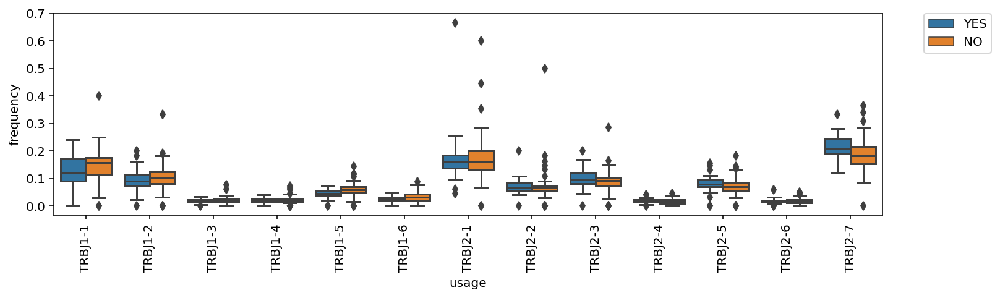

In [246]:
df_j_tidy = df_j.T
df_j_tidy['sampleid'] = df_j_tidy.index
df_j_tidy = df_j_tidy.reset_index(drop=True)
df_j_tidy = df_j_tidy.melt(id_vars=['sampleid'], var_name='usage', value_name='frequency')
df_j_tidy = pd.merge(df_j_tidy, df_cli, on='sampleid')
# df_d_tidy

f = 'primary_pathology_history_myasthenia_gravis'
plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
sns.boxplot(data=df_j_tidy, x='usage', y='frequency', hue=f, dodge=True, 
            hue_order=dict_hue_order[f], order=list_bj)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)
plt.savefig('vdjplots/vdj.{c}.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')
plt.savefig('vdjplots/vdj.TRBJ.{f}.pdf'.format(c=chain, f=f), bbox_inches='tight')

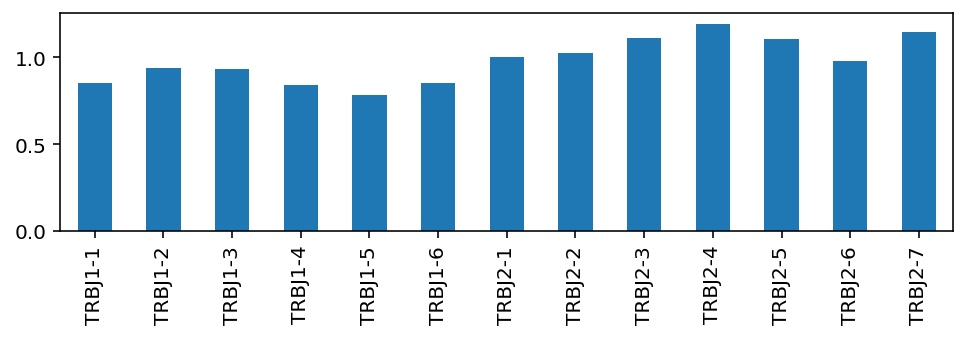

In [247]:
list_ratio = []
for u in list_bj:
    if df_j_tidy.loc[(df_j_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'].mean() > 0:
        r = df_j_tidy.loc[(df_j_tidy[f] =='YES') & (df_j_tidy.usage == u), 'frequency'].mean() / \
                     df_j_tidy.loc[(df_j_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'].mean()
    else:
        r = np.nan
    list_ratio.append(r)
ser_ratio = pd.Series(list_ratio)
ser_ratio.index = list_bj
ser_ratio = ser_ratio.dropna()

plt.figure(figsize=(8,2))
ser_ratio.plot.bar()

In [248]:
list_gini = []
for pos,row in df_j.T.iterrows():
    list_gini.append(gini(np.array(row)))

df_gini_bj = pd.DataFrame(list_gini)
df_gini_bj.columns = ["TRBJ"]
df_gini_bj.index = df_j.columns

In [249]:
list_p_bj = []
for u in list_bj:
    print(u)
    res = stats.mannwhitneyu(df_j_tidy.loc[(df_j_tidy[f] =='YES') & (df_j_tidy.usage == u), 'frequency'],
                     df_j_tidy.loc[(df_d_tidy[f] =='NO') & (df_j_tidy.usage == u), 'frequency'])
#     print(res)
    list_p_bj.append(res[1])
res_bh = multi.multipletests(list_p_bj, method="fdr_bh", alpha=0.1)
print(np.array(list_bj)[res_bh[0]])

TRBJ1-1
TRBJ1-2
TRBJ1-3
TRBJ1-4
TRBJ1-5
TRBJ1-6
TRBJ2-1
TRBJ2-2
TRBJ2-3
TRBJ2-4
TRBJ2-5
TRBJ2-6
TRBJ2-7
['TRBJ1-5']


In [250]:
df_v.loc[list_bv]

sample_id,TCGA-3G-AB0O,TCGA-3G-AB0Q,TCGA-3G-AB0T,TCGA-3G-AB19,TCGA-3Q-A9WF,TCGA-3S-A8YW,TCGA-3S-AAYX,TCGA-3T-AA9L,TCGA-4V-A9QI,TCGA-4V-A9QJ,TCGA-4V-A9QL,TCGA-4V-A9QM,TCGA-4V-A9QN,TCGA-4V-A9QR,TCGA-4V-A9QS,TCGA-4V-A9QT,TCGA-4V-A9QU,TCGA-4V-A9QW,TCGA-4V-A9QX,TCGA-4X-A9F9,TCGA-4X-A9FA,TCGA-4X-A9FB,TCGA-4X-A9FC,TCGA-4X-A9FD,TCGA-5G-A9ZZ,TCGA-5U-AB0D,TCGA-5U-AB0E,TCGA-5U-AB0F,TCGA-5V-A9RR,TCGA-X7-A8D6,TCGA-X7-A8D7,TCGA-X7-A8D8,TCGA-X7-A8DB,TCGA-X7-A8DD,TCGA-X7-A8DE,TCGA-X7-A8DG,TCGA-X7-A8DJ,TCGA-X7-A8M0,TCGA-X7-A8M1,TCGA-X7-A8M3,TCGA-X7-A8M4,TCGA-X7-A8M5,TCGA-X7-A8M6,TCGA-X7-A8M7,TCGA-X7-A8M8,TCGA-XH-A853,TCGA-XM-A8R8,TCGA-XM-A8R9,TCGA-XM-A8RB,TCGA-XM-A8RC,...,TCGA-XU-A92X,TCGA-XU-A92Y,TCGA-XU-A92Z,TCGA-XU-A930,TCGA-XU-A931,TCGA-XU-A932,TCGA-XU-A933,TCGA-XU-A936,TCGA-XU-AAXV,TCGA-XU-AAXW,TCGA-XU-AAXX,TCGA-XU-AAXY,TCGA-XU-AAXZ,TCGA-XU-AAY0,TCGA-XU-AAY1,TCGA-YT-A95D,TCGA-YT-A95E,TCGA-YT-A95F,TCGA-YT-A95G,TCGA-YT-A95H,TCGA-ZB-A961,TCGA-ZB-A962,TCGA-ZB-A963,TCGA-ZB-A964,TCGA-ZB-A965,TCGA-ZB-A966,TCGA-ZB-A969,TCGA-ZB-A96A,TCGA-ZB-A96B,TCGA-ZB-A96C,TCGA-ZB-A96D,TCGA-ZB-A96E,TCGA-ZB-A96F,TCGA-ZB-A96G,TCGA-ZB-A96H,TCGA-ZB-A96I,TCGA-ZB-A96K,TCGA-ZB-A96L,TCGA-ZB-A96M,TCGA-ZB-A96O,TCGA-ZB-A96P,TCGA-ZB-A96Q,TCGA-ZB-A96R,TCGA-ZB-A96V,TCGA-ZC-AAA7,TCGA-ZC-AAAA,TCGA-ZC-AAAF,TCGA-ZC-AAAH,TCGA-ZL-A9V6,TCGA-ZT-A8OM
v,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TRBV1,0.000412,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003035,0.000000,0.000000,0.000000,0.000000,0.000678,0.000000,0.001309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000951,0.000279,0.000000,0.001176,0.000000,0.000872,0.001278,0.000000,0.000000,0.000000,0.0,0.001027,0.000000,0.000000,0.000000,0.000000,0.000000,0.003311,0.000000,0.000552,0.002755,...,0.002174,0.000,0.0,0.000000,0.000000,0.002392,0.000000,0.000000,0.000000,0.000000,0.000723,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000734,0.000000,0.000000,0.000000,0.000000,0.000897,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000307,0.000000,0.001033,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TRBV2,0.023878,0.000000,0.026087,0.048193,0.040836,0.000000,0.022519,0.020118,0.018939,0.024768,0.011628,0.033597,0.000000,0.015106,0.036612,0.026558,0.012140,0.031042,0.021289,0.022851,0.000000,0.021680,0.028404,0.039267,0.018519,0.142857,0.019272,0.030612,0.000000,0.029496,0.036044,0.005848,0.027631,0.035461,0.025283,0.023860,0.009333,0.032389,0.026738,0.0,0.020534,0.032258,0.018116,0.019549,0.047244,0.052632,0.036424,0.028169,0.033683,0.024793,...,0.045652,0.005,0.2,0.018692,0.000000,0.038278,0.086957,0.025773,0.025204,0.018677,0.038295,0.016717,0.000000,0.012422,0.023729,0.054054,0.021154,0.026738,0.033857,0.018112,0.032787,0.000,0.026350,0.000000,0.111111,0.018868,0.064516,0.033360,0.034508,0.022222,0.022876,0.038462,0.025937,0.031390,0.000000,0.046154,0.025157,0.005348,0.019310,0.027215,0.023006,0.015674,0.033058,0.037190,0.033333,0.023704,0.020270,0.031546,0.010101,0.032787
TRBV3-1,0.018938,0.000000,0.014493,0.042169,0.018993,0.000000,0.012510,0.016568,0.005682,0.012384,0.007752,0.017787,0.000000,0.024169,0.020818,0.025474,0.016692,0.011086,0.013601,0.015234,0.015152,0.014905,0.015873,0.013089,0.037037,0.000000,0.014989,0.010204,0.007752,0.010466,0.022073,0.000000,0.012346,0.021277,0.010462,0.021730,0.016000,0.020243,0.021390,0.2,0.014374,0.006452,0.014493,0.009023,0.026575,0.008772,0.023179,0.035211,0.019879,0.019284,...,0.021739,0.020,0.0,0.032710,0.020833,0.019139,0.000000,0.005155,0.017030,0.024125,0.018786,0.015198,0.000000,0.015528,0.017797,0.027027,0.021154,0.008021,0.015719,0.013172,0.016393,0.000,0.015810,0.000000,0.000000,0.018868,0.000000,0.021155,0.016887,0.000000,0.016340,0.019231,0.008646,0.012556,0.000000,0.015385,0.014675,0.010695,0.00965

In [251]:
df_gini = pd.concat([df_gini_av, df_gini_aj, df_gini_bv, df_gini_bd, df_gini_bj], axis=1)
df_gini

,TRAV,TRAJ,TRBV,TRBD,TRBJ
sample_id,,,,,
TCGA-3G-AB0O,0.469986,0.372680,0.569063,0.822944,0.573898
TCGA-3G-AB0Q,0.715929,0.726627,0.706913,0.835771,0.591104
TCGA-3G-AB0T,0.544585,0.505928,0.603560,0.842511,0.514918
TCGA-3G-AB19,0.567636,0.469838,0.642698,0.832930,0.583982
TCGA-3Q-A9WF,0.447180,0.446061,0.598131,0.840771,0.575609
...,...,...,...,...,...
TCGA-ZC-AAAA,0.537137,0.461150,0.592589,0.838320,0.578300
TCGA-ZC-AAAF,0.613075,0.548377,0.557761,0.849548,0.544514
TCGA-ZC-AAAH,0.543880,0.460417,0.589816,0.827058,0.521432


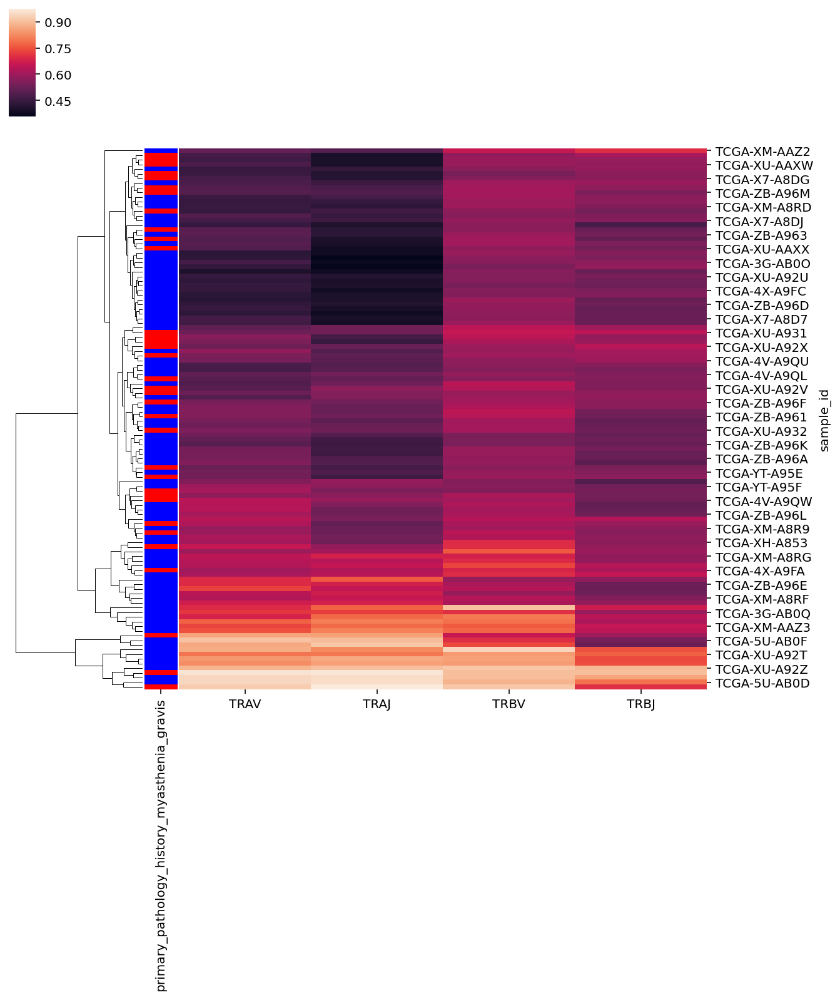

In [293]:
f = 'primary_pathology_history_myasthenia_gravis'
lut = dict(zip(df_cli.loc[df_gini.index, f].unique(), "br"))
col_colors = df_cli.loc[df_gini.index, f].map(lut)

sns.clustermap(df_gini[['TRAV', 'TRAJ', 'TRBV', 'TRBJ']], row_colors=col_colors, col_cluster=False)

In [301]:
df_gini_sort = df_gini.loc[df_gini.sum(axis=1).sort_values(ascending=False).index]
df_gini_sort

,TRAV,TRAJ,TRBV,TRBD,TRBJ
sample_id,,,,,
TCGA-XU-AAXZ,0.962259,0.968248,0.901634,0.866665,0.901959
TCGA-ZB-A964,0.943391,0.952375,0.901634,0.799999,0.862744
TCGA-XU-A92Z,0.886788,0.904756,0.918027,0.853332,0.894116
TCGA-X7-A8M3,0.924523,0.976184,0.918027,0.906665,0.705881
TCGA-5U-AB0D,0.943391,0.952375,0.885241,0.838094,0.789915
...,...,...,...,...,...
TCGA-4X-A9FB,0.439278,0.363054,0.548266,0.826331,0.585843
TCGA-XM-A8RL,0.433695,0.356664,0.573449,0.840694,0.553049
TCGA-ZB-A96P,0.433159,0.382467,0.578152,0.830960,0.521652


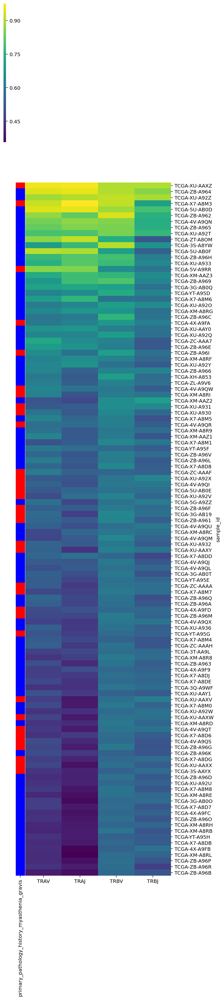

In [305]:
f = 'primary_pathology_history_myasthenia_gravis'
lut = dict(zip(df_cli.loc[df_gini_sort.index, f].unique(), "rb"))
col_colors = df_cli.loc[df_gini_sort.index, f].map(lut)

sns.clustermap(df_gini_sort[['TRAV', 'TRAJ', 'TRBV', 'TRBJ']], row_colors=col_colors,
               col_cluster=False, row_cluster=False, figsize=(6,32), cmap='viridis')

In [228]:
f = 'primary_pathology_history_myasthenia_gravis'
lut = dict(zip(df_cli.loc[df_v.columns, f].unique(), "br"))
col_colors = df_cli.loc[df_v.columns, f].map(lut)

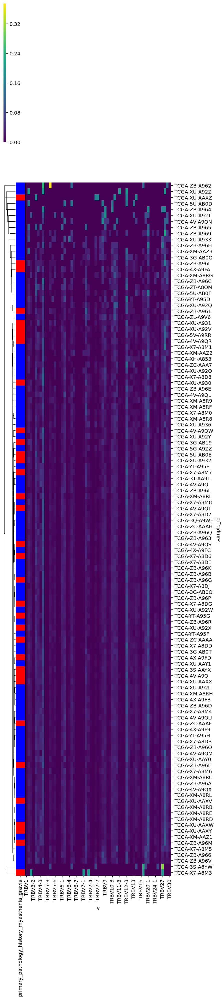

In [238]:
sns.clustermap(df_v.T[list_bv], cmap='viridis', row_colors=col_colors, col_cluster=False, figsize=(6,32))

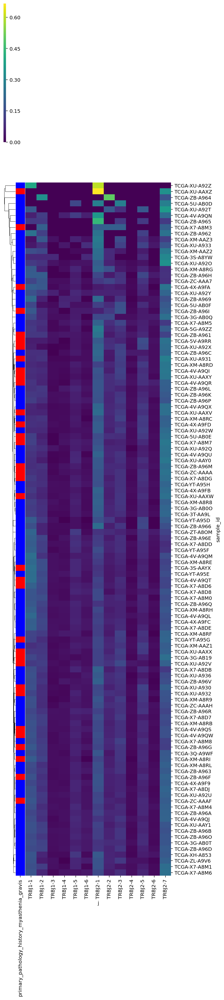

In [239]:
sns.clustermap(df_j.T[list_bj], cmap='viridis', row_colors=col_colors, col_cluster=False, figsize=(6,32))

In [56]:
df_vdj.groupby(['sample_id', 'v']).count()['count']

sample_id     v       
TCGA-3G-AB0O  TRAV1-1      9
              TRAV1-2     11
              TRAV10       7
              TRAV11       1
              TRAV12-1    19
                          ..
TCGA-ZT-A8OM  TRAV2        1
              TRAV21       1
              TRAV22       1
              TRAV27       1
              TRAV8-2      1
Name: count, Length: 3989, dtype: int64

In [63]:
df_cli[df_cli[f] == 'YES'].index

Index(['TCGA-3G-AB19', 'TCGA-3S-AAYX', 'TCGA-4V-A9QI', 'TCGA-4V-A9QR',
       'TCGA-4V-A9QS', 'TCGA-4V-A9QT', 'TCGA-4V-A9QW', 'TCGA-4X-A9FA',
       'TCGA-4X-A9FD', 'TCGA-5U-AB0E', 'TCGA-5V-A9RR', 'TCGA-X7-A8D6',
       'TCGA-X7-A8DG', 'TCGA-X7-A8M3', 'TCGA-X7-A8M7', 'TCGA-XM-A8RI',
       'TCGA-XU-A92V', 'TCGA-XU-A92X', 'TCGA-XU-A930', 'TCGA-XU-A931',
       'TCGA-XU-A932', 'TCGA-XU-AAXV', 'TCGA-XU-AAXW', 'TCGA-XU-AAXX',
       'TCGA-XU-AAXY', 'TCGA-XU-AAXZ', 'TCGA-YT-A95G', 'TCGA-ZB-A961',
       'TCGA-ZB-A96F', 'TCGA-ZB-A96G', 'TCGA-ZB-A96I', 'TCGA-ZB-A96M',
       'TCGA-ZC-AAAA', 'TCGA-ZC-AAAF'],
      dtype='object', name='index')

In [74]:
df_v.T.stack()

sample_id     v       
TCGA-3G-AB0O  TRAV1-1     0.014563
              TRAV1-2     0.017799
              TRAV10      0.011327
              TRAV11      0.001618
              TRAV12-1    0.030744
                            ...   
TCGA-ZT-A8OM  TRAV9-1     0.000000
              TRAV9-2     0.000000
              TRDV1       0.000000
              TRDV2       0.000000
              TRDV3       0.000000
Length: 6148, dtype: float64

In [ ]:
df_v.T.stack()

In [91]:
df_v['usage'] = df_v.index
pd.melt(df_v, value_name='frequency', id_vars=['usage'])

,usage,sample_id,frequency
0,TRAV1-1,TCGA-3G-AB0O,0.0145631
1,TRAV1-2,TCGA-3G-AB0O,0.0177994
2,TRAV10,TCGA-3G-AB0O,0.0113269
3,TRAV11,TCGA-3G-AB0O,0.00161812
4,TRAV12-1,TCGA-3G-AB0O,0.0307443
...,...,...,...
6196,TRAV9-1,sample_id,TRAV9-1
6197,TRAV9-2,sample_id,TRAV9-2
6198,TRDV1,sample_id,TRDV1
6199,TRDV2,sample_id,TRDV2


In [75]:
plt.figure(figsize=(12,3))
#     sns.swarmplot(data=df_igh_tidy, x='Igclass', y='frequency', hue=f, dodge=True)
sns.boxplot(data=df_v.T.stack(), x='Igclass', y='frequency', hue=f, dodge=True, hue_order=dict_hue_order[f])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('vdjplots/vdj.{c}.{f}.pdf'.format(c=c, f=f), bbox_inches='tight')

NameError: name 'df_igh_tidy' is not defined

<Figure size 864x216 with 0 Axes>

In [65]:
df_v.T.loc[df_cli[df_cli[f] == 'YES'].index].

v,TRAV1-1,TRAV1-2,TRAV10,TRAV11,TRAV12-1,TRAV12-2,TRAV12-3,TRAV13-1,TRAV13-2,TRAV14DV4,TRAV15,TRAV16,TRAV17,TRAV19,TRAV2,TRAV20,TRAV21,TRAV22,TRAV23DV6,TRAV24,TRAV25,TRAV26-1,TRAV26-2,TRAV27,TRAV28,TRAV29DV5,TRAV3,TRAV30,TRAV32,TRAV34,TRAV35,TRAV36DV7,TRAV38-1,TRAV38-2DV8,TRAV39,TRAV4,TRAV40,TRAV41,TRAV5,TRAV6,TRAV7,TRAV8-1,TRAV8-2,TRAV8-3,TRAV8-4,TRAV8-5,TRAV8-6,TRAV8-7,TRAV9-1,TRAV9-2,TRDV1,TRDV2,TRDV3
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TCGA-3G-AB19,0.012121,0.012121,0.006061,0.000000,0.048485,0.072727,0.054545,0.036364,0.048485,0.048485,0.000000,0.006061,0.054545,0.000000,0.006061,0.018182,0.042424,0.024242,0.012121,0.012121,0.024242,0.012121,0.006061,0.030303,0.0,0.042424,0.024242,0.006061,0.0,0.000000,0.000000,0.000000,0.036364,0.078788,0.012121,0.024242,0.000000,0.018182,0.012121,0.024242,0.0,0.000000,0.030303,0.036364,0.006061,0.000000,0.006061,0.000000,0.006061,0.036364,0.012121,0.000000,0.000000
TCGA-3S-AAYX,0.017910,0.047761,0.011940,0.002985,0.023881,0.026866,0.026866,0.056716,0.014925,0.035821,0.002985,0.011940,0.050746,0.044776,0.032836,0.020896,0.035821,0.011940,0.023881,0.008955,0.005970,0.035821,0.011940,0.014925,0.0,0.023881,0.005970,0.005970,0.0,0.002985,0.011940,0.008955,0.014925,0.023881,0.002985,0.041791,0.017910,0.014925,0.011940,0.041791,0.0,0.035821,0.032836,0.017910,0.023881,0.000000,0.002985,0.000000,0.005970,0.029851,0.038806,0.002985,0.000000
TCGA-4V-A9QI,0.038835,0.048544,0.000000,0.000000,0.029126,0.038835,0.038835,0.058252,0.038835,0.087379,0.000000,0.019417,0.029126,0.029126,0.038835,0.009709,0.038835,0.019417,0.009709,0.029126,0.000000,0.009709,0.009709,0.000000,0.0,0.009709,0.019417,0.000000,0.0,0.000000,0.009709,0.000000,0.019417,0.019417,0.058252,0.029126,0.009709,0.000000,0.029126,0.009709,0.0,0.000000,0.019417,0.048544,0.029126,0.000000,0.019417,0.000000,0.000000,0.038835,0.009709,0.000000,0.000000
TCGA-4V-A9QR,0.024691,0.012346,0.000000,0.000000,0.037037,0.037037,0.049383,0.012346,0.049383,0.098765,0.000000,0.049383,0.024691,0.024691,0.012346,0.037037,0.061728,0.012346,0.012346,0.012346,0.000000,0.012346,0.024691,0.012346,0.0,0.037037,0.024691,0.000000,0.0,0.000000,0.000000,0.012346,0.024691,0.074074,0.000000,0.024691,0.012346,0.000000,0.012346,0.000000,0.0,0.000000,0.012346,0.061728,0.037037,0.012346,0.012346,0.000000,0.012346,0.012346,0.000000,0.000000,0.000000
TCGA-4V-A9QS,0.003650,0.000000,0.014599,0.000000,0.043796,0.062044,0.007299,0.032847,0.029197,0.029197,0.000000,0.025547,0.051095,0.032847,0.014599,0.007299,0.058394,0.021898,0.018248,0.010949,0.018248,0.054745,0.014599,0.021898,0.0,0.032847,0.043796,0.021898,0.0,0.003650,0.014599,0.014599,0.040146,0.032847,0.007299,0.032847,0.007299,0.043796,0.014599,0.021898,0.0,0.010949,0.003650,0.021898,0.032847,0.000000,0.000000,0.000000,0.000000,0.014599,0.003650,0.000000,0.007299
TCGA-4V-A9QT,0.014545,0.025455,0.029091,0.000000,0.061818,0.047273,0.038182,0.050909,0.021818,0.030909,0.000000,0.030909,0.034545,0.021818,0.040000,0.018182,0.078182,0.007273,0.018182,0.010909,0.020000,0.014545,0.014545,0.014545,0.0,0.034545,0.020000,0.009091,0.0,0.000000,0.012727,0.012727,0.018182,0.016364,0.010909,0.014545,0.007273,0.014545,0.018182,0.014545,0.0,0.012727,0.010909,0.027273,0.025455,0.000000,0.005455,0.001818,0.000000,0.030909,0.034545,0.003636,0.000000
TCGA-4V-A9QW,0.000000,0.039216,0.000000,0.000000,0.058824,0.000000,0.019608,0.000000,0.019608,0.058824,0.000000,0.000000,0.019608,0.039216,0.000000,0.019608,0.019608,0.000000,0.000000,0.000000,0.058824,0.000000,0.039216,0.000000,0.0,0.058824,0.000000,0.000000,0.0,0.000000,0.019608,0.058824,0.039216,0.117647,0.000000,0.039216,0.000000,0.039216,0.019608,0.019608,0.0,0.000000,0.019608,0.058824,0.000000,0.019608,0.019608,0.000000,0.019608,0.000000,0.039216,0.000000,0.019608
TCGA-4X-A9FA,0.011494,0.022989,0.011494,0.000000,0.022989,0.080460,0.091954,0.034483,0.011494,0.091954,0.000000,0.000000,0.034483,0.034483,0.034483,0.011494,0.080460,0.011494,0.022989,0.011494,0.011494,0.0114